In [1]:
import os

import warnings
warnings.filterwarnings("ignore")

import logging
logging.getLogger('tensorflow').setLevel(logging.ERROR)

from image_captioner import IC
from instance_segmentation import InstanceSegmenter
from random_seg import RandomSegmenter
from PIC import Explainer
from utils import log_print
from instance_segmentation import InstanceSegmenter
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2 import model_zoo
import matplotlib.pyplot as plt

In [2]:
seg_dataset = 'COCO' #'instance segmentation model dataset: coco'
seg_backbone = 'R_50' #'instance segmentation model backbone: r50'
algorithm = 'quickshift' #'low level segmentation algorithm: quickshift, felzenszwalb or slic'
seg_ksize =20  #'low level segmentation kernel size 
max_dist = 200  #low level segmentation maximum distance
ratio = 0.2 #low level segmentation ratio
text_encoder = 'bert' #'the text encoder that is used in calculating the similarity score: \ count (sklearn CountVectorizer), bert or roberta
blur_ksize = 120
clip_mode = "1" #"0": do not use CLIP (PIC) \n "1": use CLIP in stage 1 \n  "2": use CLIP in stage 2 \n "both": use CLIP in both stages'''
pobj_mode = True #'applying object of preposition rule (True) or not (False)'
improved_XIC = True
stage_hi_sim = True  #using stage result with higher similarity (True) or not (False)
exp_mode = False #Experiment Mode
test_mode = False #run a test if segments are available (Ture) or not (Flase)
test_dir = './data/test'

[08/31 11:03:41 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...
Directory: ./data/test/save_dir/120_1_True_True/ is already available, do you want to overwrite the content? (Y/N)
y


  0%|                                                                                           | 0/27 [00:00<?, ?it/s]

Testing image 0
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:two horses standing in a field



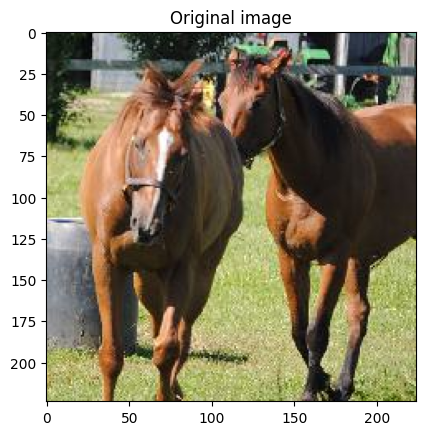

Queries: ['a field', 'two horses']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a field
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (5.873336299999991 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 17%|██████████████                                                                      | 1/6 [00:00<00:02,  2.40it/s]

0.21700451 / 1



 33%|████████████████████████████                                                        | 2/6 [00:00<00:01,  2.33it/s]

0.21625434 / 1



 50%|██████████████████████████████████████████                                          | 3/6 [00:01<00:01,  2.40it/s]

0.2423269 / 1



 67%|████████████████████████████████████████████████████████                            | 4/6 [00:01<00:00,  2.48it/s]

0.21114019 / 1



 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:02<00:00,  2.47it/s]

0.23680791 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.47it/s]


0.22790879 / 1

measuring similarity score for 6 segments is done in 2.450633599999989 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.24232690036296844
Stage 1 is done in less than 1 min (2.4577103999999963 sec)!



3it [00:00, 673.57it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:08<00:16,  8.28s/it]

0.6814356 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:13<00:06,  6.30s/it]

0.15062982 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:17<00:00,  5.96s/it]

0.44898868 / 1

measuring similarity score for 3 segments is done in 17.89152639999999 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.6814355850219727
Stage 2 is done in less than 1 min (17.927848100000006 sec)!
Caption: two horses standing in a field
Query: a field
Answer similarity score: 0.6814355850219727


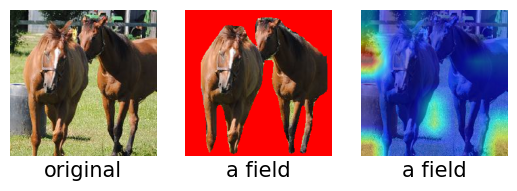

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is two horses
Query dependency is: nummod ROOT
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.002265800000003537 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 17%|██████████████                                                                      | 1/6 [00:00<00:02,  2.43it/s]

0.23524688 / 0.2473094706632653



 33%|████████████████████████████                                                        | 2/6 [00:00<00:01,  2.49it/s]

0.26852888 / 0.23871970663265307



 50%|██████████████████████████████████████████                                          | 3/6 [00:01<00:01,  2.64it/s]

0.29511333 / 0.5153858418367347



 67%|████████████████████████████████████████████████████████                            | 4/6 [00:01<00:00,  2.58it/s]

0.30685177 / 0.4846141581632653



 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:01<00:00,  2.59it/s]

0.3111519 / 0.7626953125



100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.60it/s]


0.30350545 / 0.7541055484693877

measuring similarity score for 6 segments is done in 2.3056410000000085 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (2.315838299999996 sec)!



3it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:06<00:13,  6.75s/it]

0.7723647 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:14<00:07,  7.48s/it]

0.5922181 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:21<00:00,  7.28s/it]

0.52265656 / 1

measuring similarity score for 3 segments is done in 21.852902999999998 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.7723646759986877
Stage 2 is done in less than 1 min (21.89950060000001 sec)!
Caption: two horses standing in a field
Query: two horses
Answer similarity score: 1


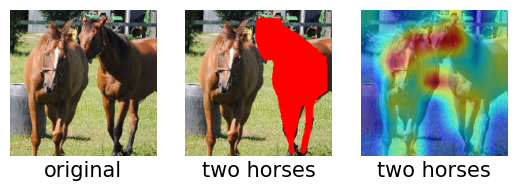

  4%|███                                                                               | 1/27 [01:45<45:45, 105.60s/it]

Testing image 1
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a couple of foxes standing in a forest



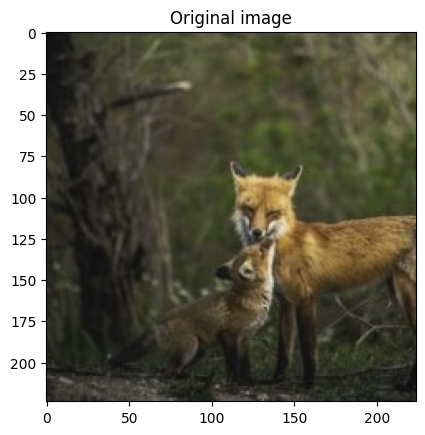

Queries: ['foxes', 'a forest', 'a couple']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is foxes
Query dependency is: pobj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (4.270148299999988 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  3%|██▊                                                                                | 1/30 [00:00<00:06,  4.60it/s]

0.26992735 / 1



  7%|█████▌                                                                             | 2/30 [00:00<00:07,  3.72it/s]

0.28493282 / 1



 10%|████████▎                                                                          | 3/30 [00:00<00:08,  3.13it/s]

0.2591139 / 1



 13%|███████████                                                                        | 4/30 [00:01<00:09,  2.62it/s]

0.28498107 / 1



 17%|█████████████▊                                                                     | 5/30 [00:01<00:10,  2.42it/s]

0.25951782 / 1



 20%|████████████████▌                                                                  | 6/30 [00:02<00:10,  2.23it/s]

0.3001385 / 1



 23%|███████████████████▎                                                               | 7/30 [00:02<00:11,  2.08it/s]

0.26965725 / 1



 27%|██████████████████████▏                                                            | 8/30 [00:03<00:10,  2.05it/s]

0.2945717 / 1



 30%|████████████████████████▉                                                          | 9/30 [00:03<00:10,  2.03it/s]

0.27528465 / 1



 33%|███████████████████████████▎                                                      | 10/30 [00:04<00:10,  1.97it/s]

0.29616588 / 1



 37%|██████████████████████████████                                                    | 11/30 [00:05<00:09,  1.94it/s]

0.28452018 / 1



 40%|████████████████████████████████▊                                                 | 12/30 [00:05<00:09,  1.93it/s]

0.25624606 / 1



 43%|███████████████████████████████████▌                                              | 13/30 [00:05<00:08,  1.97it/s]

0.2923907 / 1



 47%|██████████████████████████████████████▎                                           | 14/30 [00:06<00:07,  2.04it/s]

0.26257455 / 1



 50%|█████████████████████████████████████████                                         | 15/30 [00:07<00:07,  1.97it/s]

0.2596974 / 1



 53%|███████████████████████████████████████████▋                                      | 16/30 [00:07<00:07,  1.94it/s]

0.3013916 / 1



 57%|██████████████████████████████████████████████▍                                   | 17/30 [00:08<00:06,  1.96it/s]

0.2944044 / 1



 60%|█████████████████████████████████████████████████▏                                | 18/30 [00:08<00:06,  1.99it/s]

0.26881444 / 1



 63%|███████████████████████████████████████████████████▉                              | 19/30 [00:08<00:05,  2.09it/s]

0.29586583 / 1



 67%|██████████████████████████████████████████████████████▋                           | 20/30 [00:09<00:04,  2.01it/s]

0.27506116 / 1



 70%|█████████████████████████████████████████████████████████▍                        | 21/30 [00:09<00:04,  1.99it/s]

0.2708889 / 1



 73%|████████████████████████████████████████████████████████████▏                     | 22/30 [00:10<00:04,  1.77it/s]

0.2909521 / 1



 77%|██████████████████████████████████████████████████████████████▊                   | 23/30 [00:11<00:04,  1.51it/s]

0.26639304 / 1



 80%|█████████████████████████████████████████████████████████████████▌                | 24/30 [00:12<00:04,  1.46it/s]

0.25482702 / 1



 83%|████████████████████████████████████████████████████████████████████▎             | 25/30 [00:13<00:03,  1.42it/s]

0.27149165 / 1



 87%|███████████████████████████████████████████████████████████████████████           | 26/30 [00:13<00:03,  1.32it/s]

0.29565257 / 1



 90%|█████████████████████████████████████████████████████████████████████████▊        | 27/30 [00:14<00:02,  1.29it/s]

0.26805392 / 1



 93%|████████████████████████████████████████████████████████████████████████████▌     | 28/30 [00:15<00:01,  1.36it/s]

0.27009982 / 1



 97%|███████████████████████████████████████████████████████████████████████████████▎  | 29/30 [00:16<00:00,  1.41it/s]

0.27012485 / 1



100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:16<00:00,  1.77it/s]


0.2691629 / 1

measuring similarity score for 30 segments is done in 16.913666500000005 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.3013916015625
Stage 1 is done in less than 1 min (16.92046289999999 sec)!



3it [00:00, 357.15it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:10<00:21, 10.74s/it]

0.66012883 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:19<00:09,  9.48s/it]

0.20438802 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:27<00:00,  9.32s/it]

0.66012883 / 1

measuring similarity score for 3 segments is done in 27.9797332 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.6601288318634033
Stage 2 is done in less than 1 min (28.0401746 sec)!
Caption: a couple of foxes standing in a forest
Query: foxes
Answer similarity score: 0.6601288318634033


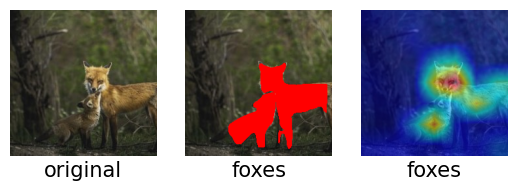

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a forest
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.002811300000018946 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  3%|██▊                                                                                | 1/30 [00:00<00:15,  1.88it/s]

0.22208396 / 1



  7%|█████▌                                                                             | 2/30 [00:01<00:16,  1.74it/s]

0.22746228 / 1



 10%|████████▎                                                                          | 3/30 [00:01<00:15,  1.79it/s]

0.22033821 / 1



 13%|███████████                                                                        | 4/30 [00:02<00:14,  1.78it/s]

0.2269291 / 1



 17%|█████████████▊                                                                     | 5/30 [00:02<00:13,  1.83it/s]

0.23009077 / 1



 20%|████████████████▌                                                                  | 6/30 [00:03<00:13,  1.79it/s]

0.22129649 / 1



 23%|███████████████████▎                                                               | 7/30 [00:03<00:12,  1.82it/s]

0.22190693 / 1



 27%|██████████████████████▏                                                            | 8/30 [00:04<00:12,  1.77it/s]

0.21736139 / 1



 30%|████████████████████████▉                                                          | 9/30 [00:05<00:11,  1.75it/s]

0.22565648 / 1



 33%|███████████████████████████▎                                                      | 10/30 [00:05<00:11,  1.76it/s]

0.22069174 / 1



 37%|██████████████████████████████                                                    | 11/30 [00:06<00:10,  1.77it/s]

0.22691382 / 1



 40%|████████████████████████████████▊                                                 | 12/30 [00:06<00:09,  1.81it/s]

0.22348824 / 1



 43%|███████████████████████████████████▌                                              | 13/30 [00:07<00:09,  1.79it/s]

0.21782987 / 1



 47%|██████████████████████████████████████▎                                           | 14/30 [00:07<00:08,  1.80it/s]

0.22016394 / 1



 50%|█████████████████████████████████████████                                         | 15/30 [00:08<00:08,  1.72it/s]

0.22272661 / 1



 53%|███████████████████████████████████████████▋                                      | 16/30 [00:09<00:08,  1.74it/s]

0.22184202 / 1



 57%|██████████████████████████████████████████████▍                                   | 17/30 [00:09<00:07,  1.71it/s]

0.21950325 / 1



 60%|█████████████████████████████████████████████████▏                                | 18/30 [00:10<00:06,  1.74it/s]

0.21114461 / 1



 63%|███████████████████████████████████████████████████▉                              | 19/30 [00:10<00:06,  1.83it/s]

0.21790755 / 1



 67%|██████████████████████████████████████████████████████▋                           | 20/30 [00:12<00:07,  1.27it/s]

0.225169 / 1



 70%|█████████████████████████████████████████████████████████▍                        | 21/30 [00:13<00:08,  1.06it/s]

0.21097375 / 1



 73%|████████████████████████████████████████████████████████████▏                     | 22/30 [00:14<00:08,  1.06s/it]

0.21850121 / 1



 77%|██████████████████████████████████████████████████████████████▊                   | 23/30 [00:15<00:07,  1.04s/it]

0.21150018 / 1



 80%|█████████████████████████████████████████████████████████████████▌                | 24/30 [00:16<00:06,  1.02s/it]

0.21895471 / 1



 83%|████████████████████████████████████████████████████████████████████▎             | 25/30 [00:17<00:05,  1.00s/it]

0.21210104 / 1



 87%|███████████████████████████████████████████████████████████████████████           | 26/30 [00:18<00:03,  1.04it/s]

0.21996601 / 1



 90%|█████████████████████████████████████████████████████████████████████████▊        | 27/30 [00:19<00:02,  1.06it/s]

0.21064706 / 1



 93%|████████████████████████████████████████████████████████████████████████████▌     | 28/30 [00:20<00:01,  1.07it/s]

0.20927502 / 1



 97%|███████████████████████████████████████████████████████████████████████████████▎  | 29/30 [00:21<00:00,  1.10it/s]

0.21046825 / 1



100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:21<00:00,  1.37it/s]


0.21005979 / 1

measuring similarity score for 30 segments is done in 22.004381500000022 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.23009076714515686
Stage 1 is done in less than 1 min (22.017680599999977 sec)!



3it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:09<00:19,  9.72s/it]

0.37994763 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:17<00:08,  8.69s/it]

0.42755824 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:25<00:00,  8.65s/it]

0.55136156 / 1

measuring similarity score for 3 segments is done in 25.964728899999955 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.5513615608215332
Stage 2 is done in less than 1 min (26.011140300000022 sec)!
Caption: a couple of foxes standing in a forest
Query: a forest
Answer similarity score: 0.5513615608215332


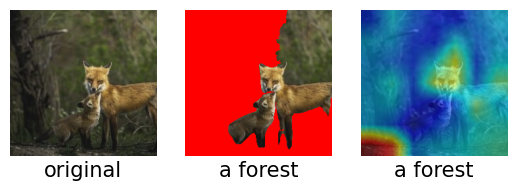

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a couple
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0026028999999994085 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  3%|██▊                                                                                | 1/30 [00:00<00:15,  1.83it/s]

0.21049136 / 0.06335698341836735



  7%|█████▌                                                                             | 2/30 [00:01<00:15,  1.84it/s]

0.19378258 / 0.10732222576530612



 10%|████████▎                                                                          | 3/30 [00:01<00:14,  1.80it/s]

0.2090838 / 0.057896205357142856



 13%|███████████                                                                        | 4/30 [00:02<00:14,  1.79it/s]

0.1941354 / 0.11128826530612244



 17%|█████████████▊                                                                     | 5/30 [00:02<00:13,  1.84it/s]

0.21534818 / 0.8220065369897959



 20%|████████████████▌                                                                  | 6/30 [00:03<00:13,  1.81it/s]

0.23559356 / 0.17067920918367346



 23%|███████████████████▎                                                               | 7/30 [00:03<00:12,  1.85it/s]

0.21023008 / 0.06377551020408163



 27%|██████████████████████▏                                                            | 8/30 [00:04<00:12,  1.77it/s]

0.23346244 / 0.17462531887755103



 30%|████████████████████████▉                                                          | 9/30 [00:04<00:11,  1.79it/s]

0.23209968 / 0.8853635204081632



 33%|███████████████████████████▎                                                      | 10/30 [00:05<00:11,  1.76it/s]

0.22817191 / 0.16521843112244897



 37%|██████████████████████████████                                                    | 11/30 [00:06<00:10,  1.75it/s]

0.19439727 / 0.11423788265306123



 40%|████████████████████████████████▊                                                 | 12/30 [00:06<00:10,  1.77it/s]

0.19284675 / 0.929328762755102



 43%|███████████████████████████████████▌                                              | 13/30 [00:07<00:09,  1.86it/s]

0.22867389 / 0.1691844706632653



 47%|██████████████████████████████████████▎                                           | 14/30 [00:07<00:08,  1.92it/s]

0.22577594 / 0.8799027423469388



 50%|█████████████████████████████████████████                                         | 15/30 [00:08<00:08,  1.83it/s]

0.19288479 / 0.9332948022959183



 53%|███████████████████████████████████████████▋                                      | 16/30 [00:08<00:07,  1.78it/s]

0.23626071 / 0.17109773596938777



 57%|██████████████████████████████████████████████▍                                   | 17/30 [00:09<00:07,  1.76it/s]

0.23267841 / 0.1775749362244898



 60%|█████████████████████████████████████████████████▏                                | 18/30 [00:10<00:07,  1.53it/s]

0.22947234 / 0.9926857461734694



 63%|███████████████████████████████████████████████████▉                              | 19/30 [00:11<00:07,  1.44it/s]

0.23411348 / 0.1750438456632653



 67%|██████████████████████████████████████████████████████▋                           | 20/30 [00:11<00:07,  1.37it/s]

0.23255883 / 0.8857820471938775



 70%|█████████████████████████████████████████████████████████▍                        | 21/30 [00:12<00:06,  1.30it/s]

0.22669171 / 0.9966318558673469



 73%|████████████████████████████████████████████████████████████▏                     | 22/30 [00:13<00:06,  1.25it/s]

0.22800478 / 0.17213408801020408



 77%|██████████████████████████████████████████████████████████████▊                   | 23/30 [00:14<00:05,  1.24it/s]

0.22841622 / 0.9872249681122449



 80%|█████████████████████████████████████████████████████████████████▌                | 24/30 [00:15<00:04,  1.20it/s]

0.19213346 / 0.9362444196428571



 83%|████████████████████████████████████████████████████████████████████▎             | 25/30 [00:16<00:04,  1.21it/s]

0.22728997 / 0.9911910076530612



 87%|███████████████████████████████████████████████████████████████████████           | 26/30 [00:16<00:03,  1.23it/s]

0.23331368 / 0.17799346301020408



 90%|█████████████████████████████████████████████████████████████████████████▊        | 27/30 [00:17<00:02,  1.25it/s]

0.22862403 / 0.9931042729591837



 93%|████████████████████████████████████████████████████████████████████████████▌     | 28/30 [00:18<00:01,  1.26it/s]

0.2278692 / 0.9995814732142857



 97%|███████████████████████████████████████████████████████████████████████████████▎  | 29/30 [00:19<00:00,  1.23it/s]

0.22588018 / 0.9970503826530612



100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:20<00:00,  1.49it/s]


0.22785841 / 0.994140625

measuring similarity score for 30 segments is done in 20.212518199999977 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (20.221109799999965 sec)!



3it [00:00, 499.36it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:10<00:20, 10.09s/it]

0.27645108 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:17<00:08,  8.25s/it]

0.41780847 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:25<00:00,  8.46s/it]

0.27645108 / 1

measuring similarity score for 3 segments is done in 25.409270899999967 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.417808473110199
Stage 2 is done in less than 1 min (25.457467199999996 sec)!
Caption: a couple of foxes standing in a forest
Query: a couple
Answer similarity score: 1


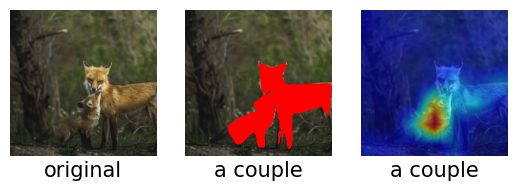

  7%|█████▉                                                                          | 2/27 [05:07<1:07:37, 162.29s/it]

Testing image 2
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a man riding a bike through a field



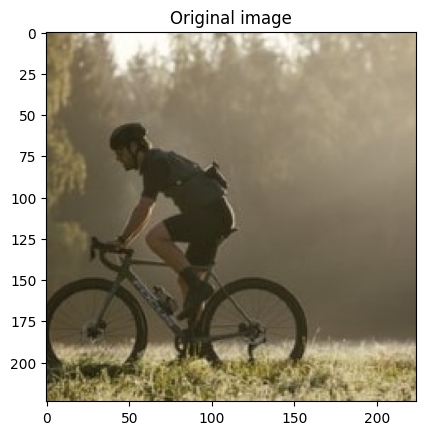

Queries: ['a field', 'a bike', 'a man']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a field
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (4.671714000000009 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  7%|█████▉                                                                             | 1/14 [00:00<00:03,  3.79it/s]

0.22182322 / 1



 14%|███████████▊                                                                       | 2/14 [00:00<00:04,  2.99it/s]

0.23229747 / 1



 21%|█████████████████▊                                                                 | 3/14 [00:01<00:04,  2.46it/s]

0.22702982 / 1



 29%|███████████████████████▋                                                           | 4/14 [00:01<00:04,  2.11it/s]

0.24145555 / 1



 36%|█████████████████████████████▋                                                     | 5/14 [00:02<00:04,  1.83it/s]

0.20473659 / 1



 43%|███████████████████████████████████▌                                               | 6/14 [00:02<00:04,  1.77it/s]

0.22105631 / 1



 50%|█████████████████████████████████████████▌                                         | 7/14 [00:03<00:04,  1.70it/s]

0.24266076 / 1



 57%|███████████████████████████████████████████████▍                                   | 8/14 [00:04<00:03,  1.66it/s]

0.22495945 / 1



 64%|█████████████████████████████████████████████████████▎                             | 9/14 [00:04<00:03,  1.63it/s]

0.22345431 / 1



 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [00:05<00:02,  1.59it/s]

0.23473455 / 1



 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [00:06<00:01,  1.56it/s]

0.20682201 / 1



 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [00:06<00:01,  1.63it/s]

0.2222349 / 1



 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [00:07<00:00,  1.64it/s]

0.24221078 / 1



100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:08<00:00,  1.73it/s]


0.22304896 / 1

measuring similarity score for 14 segments is done in 8.078761800000052 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.2426607608795166
Stage 1 is done in less than 1 min (8.104817799999978 sec)!



3it [00:00, 272.95it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:10<00:21, 10.56s/it]

0.53751135 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:17<00:08,  8.38s/it]

0.8542522 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:23<00:00,  7.84s/it]

0.49899542 / 1

measuring similarity score for 3 segments is done in 23.54551429999998 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.8542522192001343
Stage 2 is done in less than 1 min (23.61979630000002 sec)!
Caption: a man riding a bike through a field
Query: a field
Answer similarity score: 0.8542522192001343


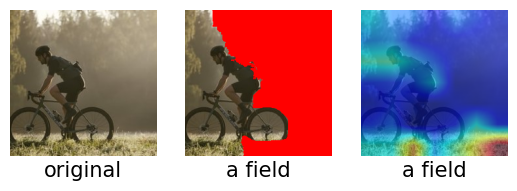

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a bike
Query dependency is: det dobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0035961000000384047 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  7%|█████▉                                                                             | 1/14 [00:00<00:10,  1.29it/s]

0.23085979 / 0.08458227040816327



 14%|███████████▊                                                                       | 2/14 [00:01<00:10,  1.16it/s]

0.30923194 / 0.1468231823979592



 21%|█████████████████▊                                                                 | 3/14 [00:02<00:09,  1.18it/s]

0.20759913 / 0.017916932397959183



 29%|███████████████████████▋                                                           | 4/14 [00:03<00:08,  1.17it/s]

0.23233204 / 0.7713647959183674



 36%|█████████████████████████████▋                                                     | 5/14 [00:04<00:07,  1.21it/s]

0.2941119 / 0.22781808035714285



 43%|███████████████████████████████████▌                                               | 6/14 [00:05<00:06,  1.21it/s]

0.23108137 / 0.08539939413265306



 50%|█████████████████████████████████████████▌                                         | 7/14 [00:05<00:05,  1.25it/s]

0.23925701 / 0.8559470663265306



 57%|███████████████████████████████████████████████▍                                   | 8/14 [00:06<00:04,  1.28it/s]

0.30819517 / 0.16474011479591838



 64%|█████████████████████████████████████████████████████▎                             | 9/14 [00:07<00:04,  1.23it/s]

0.292145 / 0.9181879783163265



 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [00:08<00:03,  1.24it/s]

0.22267966 / 0.7892817283163265



 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [00:08<00:02,  1.42it/s]

0.29472268 / 0.22863520408163265



 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [00:09<00:01,  1.57it/s]

0.277891 / 0.9991828762755102



 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [00:09<00:00,  1.58it/s]

0.23796849 / 0.8567641900510204



100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:10<00:00,  1.35it/s]


0.29392764 / 0.9361049107142857

measuring similarity score for 14 segments is done in 10.39069440000003 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (10.410886699999992 sec)!



3it [00:00, 219.60it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:10<00:20, 10.15s/it]

0.65861917 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:18<00:09,  9.09s/it]

0.35541335 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:26<00:00,  8.89s/it]

0.74637073 / 1

measuring similarity score for 3 segments is done in 26.68618710000004 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.7463707327842712
Stage 2 is done in less than 1 min (26.752054499999986 sec)!
Caption: a man riding a bike through a field
Query: a bike
Answer similarity score: 1


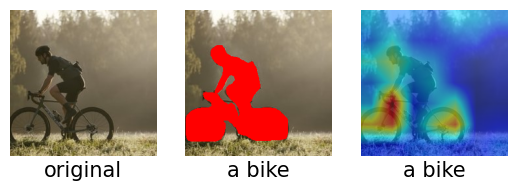

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a man
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0028062999999747262 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  7%|█████▉                                                                             | 1/14 [00:00<00:07,  1.80it/s]

0.23023707 / 0.08458227040816327



 14%|███████████▊                                                                       | 2/14 [00:01<00:06,  1.83it/s]

0.20530248 / 0.1468231823979592



 21%|█████████████████▊                                                                 | 3/14 [00:01<00:06,  1.80it/s]

0.21387477 / 0.017916932397959183



 29%|███████████████████████▋                                                           | 4/14 [00:02<00:05,  1.84it/s]

0.22157119 / 0.7713647959183674



 36%|█████████████████████████████▋                                                     | 5/14 [00:02<00:05,  1.73it/s]

0.22097692 / 0.22781808035714285



 43%|███████████████████████████████████▌                                               | 6/14 [00:03<00:05,  1.44it/s]

0.22995265 / 0.08539939413265306



 50%|█████████████████████████████████████████▌                                         | 7/14 [00:04<00:05,  1.32it/s]

0.231648 / 0.8559470663265306



 57%|███████████████████████████████████████████████▍                                   | 8/14 [00:05<00:04,  1.26it/s]

0.21291055 / 0.16474011479591838



 64%|█████████████████████████████████████████████████████▎                             | 9/14 [00:06<00:03,  1.28it/s]

0.21094131 / 0.9181879783163265



 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [00:06<00:03,  1.30it/s]

0.21568085 / 0.7892817283163265



 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [00:07<00:02,  1.35it/s]

0.2225728 / 0.22863520408163265



 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [00:08<00:01,  1.33it/s]

0.21615154 / 0.9991828762755102



 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [00:09<00:00,  1.29it/s]

0.23235366 / 0.8567641900510204



100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:10<00:00,  1.39it/s]


0.21531123 / 0.9361049107142857

measuring similarity score for 14 segments is done in 10.116327899999987 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (10.127972199999988 sec)!



3it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:11<00:23, 11.85s/it]

0.28836834 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:19<00:09,  9.39s/it]

0.21935199 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:30<00:00, 10.22s/it]

0.4280597 / 1

measuring similarity score for 3 segments is done in 30.68778199999997 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.4280596971511841
Stage 2 is done in less than 1 min (30.732686299999955 sec)!
Caption: a man riding a bike through a field
Query: a man
Answer similarity score: 1


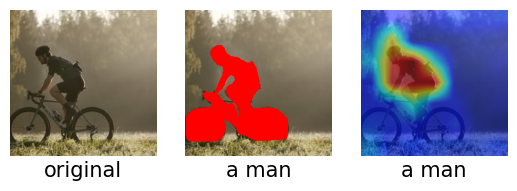

 11%|████████▉                                                                       | 3/27 [08:12<1:08:59, 172.47s/it]

Testing image 3
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a man standing in a field



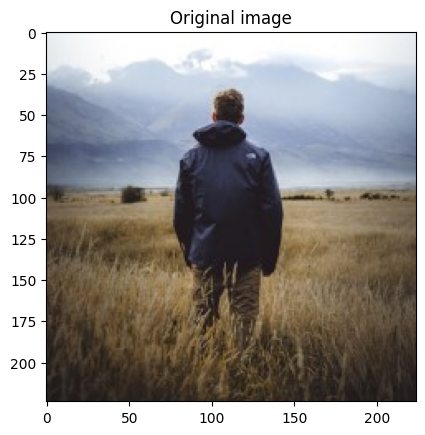

Queries: ['a field', 'a man']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a field
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (6.018054799999959 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 17%|██████████████                                                                      | 1/6 [00:00<00:01,  3.90it/s]

0.2150374 / 1



 33%|████████████████████████████                                                        | 2/6 [00:00<00:01,  3.33it/s]

0.2394114 / 1



 50%|██████████████████████████████████████████                                          | 3/6 [00:01<00:01,  2.69it/s]

0.25406614 / 1



 67%|████████████████████████████████████████████████████████                            | 4/6 [00:01<00:00,  2.24it/s]

0.21362858 / 1



 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:02<00:00,  2.04it/s]

0.2454336 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.03it/s]


0.25707856 / 1

measuring similarity score for 6 segments is done in 2.9582550000000083 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.2570785582065582
Stage 1 is done in less than 1 min (2.9832159000000047 sec)!



5it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 20%|████████████████▊                                                                   | 1/5 [00:10<00:42, 10.70s/it]

0.7493156 / 1



 40%|█████████████████████████████████▌                                                  | 2/5 [00:18<00:26,  8.88s/it]

0.4483506 / 1



 60%|██████████████████████████████████████████████████▍                                 | 3/5 [00:30<00:20, 10.25s/it]

0.19254741 / 1



 80%|███████████████████████████████████████████████████████████████████▏                | 4/5 [00:47<00:12, 12.92s/it]

0.80109596 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:56<00:00, 11.32s/it]

0.80109596 / 1

measuring similarity score for 5 segments is done in 56.59862069999997 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.8010959625244141
Stage 2 is done in less than 1 min (56.68305869999995 sec)!
Caption: a man standing in a field
Query: a field
Answer similarity score: 0.8010959625244141


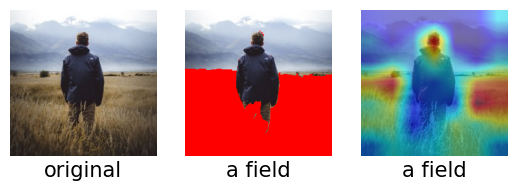

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a man
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0033760999999685737 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 17%|██████████████                                                                      | 1/6 [00:00<00:04,  1.22it/s]

0.21828045 / 0.13087930484693877



 33%|████████████████████████████                                                        | 2/6 [00:01<00:03,  1.18it/s]

0.2125933 / 0.020348373724489797



 50%|██████████████████████████████████████████                                          | 3/6 [00:02<00:02,  1.19it/s]

0.23726611 / 0.8654934630102041



 67%|████████████████████████████████████████████████████████                            | 4/6 [00:03<00:01,  1.26it/s]

0.22023618 / 0.13450653698979592



 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:03<00:00,  1.29it/s]

0.2256765 / 0.9963727678571429



100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:04<00:00,  1.23it/s]


0.23418234 / 0.8858418367346939

measuring similarity score for 6 segments is done in 4.9222566000000825 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (4.937418600000001 sec)!



4it [00:00, 605.17it/s]


stage 2 calculate_similarity_scores starts



 25%|█████████████████████                                                               | 1/4 [00:12<00:38, 12.67s/it]

0.37783158 / 1



 50%|██████████████████████████████████████████                                          | 2/4 [00:20<00:19,  9.66s/it]

0.32093626 / 1



 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:29<00:09,  9.41s/it]

0.32093626 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:42<00:00, 10.61s/it]

0.3982317 / 1

measuring similarity score for 4 segments is done in 42.46209929999998 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.3982316851615906
Stage 2 is done in less than 1 min (42.555184499999996 sec)!
Caption: a man standing in a field
Query: a man
Answer similarity score: 1


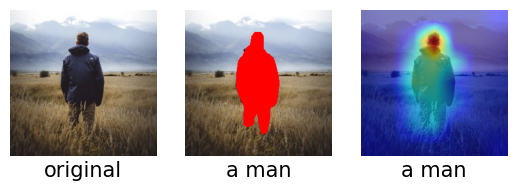

 15%|███████████▊                                                                    | 4/27 [11:34<1:10:42, 184.46s/it]

Testing image 4
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a jeep parked on a rocky road



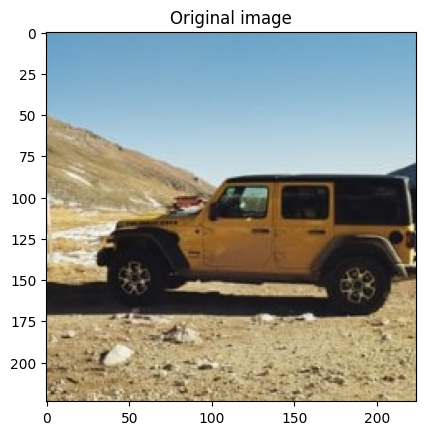

Queries: ['a jeep', 'a rocky road']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a jeep
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (4.3787675999999465 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  3.97it/s]

0.29596102 / 0.23005022321428573



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  3.34it/s]


0.24954689 / 0.7699497767857143

measuring similarity score for 2 segments is done in 0.6230680999999549 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (0.6341555000000199 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:07<00:07,  7.94s/it]

0.7307286 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:14<00:00,  7.09s/it]

0.7307286 / 1

measuring similarity score for 2 segments is done in 14.187698899999987 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.7307286262512207
Stage 2 is done in less than 1 min (14.225764800000093 sec)!
Caption: a jeep parked on a rocky road
Query: a jeep
Answer similarity score: 1


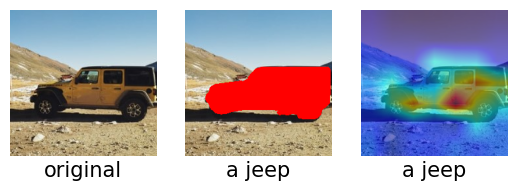

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a rocky road
Query dependency is: det amod pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0020660999999790874 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  2.02it/s]

0.22706674 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  2.01it/s]


0.24071781 / 1

measuring similarity score for 2 segments is done in 1.0183711999999332 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.240717813372612
Stage 1 is done in less than 1 min (1.044016499999998 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:09<00:09,  9.18s/it]

0.6142858 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:17<00:00,  8.66s/it]

0.6142858 / 1

measuring similarity score for 2 segments is done in 17.31625919999999 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.6142858266830444
Stage 2 is done in less than 1 min (17.3627537000001 sec)!
Caption: a jeep parked on a rocky road
Query: a rocky road
Answer similarity score: 0.6142858266830444


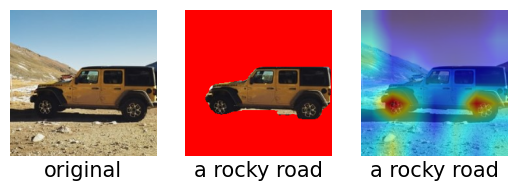

 19%|███████████████▏                                                                  | 5/27 [13:02<54:46, 149.37s/it]

Testing image 5
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a person sping blueberries onto a cake



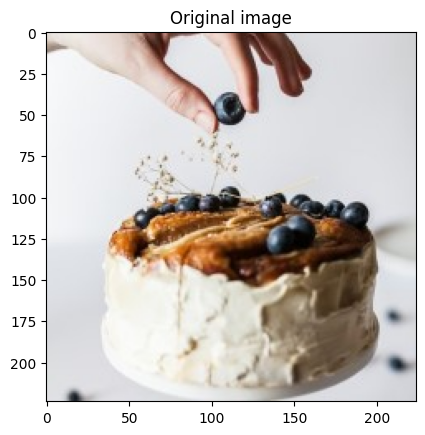

Queries: ['a cake', 'blueberries', 'a person']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a cake
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (4.533801899999958 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  7%|█████▉                                                                             | 1/14 [00:00<00:02,  4.66it/s]

0.3001795 / 1



 14%|███████████▊                                                                       | 2/14 [00:00<00:03,  3.34it/s]

0.21950512 / 1



 21%|█████████████████▊                                                                 | 3/14 [00:00<00:03,  2.81it/s]

0.2227756 / 1



 29%|███████████████████████▋                                                           | 4/14 [00:01<00:03,  2.53it/s]

0.26341146 / 1



 36%|█████████████████████████████▋                                                     | 5/14 [00:02<00:04,  2.20it/s]

0.2999945 / 1



 43%|███████████████████████████████████▌                                               | 6/14 [00:02<00:03,  2.01it/s]

0.30007848 / 1



 50%|█████████████████████████████████████████▌                                         | 7/14 [00:03<00:03,  1.89it/s]

0.29405624 / 1



 57%|███████████████████████████████████████████████▍                                   | 8/14 [00:03<00:03,  1.82it/s]

0.21925852 / 1



 64%|█████████████████████████████████████████████████████▎                             | 9/14 [00:04<00:02,  1.82it/s]

0.25957808 / 1



 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [00:04<00:02,  1.82it/s]

0.25321686 / 1



 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [00:05<00:01,  1.81it/s]

0.29984462 / 1



 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [00:06<00:01,  1.80it/s]

0.29282254 / 1



 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [00:06<00:00,  1.66it/s]

0.28913695 / 1



100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:07<00:00,  1.92it/s]


0.27999946 / 1

measuring similarity score for 14 segments is done in 7.3265808999999535 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.30017951130867004
Stage 1 is done in less than 1 min (7.345681899999931 sec)!



4it [00:00, 256.08it/s]


stage 2 calculate_similarity_scores starts



 25%|█████████████████████                                                               | 1/4 [00:10<00:31, 10.64s/it]

0.6856011 / 1



 50%|██████████████████████████████████████████                                          | 2/4 [00:19<00:18,  9.30s/it]

0.24236149 / 1



 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:28<00:09,  9.19s/it]

0.6117668 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:37<00:00,  9.32s/it]

0.8806 / 1

measuring similarity score for 4 segments is done in 37.28718930000002 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.8805999755859375
Stage 2 is done in less than 1 min (37.36129519999997 sec)!
Caption: a person sping blueberries onto a cake
Query: a cake
Answer similarity score: 0.8805999755859375


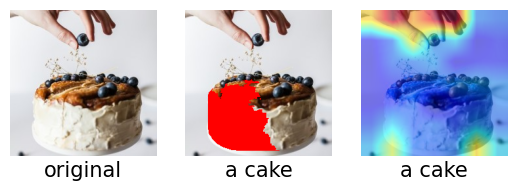

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is blueberries
Query dependency is: dobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0033018000000311076 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  7%|█████▉                                                                             | 1/14 [00:00<00:06,  1.89it/s]

0.25555432 / 0.348453443877551



 14%|███████████▊                                                                       | 2/14 [00:01<00:06,  1.81it/s]

0.23126228 / 0.017378826530612245



 21%|█████████████████▊                                                                 | 3/14 [00:01<00:06,  1.62it/s]

0.23826188 / 0.08169244260204081



 29%|███████████████████████▋                                                           | 4/14 [00:02<00:06,  1.50it/s]

0.24373733 / 0.5684988839285714



 36%|█████████████████████████████▋                                                     | 5/14 [00:03<00:06,  1.46it/s]

0.25639415 / 0.34867267219387754



 43%|███████████████████████████████████▌                                               | 6/14 [00:03<00:05,  1.46it/s]

0.25351763 / 0.43014588647959184



 50%|█████████████████████████████████████████▌                                         | 7/14 [00:04<00:04,  1.43it/s]

0.23765147 / 0.9169523278061225



 57%|███████████████████████████████████████████████▍                                   | 8/14 [00:05<00:04,  1.43it/s]

0.2336957 / 0.09907126913265306



 64%|█████████████████████████████████████████████████████▎                             | 9/14 [00:05<00:03,  1.51it/s]

0.2355009 / 0.5858777104591837



 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [00:06<00:02,  1.48it/s]

0.22932096 / 0.6501913265306123



 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [00:07<00:01,  1.52it/s]

0.25369623 / 0.4303651147959184



 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [00:07<00:01,  1.54it/s]

0.24014531 / 0.9171715561224489



 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [00:08<00:00,  1.62it/s]

0.23461401 / 0.9986447704081632



100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:09<00:00,  1.53it/s]


0.23414314 / 0.6675701530612245

measuring similarity score for 14 segments is done in 9.172424700000079 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (9.189342199999942 sec)!



4it [00:00, 572.11it/s]


stage 2 calculate_similarity_scores starts



 25%|█████████████████████                                                               | 1/4 [00:09<00:27,  9.10s/it]

0.3260488 / 1



 50%|██████████████████████████████████████████                                          | 2/4 [00:16<00:16,  8.32s/it]

0.19051135 / 1



 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:24<00:07,  7.88s/it]

0.16019425 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:37<00:00,  9.36s/it]

0.18333676 / 1

measuring similarity score for 4 segments is done in 37.46302760000003 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.3260487914085388
Stage 2 is done in less than 1 min (37.55987309999989 sec)!
Caption: a person sping blueberries onto a cake
Query: blueberries
Answer similarity score: 1


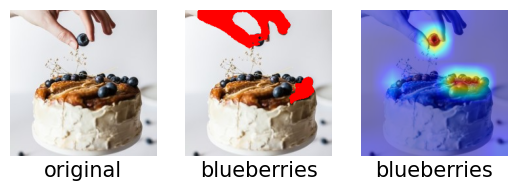

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a person
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0045939999999973224 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  7%|█████▉                                                                             | 1/14 [00:01<00:15,  1.18s/it]

0.20223507 / 0.348453443877551



 14%|███████████▊                                                                       | 2/14 [00:02<00:14,  1.19s/it]

0.23486598 / 0.017378826530612245



 21%|█████████████████▊                                                                 | 3/14 [00:03<00:14,  1.35s/it]

0.24144572 / 0.08169244260204081



 29%|███████████████████████▋                                                           | 4/14 [00:05<00:12,  1.30s/it]

0.23140883 / 0.5684988839285714



 36%|█████████████████████████████▋                                                     | 5/14 [00:06<00:10,  1.15s/it]

0.20229222 / 0.34867267219387754



 43%|███████████████████████████████████▌                                               | 6/14 [00:06<00:08,  1.07s/it]

0.21143426 / 0.43014588647959184



 50%|█████████████████████████████████████████▌                                         | 7/14 [00:07<00:07,  1.03s/it]

0.2128081 / 0.9169523278061225



 57%|███████████████████████████████████████████████▍                                   | 8/14 [00:08<00:05,  1.07it/s]

0.23611672 / 0.09907126913265306



 64%|█████████████████████████████████████████████████████▎                             | 9/14 [00:09<00:04,  1.17it/s]

0.22103909 / 0.5858777104591837



 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [00:09<00:03,  1.26it/s]

0.20899263 / 0.6501913265306123



 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [00:10<00:02,  1.38it/s]

0.21101907 / 0.4303651147959184



 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [00:11<00:01,  1.47it/s]

0.2129572 / 0.9171715561224489



 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [00:11<00:00,  1.57it/s]

0.20463392 / 0.9986447704081632



100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:13<00:00,  1.04it/s]


0.21698518 / 0.6675701530612245

measuring similarity score for 14 segments is done in 13.501885700000003 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (13.523181300000033 sec)!



4it [00:00, 226.36it/s]


stage 2 calculate_similarity_scores starts



 25%|█████████████████████                                                               | 1/4 [00:17<00:51, 17.12s/it]

0.50459343 / 1



 50%|██████████████████████████████████████████                                          | 2/4 [00:28<00:27, 13.86s/it]

0.7342252 / 1



 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:35<00:10, 10.84s/it]

0.522192 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:46<00:00, 11.65s/it]

0.41969258 / 1

measuring similarity score for 4 segments is done in 46.65992830000005 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.7342252135276794
Stage 2 is done in less than 1 min (46.77359359999991 sec)!
Caption: a person sping blueberries onto a cake
Query: a person
Answer similarity score: 1


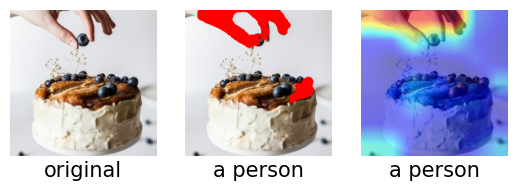

 22%|█████████████████▊                                                              | 6/27 [17:10<1:04:02, 182.98s/it]

Testing image 6
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a bird sitting on a moss covered ground



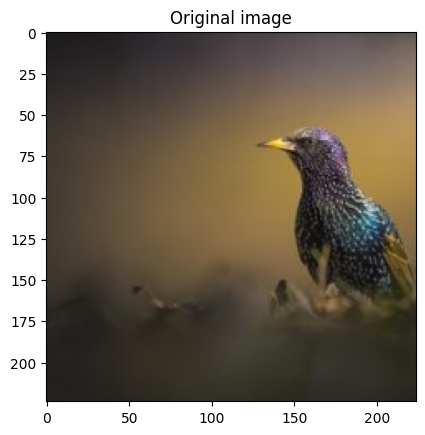

Queries: ['a bird', 'a moss', 'ground']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a bird
Query dependency is: det nsubj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (4.747156099999984 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  2.95it/s]

0.29002252 / 0.10214046556122448



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  2.00it/s]


0.27382892 / 0.8934151785714286

measuring similarity score for 2 segments is done in 1.0126330000000507 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (1.025781699999925 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:11<00:11, 11.53s/it]

0.6274198 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:21<00:00, 10.81s/it]

0.6274198 / 1

measuring similarity score for 2 segments is done in 21.627414399999907 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.6274198293685913
Stage 2 is done in less than 1 min (21.67437730000006 sec)!
Caption: a bird sitting on a moss covered ground
Query: a bird
Answer similarity score: 1


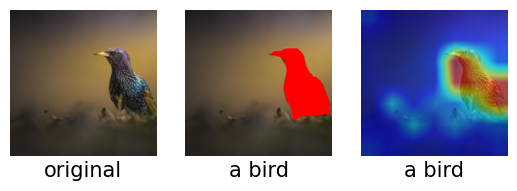

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a moss
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.004564000000073065 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  1.14it/s]

0.21401158 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.13it/s]


0.2326433 / 1

measuring similarity score for 2 segments is done in 1.8022702000000663 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.23264330625534058
Stage 1 is done in less than 1 min (1.836111700000174 sec)!



2it [00:00, 198.95it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:15<00:15, 15.06s/it]

0.5186691 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:23<00:00, 11.89s/it]

0.5186691 / 1

measuring similarity score for 2 segments is done in 23.82247080000002 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.5186691284179688
Stage 2 is done in less than 1 min (23.90508190000014 sec)!
Caption: a bird sitting on a moss covered ground
Query: a moss
Answer similarity score: 0.5186691284179688


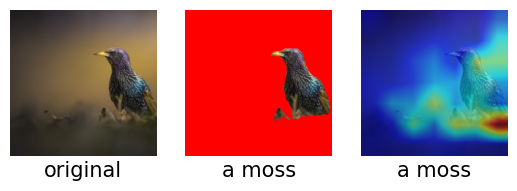

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is ground
Query dependency is: dobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0020670999999765627 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  1.80it/s]

0.20346351 / 0.10214046556122448



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.73it/s]


0.23923779 / 0.8934151785714286

measuring similarity score for 2 segments is done in 1.1618168999998488 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (1.1776138000000174 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:10<00:10, 10.84s/it]

0.3772753 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:19<00:00,  9.93s/it]

0.3772753 / 1

measuring similarity score for 2 segments is done in 19.85645219999992 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.377275288105011
Stage 2 is done in less than 1 min (19.906471799999963 sec)!
Caption: a bird sitting on a moss covered ground
Query: ground
Answer similarity score: 1


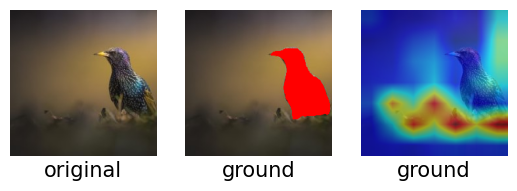

 26%|█████████████████████▎                                                            | 7/27 [19:42<57:40, 173.02s/it]

Testing image 8
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a small bird perched on a branch



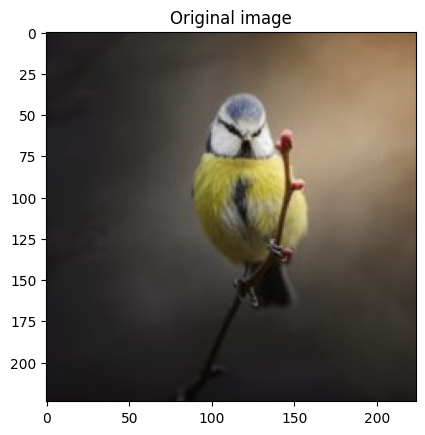

Queries: ['a small bird', 'a branch']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a small bird
Query dependency is: det amod nsubj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (4.765902500000038 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  4.55it/s]

0.28996214 / 0.11908083545918367



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  3.64it/s]


0.25583777 / 0.8809191645408163

measuring similarity score for 2 segments is done in 0.5729099000000133 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (0.5814766999999392 sec)!



3it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:11<00:22, 11.46s/it]

0.82621014 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:22<00:11, 11.49s/it]

0.39032382 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:30<00:00, 10.30s/it]

0.61493576 / 1

measuring similarity score for 3 segments is done in 30.899424899999985 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.8262101411819458
Stage 2 is done in less than 1 min (30.935031499999923 sec)!
Caption: a small bird perched on a branch
Query: a small bird
Answer similarity score: 1


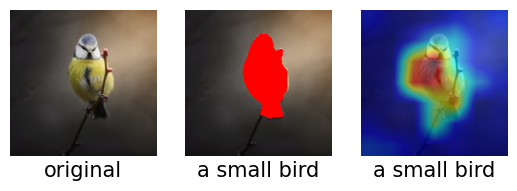

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a branch
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.004656699999941338 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  1.57it/s]

0.21909559 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.58it/s]


0.23357299 / 1

measuring similarity score for 2 segments is done in 1.2994266999999127 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.23357298970222473
Stage 1 is done in less than 1 min (1.3282186999999794 sec)!



3it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:09<00:18,  9.46s/it]

0.5147016 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:19<00:09,  9.71s/it]

0.30591738 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:32<00:00, 10.93s/it]

0.38854134 / 1

measuring similarity score for 3 segments is done in 32.793103599999995 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.5147016048431396
Stage 2 is done in less than 1 min (32.868959099999984 sec)!
Caption: a small bird perched on a branch
Query: a branch
Answer similarity score: 0.5147016048431396


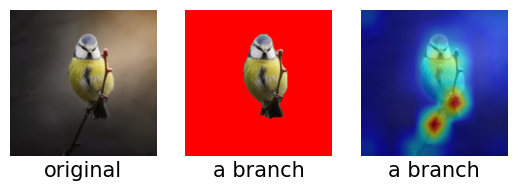

 30%|████████████████████████▎                                                         | 8/27 [21:46<49:47, 157.22s/it]

Testing image 9
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a deer standing in the woods



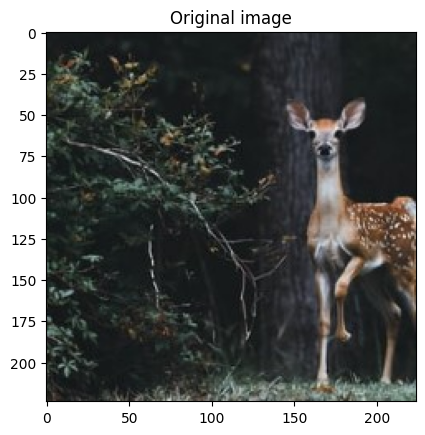

Queries: ['a deer standing', 'the woods']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a deer standing
Query dependency is: det ROOT acl
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (10.133465399999977 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  1.45it/s]

0.26473138 / 0.06947544642857142



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.34it/s]


0.28208867 / 0.9305245535714286

measuring similarity score for 2 segments is done in 1.5188136000001577 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (1.5364933999999266 sec)!



2it [00:00, 243.44it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:12<00:12, 12.56s/it]

0.4636494 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:22<00:00, 11.11s/it]

0.4636494 / 1

measuring similarity score for 2 segments is done in 22.23682780000013 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.4636493921279907
Stage 2 is done in less than 1 min (22.30208719999996 sec)!
Caption: a deer standing in the woods
Query: a deer standing
Answer similarity score: 1


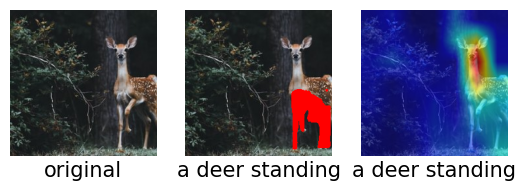

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is the woods
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0031109000001379172 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  1.27it/s]

0.2198551 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.48it/s]


0.23490778 / 1

measuring similarity score for 2 segments is done in 1.3878473999998278 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.23490777611732483
Stage 1 is done in less than 1 min (1.4203397999999652 sec)!



2it [00:00, 467.36it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:10<00:10, 10.52s/it]

0.67153937 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:29<00:00, 14.73s/it]

0.67153937 / 1

measuring similarity score for 2 segments is done in 29.48287550000009 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.6715393662452698
Stage 2 is done in less than 1 min (29.57049559999996 sec)!
Caption: a deer standing in the woods
Query: the woods
Answer similarity score: 0.6715393662452698


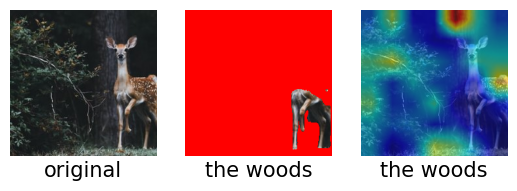

 33%|███████████████████████████▎                                                      | 9/27 [24:02<45:14, 150.80s/it]

Testing image 10
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a man sitting on a bench



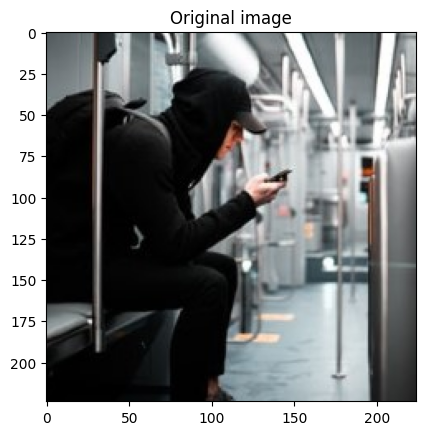

Queries: ['a man', 'a bench']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a man
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (5.238059700000122 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  7%|█████▉                                                                             | 1/14 [00:00<00:05,  2.60it/s]

0.24146341 / 0.26542570153061223



 14%|███████████▊                                                                       | 2/14 [00:00<00:05,  2.32it/s]

0.1946887 / 0.09022241709183673



 21%|█████████████████▊                                                                 | 3/14 [00:01<00:05,  1.87it/s]

0.20015317 / 0.17873086734693877



 29%|███████████████████████▋                                                           | 4/14 [00:02<00:05,  1.69it/s]

0.22905862 / 0.5454001913265306



 36%|█████████████████████████████▋                                                     | 5/14 [00:02<00:05,  1.65it/s]

0.24087436 / 0.355648118622449



 43%|███████████████████████████████████▌                                               | 6/14 [00:03<00:04,  1.62it/s]

0.2380536 / 0.444156568877551



 50%|█████████████████████████████████████████▌                                         | 7/14 [00:04<00:04,  1.57it/s]

0.2500506 / 0.8108258928571429



 57%|███████████████████████████████████████████████▍                                   | 8/14 [00:04<00:04,  1.44it/s]

0.19550401 / 0.18845663265306123



 64%|█████████████████████████████████████████████████████▎                             | 9/14 [00:05<00:03,  1.48it/s]

0.22110415 / 0.6356226084183674



 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [00:06<00:02,  1.45it/s]

0.21782582 / 0.7241310586734694



 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [00:07<00:02,  1.40it/s]

0.23790504 / 0.45388233418367346



 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [00:07<00:01,  1.40it/s]

0.24592511 / 0.9010483099489796



 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [00:08<00:00,  1.42it/s]

0.2453332 / 0.9895567602040817



100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:09<00:00,  1.53it/s]


0.21339296 / 0.7338568239795918

measuring similarity score for 14 segments is done in 9.147876499999938 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (9.166098199999851 sec)!



2it [00:00, 128.07it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:11<00:11, 11.16s/it]

0.29651266 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:19<00:00,  9.97s/it]

0.29651266 / 1

measuring similarity score for 2 segments is done in 19.97377800000004 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.2965126633644104
Stage 2 is done in less than 1 min (20.03938119999998 sec)!
Caption: a man sitting on a bench
Query: a man
Answer similarity score: 1


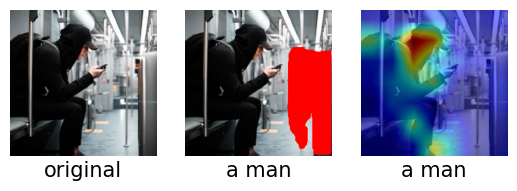

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a bench
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.003765400000020236 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  7%|█████▉                                                                             | 1/14 [00:01<00:17,  1.38s/it]

0.2224577 / 1



 14%|███████████▊                                                                       | 2/14 [00:02<00:13,  1.16s/it]

0.20242341 / 1



 21%|█████████████████▊                                                                 | 3/14 [00:03<00:11,  1.06s/it]

0.20950837 / 1



 29%|███████████████████████▋                                                           | 4/14 [00:04<00:10,  1.00s/it]

0.24256742 / 1



 36%|█████████████████████████████▋                                                     | 5/14 [00:05<00:08,  1.02it/s]

0.2253103 / 1



 43%|███████████████████████████████████▌                                               | 6/14 [00:06<00:07,  1.00it/s]

0.22338468 / 1



 50%|█████████████████████████████████████████▌                                         | 7/14 [00:07<00:06,  1.01it/s]

0.21703328 / 1



 57%|███████████████████████████████████████████████▍                                   | 8/14 [00:08<00:05,  1.05it/s]

0.20526953 / 1



 64%|█████████████████████████████████████████████████████▎                             | 9/14 [00:08<00:04,  1.10it/s]

0.24154022 / 1



 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [00:09<00:03,  1.09it/s]

0.24178752 / 1



 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [00:10<00:02,  1.10it/s]

0.22345248 / 1



 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [00:11<00:01,  1.12it/s]

0.22317109 / 1



 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [00:12<00:00,  1.10it/s]

0.23037341 / 1



100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:13<00:00,  1.04it/s]


0.2385791 / 1

measuring similarity score for 14 segments is done in 13.424843999999894 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.24256742000579834
Stage 1 is done in less than 1 min (13.439557400000012 sec)!



3it [00:00, 191.98it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:14<00:28, 14.40s/it]

0.12966946 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:27<00:13, 13.37s/it]

0.13126586 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:37<00:00, 12.37s/it]

0.24433103 / 1

measuring similarity score for 3 segments is done in 37.12642499999993 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.24433103203773499
Stage 2 is done in less than 1 min (37.192355099999986 sec)!
Caption: a man sitting on a bench
Query: a bench
Answer similarity score: 0.24433103203773499


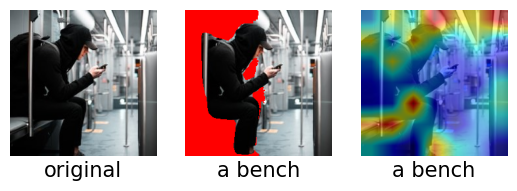

 37%|██████████████████████████████                                                   | 10/27 [26:41<43:23, 153.14s/it]

Testing image 11
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a group of women running on a track



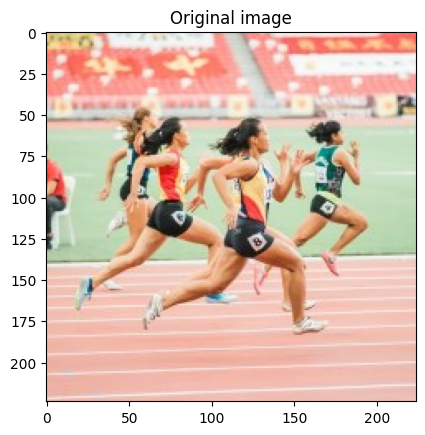

Queries: ['a group', 'women', 'a track']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a group
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (5.664545500000031 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  1%|▋                                                                                 | 1/126 [00:00<00:55,  2.24it/s]

0.20696017 / 0.03872369260204082



  2%|█▎                                                                                | 2/126 [00:01<01:07,  1.83it/s]

0.20437643 / 0.07545440051020408



  2%|█▉                                                                                | 3/126 [00:01<01:25,  1.44it/s]

0.22616921 / 0.0054807079081632655



  3%|██▌                                                                               | 4/126 [00:02<01:31,  1.34it/s]

0.2211952 / 0.007872289540816327



  4%|███▎                                                                              | 5/126 [00:03<01:23,  1.44it/s]

0.20424135 / 0.06068638392857143



  5%|███▉                                                                              | 6/126 [00:04<01:23,  1.44it/s]

0.21163772 / 0.011399872448979591



  6%|████▌                                                                             | 7/126 [00:05<01:36,  1.23it/s]

0.25738034 / 0.8007413903061225



  6%|█████▏                                                                            | 8/126 [00:06<01:40,  1.18it/s]

0.22074121 / 0.1141780931122449



  7%|█████▊                                                                            | 9/126 [00:06<01:38,  1.18it/s]

0.23299593 / 0.04420440051020408



  8%|██████▍                                                                          | 10/126 [00:07<01:38,  1.17it/s]

0.22622791 / 0.046595982142857144



  9%|███████                                                                          | 11/126 [00:08<01:39,  1.15it/s]

0.2291075 / 0.09941007653061225



 10%|███████▋                                                                         | 12/126 [00:09<01:37,  1.17it/s]

0.22836894 / 0.050123565051020405



 10%|████████▎                                                                        | 13/126 [00:10<01:35,  1.19it/s]

0.25224835 / 0.8394650829081632



 11%|█████████                                                                        | 14/126 [00:11<01:34,  1.19it/s]

0.22299534 / 0.08093510841836735



 12%|█████████▋                                                                       | 15/126 [00:12<01:35,  1.17it/s]

0.22577749 / 0.0833266900510204



 13%|██████████▎                                                                      | 16/126 [00:12<01:31,  1.20it/s]

0.23383676 / 0.13588169642857142



 13%|██████████▉                                                                      | 17/126 [00:13<01:28,  1.23it/s]

0.20867771 / 0.08685427295918367



 14%|███████████▌                                                                     | 18/126 [00:14<01:25,  1.26it/s]

0.24788998 / 0.8761957908163265



 15%|████████████▏                                                                    | 19/126 [00:15<01:27,  1.22it/s]

0.22483422 / 0.013253348214285714



 16%|████████████▊                                                                    | 20/126 [00:16<01:26,  1.22it/s]

0.22715676 / 0.06616709183673469



 17%|█████████████▌                                                                   | 21/126 [00:16<01:25,  1.23it/s]

0.23497605 / 0.016880580357142856



 17%|██████████████▏                                                                  | 22/126 [00:17<01:25,  1.21it/s]

0.2540964 / 0.8062220982142857



 18%|██████████████▊                                                                  | 23/126 [00:18<01:22,  1.25it/s]

0.21697608 / 0.06855867346938775



 19%|███████████████▍                                                                 | 24/126 [00:19<01:20,  1.26it/s]

0.21681334 / 0.01927216198979592



 20%|████████████████                                                                 | 25/126 [00:19<01:17,  1.31it/s]

0.25104326 / 0.8086136798469388



 21%|████████████████▋                                                                | 26/126 [00:20<01:12,  1.38it/s]

0.22479321 / 0.07208625637755102



 21%|█████████████████▎                                                               | 27/126 [00:21<01:07,  1.48it/s]

0.2435689 / 0.8614277742346939



 22%|██████████████████                                                               | 28/126 [00:21<01:03,  1.55it/s]

0.25544074 / 0.812141262755102



 23%|██████████████████▋                                                              | 29/126 [00:22<01:09,  1.40it/s]

0.22729743 / 0.11965880102040816



 24%|███████████████████▎                                                             | 30/126 [00:23<01:08,  1.39it/s]

0.23406214 / 0.12205038265306123



 25%|███████████████████▉                                                             | 31/126 [00:24<01:14,  1.28it/s]

0.2590954 / 0.17460538903061223



 25%|████████████████████▌                                                            | 32/126 [00:25<01:15,  1.25it/s]

0.22101551 / 0.1255779655612245



 26%|█████████████████████▏                                                           | 33/126 [00:25<01:13,  1.27it/s]

0.25407887 / 0.9149194834183674



 27%|█████████████████████▊                                                           | 34/126 [00:26<01:13,  1.25it/s]

0.2366876 / 0.05197704081632653



 28%|██████████████████████▌                                                          | 35/126 [00:27<01:14,  1.21it/s]

0.2472192 / 0.10489078443877552



 29%|███████████████████████▏                                                         | 36/126 [00:28<01:14,  1.21it/s]

0.2472611 / 0.05560427295918367



 29%|███████████████████████▊                                                         | 37/126 [00:29<01:12,  1.22it/s]

0.249161 / 0.8449457908163265



 30%|████████████████████████▍                                                        | 38/126 [00:30<01:15,  1.17it/s]

0.23957992 / 0.10728236607142858



 31%|█████████████████████████                                                        | 39/126 [00:30<01:14,  1.16it/s]

0.24173748 / 0.05799585459183673



 32%|█████████████████████████▋                                                       | 40/126 [00:31<01:17,  1.11it/s]

0.25087908 / 0.8473373724489796



 33%|██████████████████████████▎                                                      | 41/126 [00:32<01:17,  1.09it/s]

0.24447651 / 0.11080994897959184



 33%|███████████████████████████                                                      | 42/126 [00:33<01:16,  1.10it/s]

0.25673386 / 0.9001514668367347



 34%|███████████████████████████▋                                                     | 43/126 [00:34<01:13,  1.13it/s]

0.25684083 / 0.8508649553571429



 35%|████████████████████████████▎                                                    | 44/126 [00:35<01:12,  1.13it/s]

0.2385028 / 0.08870774872448979



 36%|████████████████████████████▉                                                    | 45/126 [00:36<01:08,  1.19it/s]

0.24011311 / 0.1413624043367347



 37%|█████████████████████████████▌                                                   | 46/126 [00:36<01:04,  1.25it/s]

0.22285224 / 0.09233498086734694



 37%|██████████████████████████████▏                                                  | 47/126 [00:37<01:01,  1.29it/s]

0.2442751 / 0.8816764987244898



 38%|██████████████████████████████▊                                                  | 48/126 [00:38<00:59,  1.32it/s]

0.2483623 / 0.14375398596938777



 39%|███████████████████████████████▌                                                 | 49/126 [00:39<00:58,  1.32it/s]

0.22577289 / 0.0947265625



 40%|████████████████████████████████▏                                                | 50/126 [00:39<00:53,  1.41it/s]

0.24569546 / 0.8840680803571429



 40%|████████████████████████████████▊                                                | 51/126 [00:40<00:50,  1.47it/s]

0.23887694 / 0.14728156887755103



 41%|█████████████████████████████████▍                                               | 52/126 [00:40<00:47,  1.54it/s]

0.25326046 / 0.9366230867346939



 42%|██████████████████████████████████                                               | 53/126 [00:41<00:45,  1.62it/s]

0.24865197 / 0.8875956632653061



 43%|██████████████████████████████████▋                                              | 54/126 [00:42<00:43,  1.64it/s]

0.2234708 / 0.07393973214285714



 44%|███████████████████████████████████▎                                             | 55/126 [00:42<00:42,  1.68it/s]

0.22092506 / 0.024653220663265307



 44%|████████████████████████████████████                                             | 56/126 [00:43<00:39,  1.77it/s]

0.25338852 / 0.8139947385204082



 45%|████████████████████████████████████▋                                            | 57/126 [00:43<00:42,  1.61it/s]

0.23905817 / 0.07756696428571429



 46%|█████████████████████████████████████▎                                           | 58/126 [00:44<00:41,  1.63it/s]

0.24674007 / 0.8669084821428571



 47%|█████████████████████████████████████▉                                           | 59/126 [00:44<00:39,  1.70it/s]

0.25294286 / 0.8176219706632653



 48%|██████████████████████████████████████▌                                          | 60/126 [00:45<00:37,  1.76it/s]

0.22765534 / 0.07995854591836735



 48%|███████████████████████████████████████▏                                         | 61/126 [00:46<00:36,  1.78it/s]

0.24990356 / 0.8693000637755102



 49%|███████████████████████████████████████▊                                         | 62/126 [00:46<00:35,  1.81it/s]

0.25019392 / 0.8200135522959183



 50%|████████████████████████████████████████▌                                        | 63/126 [00:47<00:34,  1.81it/s]

0.25607604 / 0.8728276466836735



 51%|█████████████████████████████████████████▏                                       | 64/126 [00:47<00:36,  1.70it/s]

0.24086644 / 0.12743144132653061



 52%|█████████████████████████████████████████▊                                       | 65/126 [00:48<00:35,  1.73it/s]

0.25744587 / 0.1800860969387755



 52%|██████████████████████████████████████████▍                                      | 66/126 [00:48<00:34,  1.74it/s]

0.22601205 / 0.13105867346938777



 53%|███████████████████████████████████████████                                      | 67/126 [00:49<00:33,  1.77it/s]

0.25222275 / 0.9204001913265306



 54%|███████████████████████████████████████████▋                                     | 68/126 [00:50<00:32,  1.79it/s]

0.25342646 / 0.18247767857142858



 55%|████████████████████████████████████████████▎                                    | 69/126 [00:50<00:33,  1.72it/s]

0.23395032 / 0.1334502551020408



 56%|█████████████████████████████████████████████                                    | 70/126 [00:51<00:35,  1.59it/s]

0.25247753 / 0.9227917729591837



 56%|█████████████████████████████████████████████▋                                   | 71/126 [00:52<00:35,  1.57it/s]

0.2596269 / 0.18600526147959184



 57%|██████████████████████████████████████████████▎                                  | 72/126 [00:52<00:34,  1.56it/s]

0.2585793 / 0.9753467793367347



 58%|██████████████████████████████████████████████▉                                  | 73/126 [00:53<00:36,  1.44it/s]

0.25342163 / 0.9263193558673469



 59%|███████████████████████████████████████████████▌                                 | 74/126 [00:54<00:36,  1.41it/s]

0.24562399 / 0.11266342474489796



 60%|████████████████████████████████████████████████▏                                | 75/126 [00:54<00:34,  1.49it/s]

0.24541396 / 0.06337691326530612



 60%|████████████████████████████████████████████████▊                                | 76/126 [00:55<00:32,  1.55it/s]

0.24727793 / 0.8527184311224489



 61%|█████████████████████████████████████████████████▌                               | 77/126 [00:55<00:29,  1.64it/s]

0.25129253 / 0.1162906568877551



 62%|██████████████████████████████████████████████████▏                              | 78/126 [00:56<00:31,  1.50it/s]

0.2568265 / 0.905632174744898



 63%|██████████████████████████████████████████████████▊                              | 79/126 [00:57<00:36,  1.29it/s]

0.2550683 / 0.8563456632653061



 63%|███████████████████████████████████████████████████▍                             | 80/126 [00:58<00:38,  1.20it/s]

0.24484134 / 0.11868223852040816



 64%|████████████████████████████████████████████████████                             | 81/126 [00:59<00:40,  1.11it/s]

0.2592332 / 0.9080237563775511



 65%|████████████████████████████████████████████████████▋                            | 82/126 [01:00<00:36,  1.22it/s]

0.25523844 / 0.8587372448979592



 66%|█████████████████████████████████████████████████████▎                           | 83/126 [01:01<00:32,  1.34it/s]

0.2657085 / 0.9115513392857143



 67%|██████████████████████████████████████████████████████                           | 84/126 [01:01<00:29,  1.42it/s]

0.24966785 / 0.14913504464285715



 67%|██████████████████████████████████████████████████████▋                          | 85/126 [01:02<00:26,  1.56it/s]

0.23918404 / 0.10010762117346939



 68%|███████████████████████████████████████████████████████▎                         | 86/126 [01:02<00:24,  1.60it/s]

0.23821074 / 0.8894491390306123



 69%|███████████████████████████████████████████████████████▉                         | 87/126 [01:03<00:23,  1.66it/s]

0.2424117 / 0.15276227678571427



 70%|████████████████████████████████████████████████████████▌                        | 88/126 [01:03<00:24,  1.57it/s]

0.25560603 / 0.9421037946428571



 71%|█████████████████████████████████████████████████████████▏                       | 89/126 [01:04<00:26,  1.40it/s]

0.2463187 / 0.8930763711734694



 71%|█████████████████████████████████████████████████████████▊                       | 90/126 [01:05<00:27,  1.30it/s]

0.25005364 / 0.15515385841836735



 72%|██████████████████████████████████████████████████████████▌                      | 91/126 [01:06<00:28,  1.25it/s]

0.2566852 / 0.9444953762755102



 73%|███████████████████████████████████████████████████████████▏                     | 92/126 [01:07<00:27,  1.24it/s]

0.24758568 / 0.8954679528061225



 74%|███████████████████████████████████████████████████████████▊                     | 93/126 [01:08<00:26,  1.25it/s]

0.25358477 / 0.9480229591836735



 75%|████████████████████████████████████████████████████████████▍                    | 94/126 [01:09<00:25,  1.26it/s]

0.2349377 / 0.08533960459183673



 75%|█████████████████████████████████████████████████████████████                    | 95/126 [01:09<00:24,  1.27it/s]

0.23841648 / 0.8746811224489796



 76%|█████████████████████████████████████████████████████████████▋                   | 96/126 [01:10<00:24,  1.23it/s]

0.25184909 / 0.8253946109693877



 77%|██████████████████████████████████████████████████████████████▎                  | 97/126 [01:11<00:23,  1.24it/s]

0.2600557 / 0.8783083545918368



 78%|███████████████████████████████████████████████████████████████                  | 98/126 [01:12<00:22,  1.22it/s]

0.25994033 / 0.8806999362244898



 79%|███████████████████████████████████████████████████████████████▋                 | 99/126 [01:13<00:21,  1.26it/s]

0.25600988 / 0.18785873724489796



 79%|███████████████████████████████████████████████████████████████▍                | 100/126 [01:13<00:19,  1.30it/s]

0.24046981 / 0.1388313137755102



 80%|████████████████████████████████████████████████████████████████▏               | 101/126 [01:14<00:19,  1.26it/s]

0.247603 / 0.9281728316326531



 81%|████████████████████████████████████████████████████████████████▊               | 102/126 [01:15<00:19,  1.26it/s]

0.2552143 / 0.1914859693877551



 82%|█████████████████████████████████████████████████████████████████▍              | 103/126 [01:16<00:17,  1.28it/s]

0.26074225 / 0.980827487244898



 83%|██████████████████████████████████████████████████████████████████              | 104/126 [01:16<00:16,  1.35it/s]

0.25090644 / 0.9318000637755102



 83%|██████████████████████████████████████████████████████████████████▋             | 105/126 [01:17<00:14,  1.46it/s]

0.2536633 / 0.19387755102040816



 84%|███████████████████████████████████████████████████████████████████▎            | 106/126 [01:17<00:12,  1.55it/s]

0.26054928 / 0.9832190688775511



 85%|███████████████████████████████████████████████████████████████████▉            | 107/126 [01:18<00:11,  1.61it/s]

0.25105152 / 0.9341916454081632



 86%|████████████████████████████████████████████████████████████████████▌           | 108/126 [01:19<00:10,  1.66it/s]

0.26083937 / 0.9867466517857143



 87%|█████████████████████████████████████████████████████████████████████▏          | 109/126 [01:19<00:10,  1.67it/s]

0.24850418 / 0.12406329719387756



 87%|█████████████████████████████████████████████████████████████████████▊          | 110/126 [01:20<00:09,  1.71it/s]

0.2475265 / 0.9134048150510204



 88%|██████████████████████████████████████████████████████████████████████▍         | 111/126 [01:20<00:08,  1.70it/s]

0.2529243 / 0.8641183035714286



 89%|███████████████████████████████████████████████████████████████████████         | 112/126 [01:21<00:08,  1.73it/s]

0.26543844 / 0.9170320471938775



 90%|███████████████████████████████████████████████████████████████████████▋        | 113/126 [01:21<00:07,  1.78it/s]

0.26519296 / 0.9194236288265306



 90%|████████████████████████████████████████████████████████████████████████▍       | 114/126 [01:22<00:06,  1.85it/s]

0.25228006 / 0.16053491709183673



 91%|█████████████████████████████████████████████████████████████████████████       | 115/126 [01:22<00:05,  1.89it/s]

0.25270593 / 0.9498764349489796



 92%|█████████████████████████████████████████████████████████████████████████▋      | 116/126 [01:23<00:05,  1.91it/s]

0.24131349 / 0.9008490114795918



 93%|██████████████████████████████████████████████████████████████████████████▎     | 117/126 [01:23<00:04,  1.91it/s]

0.2569116 / 0.9535036670918368



 94%|██████████████████████████████████████████████████████████████████████████▉     | 118/126 [01:24<00:04,  1.85it/s]

0.25775716 / 0.9558952487244898



 94%|███████████████████████████████████████████████████████████████████████████▌    | 119/126 [01:24<00:03,  1.84it/s]

0.25215012 / 0.8860809948979592



 95%|████████████████████████████████████████████████████████████████████████████▏   | 120/126 [01:25<00:03,  1.83it/s]

0.25655386 / 0.19925860969387754



 96%|████████████████████████████████████████████████████████████████████████████▊   | 121/126 [01:26<00:02,  1.78it/s]

0.25789484 / 0.9886001275510204



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 122/126 [01:26<00:02,  1.78it/s]

0.24727331 / 0.9395727040816326



 98%|██████████████████████████████████████████████████████████████████████████████  | 123/126 [01:27<00:01,  1.85it/s]

0.2633187 / 0.9922273596938775



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 124/126 [01:27<00:01,  1.83it/s]

0.26284266 / 0.9946189413265306



 99%|███████████████████████████████████████████████████████████████████████████████▎| 125/126 [01:28<00:00,  1.89it/s]

0.2583486 / 0.9248046875



100%|████████████████████████████████████████████████████████████████████████████████| 126/126 [01:28<00:00,  1.42it/s]


0.25441414 / 0.9612763073979592

measuring similarity score for 126 segments is done in 88.80846550000001 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 2 min (88.82233109999993 sec)!



4it [00:00, 240.46it/s]


stage 2 calculate_similarity_scores starts



 25%|█████████████████████                                                               | 1/4 [00:10<00:32, 10.89s/it]

0.08337991 / 1



 50%|██████████████████████████████████████████                                          | 2/4 [00:21<00:21, 10.91s/it]

0.08337991 / 1



 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:34<00:11, 11.75s/it]

0.34305838 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:48<00:00, 12.03s/it]


0.59359986 / 1

measuring similarity score for 4 segments is done in 48.132364699999926 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.5935998558998108
Stage 2 is done in less than 1 min (48.2001788 sec)!
Caption: a group of women running on a track
Query: a group
Answer similarity score: 1


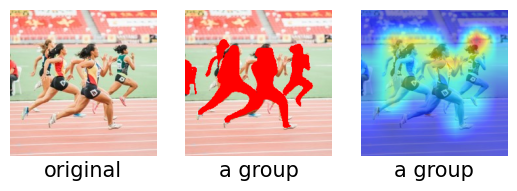

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is women
Query dependency is: pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0040067999998427695 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  1%|▋                                                                                 | 1/126 [00:00<01:43,  1.21it/s]

0.2196058 / 1



  2%|█▎                                                                                | 2/126 [00:01<01:54,  1.09it/s]

0.22677861 / 1



  2%|█▉                                                                                | 3/126 [00:02<01:36,  1.27it/s]

0.22755817 / 1



  3%|██▌                                                                               | 4/126 [00:03<01:25,  1.42it/s]

0.22037655 / 1



  4%|███▎                                                                              | 5/126 [00:03<01:33,  1.30it/s]

0.23055631 / 1



  5%|███▉                                                                              | 6/126 [00:04<01:39,  1.21it/s]

0.21897872 / 1



  6%|████▌                                                                             | 7/126 [00:05<01:39,  1.20it/s]

0.23414418 / 1



  6%|█████▏                                                                            | 8/126 [00:06<01:43,  1.14it/s]

0.23336181 / 1



  7%|█████▊                                                                            | 9/126 [00:07<01:36,  1.21it/s]

0.22843732 / 1



  8%|██████▍                                                                          | 10/126 [00:07<01:28,  1.32it/s]

0.22852534 / 1



  9%|███████                                                                          | 11/126 [00:08<01:22,  1.40it/s]

0.23106454 / 1



 10%|███████▋                                                                         | 12/126 [00:09<01:20,  1.42it/s]

0.23220015 / 1



 10%|████████▎                                                                        | 13/126 [00:09<01:14,  1.51it/s]

0.21973994 / 1



 11%|█████████                                                                        | 14/126 [00:10<01:13,  1.52it/s]

0.22905308 / 1



 12%|█████████▋                                                                       | 15/126 [00:11<01:13,  1.50it/s]

0.23300108 / 1



 13%|██████████▎                                                                      | 16/126 [00:11<01:12,  1.51it/s]

0.23290479 / 1



 13%|██████████▉                                                                      | 17/126 [00:12<01:09,  1.58it/s]

0.22587557 / 1



 14%|███████████▌                                                                     | 18/126 [00:13<01:07,  1.60it/s]

0.22590557 / 1



 15%|████████████▏                                                                    | 19/126 [00:13<01:04,  1.66it/s]

0.22436383 / 1



 16%|████████████▊                                                                    | 20/126 [00:14<01:02,  1.69it/s]

0.23757511 / 1



 17%|█████████████▌                                                                   | 21/126 [00:14<01:03,  1.64it/s]

0.22393319 / 1



 17%|██████████████▏                                                                  | 22/126 [00:15<01:05,  1.58it/s]

0.23451367 / 1



 18%|██████████████▊                                                                  | 23/126 [00:16<01:05,  1.58it/s]

0.23195904 / 1



 19%|███████████████▍                                                                 | 24/126 [00:16<01:02,  1.63it/s]

0.22434562 / 1



 20%|████████████████                                                                 | 25/126 [00:17<01:01,  1.64it/s]

0.23049264 / 1



 21%|████████████████▋                                                                | 26/126 [00:17<01:01,  1.62it/s]

0.23574808 / 1



 21%|█████████████████▎                                                               | 27/126 [00:18<01:04,  1.54it/s]

0.21286799 / 1



 22%|██████████████████                                                               | 28/126 [00:19<01:04,  1.53it/s]

0.23129773 / 1



 23%|██████████████████▋                                                              | 29/126 [00:19<01:02,  1.55it/s]

0.2323222 / 1



 24%|███████████████████▎                                                             | 30/126 [00:20<01:00,  1.59it/s]

0.23263815 / 1



 25%|███████████████████▉                                                             | 31/126 [00:21<00:56,  1.67it/s]

0.23797569 / 1



 25%|████████████████████▌                                                            | 32/126 [00:21<00:54,  1.72it/s]

0.23127982 / 1



 26%|█████████████████████▏                                                           | 33/126 [00:22<00:55,  1.67it/s]

0.22015853 / 1



 27%|█████████████████████▊                                                           | 34/126 [00:22<00:54,  1.70it/s]

0.23342633 / 1



 28%|██████████████████████▌                                                          | 35/126 [00:23<00:53,  1.69it/s]

0.23474441 / 1



 29%|███████████████████████▏                                                         | 36/126 [00:24<00:57,  1.55it/s]

0.23187993 / 1



 29%|███████████████████████▊                                                         | 37/126 [00:24<00:55,  1.60it/s]

0.21778238 / 1



 30%|████████████████████████▍                                                        | 38/126 [00:25<00:54,  1.60it/s]

0.22939718 / 1



 31%|█████████████████████████                                                        | 39/126 [00:25<00:53,  1.63it/s]

0.23140754 / 1



 32%|█████████████████████████▋                                                       | 40/126 [00:26<00:51,  1.67it/s]

0.21908891 / 1



 33%|██████████████████████████▎                                                      | 41/126 [00:27<01:00,  1.41it/s]

0.23400162 / 1



 33%|███████████████████████████                                                      | 42/126 [00:28<01:04,  1.29it/s]

0.21296203 / 1



 34%|███████████████████████████▋                                                     | 43/126 [00:29<01:08,  1.21it/s]

0.21910563 / 1



 35%|████████████████████████████▎                                                    | 44/126 [00:30<01:07,  1.21it/s]

0.23741749 / 1



 36%|████████████████████████████▉                                                    | 45/126 [00:30<01:05,  1.24it/s]

0.23824228 / 1



 37%|█████████████████████████████▌                                                   | 46/126 [00:31<01:05,  1.22it/s]

0.22858565 / 1



 37%|██████████████████████████████▏                                                  | 47/126 [00:32<01:05,  1.21it/s]

0.22573146 / 1



 38%|██████████████████████████████▊                                                  | 48/126 [00:33<01:02,  1.26it/s]

0.23854966 / 1



 39%|███████████████████████████████▌                                                 | 49/126 [00:34<00:59,  1.30it/s]

0.23029706 / 1



 40%|████████████████████████████████▏                                                | 50/126 [00:34<01:01,  1.24it/s]

0.22642484 / 1



 40%|████████████████████████████████▊                                                | 51/126 [00:35<01:00,  1.24it/s]

0.2342633 / 1



 41%|█████████████████████████████████▍                                               | 52/126 [00:36<00:59,  1.24it/s]

0.22475974 / 1



 42%|██████████████████████████████████                                               | 53/126 [00:37<00:59,  1.23it/s]

0.22879869 / 1



 43%|██████████████████████████████████▋                                              | 54/126 [00:38<00:59,  1.20it/s]

0.23521699 / 1



 44%|███████████████████████████████████▎                                             | 55/126 [00:39<01:00,  1.17it/s]

0.23156121 / 1



 44%|████████████████████████████████████                                             | 56/126 [00:39<00:57,  1.23it/s]

0.23319684 / 1



 45%|████████████████████████████████████▋                                            | 57/126 [00:40<00:51,  1.35it/s]

0.2364364 / 1



 46%|█████████████████████████████████████▎                                           | 58/126 [00:40<00:45,  1.51it/s]

0.21401833 / 1



 47%|█████████████████████████████████████▉                                           | 59/126 [00:41<00:42,  1.59it/s]

0.23223446 / 1



 48%|██████████████████████████████████████▌                                          | 60/126 [00:42<00:39,  1.66it/s]

0.23115806 / 1



 48%|███████████████████████████████████████▏                                         | 61/126 [00:42<00:39,  1.65it/s]

0.21852157 / 1



 49%|███████████████████████████████████████▊                                         | 62/126 [00:43<00:39,  1.62it/s]

0.22781599 / 1



 50%|████████████████████████████████████████▌                                        | 63/126 [00:43<00:36,  1.74it/s]

0.21818416 / 1



 51%|█████████████████████████████████████████▏                                       | 64/126 [00:44<00:33,  1.83it/s]

0.23598294 / 1



 52%|█████████████████████████████████████████▊                                       | 65/126 [00:44<00:33,  1.84it/s]

0.24077621 / 1



 52%|██████████████████████████████████████████▍                                      | 66/126 [00:45<00:34,  1.72it/s]

0.23088984 / 1



 53%|███████████████████████████████████████████                                      | 67/126 [00:46<00:34,  1.73it/s]

0.22015758 / 1



 54%|███████████████████████████████████████████▋                                     | 68/126 [00:46<00:32,  1.79it/s]

0.23408225 / 1



 55%|████████████████████████████████████████████▎                                    | 69/126 [00:47<00:31,  1.80it/s]

0.23008208 / 1



 56%|█████████████████████████████████████████████                                    | 70/126 [00:47<00:30,  1.84it/s]

0.22120526 / 1



 56%|█████████████████████████████████████████████▋                                   | 71/126 [00:48<00:29,  1.86it/s]

0.2393649 / 1



 57%|██████████████████████████████████████████████▎                                  | 72/126 [00:48<00:29,  1.83it/s]

0.21901527 / 1



 58%|██████████████████████████████████████████████▉                                  | 73/126 [00:49<00:30,  1.76it/s]

0.22137155 / 1



 59%|███████████████████████████████████████████████▌                                 | 74/126 [00:49<00:29,  1.79it/s]

0.2331458 / 1



 60%|████████████████████████████████████████████████▏                                | 75/126 [00:50<00:28,  1.76it/s]

0.2345125 / 1



 60%|████████████████████████████████████████████████▊                                | 76/126 [00:50<00:27,  1.84it/s]

0.21970485 / 1



 61%|█████████████████████████████████████████████████▌                               | 77/126 [00:51<00:26,  1.82it/s]

0.2344935 / 1



 62%|██████████████████████████████████████████████████▏                              | 78/126 [00:52<00:30,  1.55it/s]

0.21412036 / 1



 63%|██████████████████████████████████████████████████▊                              | 79/126 [00:53<00:32,  1.46it/s]

0.21754824 / 1



 63%|███████████████████████████████████████████████████▍                             | 80/126 [00:54<00:36,  1.25it/s]

0.22997399 / 1



 64%|████████████████████████████████████████████████████                             | 81/126 [00:55<00:37,  1.18it/s]

0.21705544 / 1



 65%|████████████████████████████████████████████████████▋                            | 82/126 [00:56<00:39,  1.11it/s]

0.21788351 / 1



 66%|█████████████████████████████████████████████████████▎                           | 83/126 [00:57<00:39,  1.08it/s]

0.21420541 / 1



 67%|██████████████████████████████████████████████████████                           | 84/126 [00:58<00:38,  1.08it/s]

0.24071325 / 1



 67%|██████████████████████████████████████████████████████▋                          | 85/126 [00:59<00:39,  1.05it/s]

0.23422013 / 1



 68%|███████████████████████████████████████████████████████▎                         | 86/126 [01:00<00:38,  1.05it/s]

0.22872336 / 1



 69%|███████████████████████████████████████████████████████▉                         | 87/126 [01:00<00:36,  1.06it/s]

0.23843677 / 1



 70%|████████████████████████████████████████████████████████▌                        | 88/126 [01:01<00:35,  1.07it/s]

0.2237365 / 1



 71%|█████████████████████████████████████████████████████████▏                       | 89/126 [01:02<00:32,  1.13it/s]

0.22695671 / 1



 71%|█████████████████████████████████████████████████████████▊                       | 90/126 [01:03<00:29,  1.24it/s]

0.23883885 / 1



 72%|██████████████████████████████████████████████████████████▌                      | 91/126 [01:04<00:27,  1.25it/s]

0.22743337 / 1



 73%|███████████████████████████████████████████████████████████▏                     | 92/126 [01:04<00:27,  1.24it/s]

0.22621661 / 1



 74%|███████████████████████████████████████████████████████████▊                     | 93/126 [01:05<00:26,  1.23it/s]

0.22583203 / 1



 75%|████████████████████████████████████████████████████████████▍                    | 94/126 [01:06<00:25,  1.24it/s]

0.2353199 / 1



 75%|█████████████████████████████████████████████████████████████                    | 95/126 [01:07<00:25,  1.21it/s]

0.21567664 / 1



 76%|█████████████████████████████████████████████████████████████▋                   | 96/126 [01:08<00:25,  1.16it/s]

0.23093641 / 1



 77%|██████████████████████████████████████████████████████████████▎                  | 97/126 [01:09<00:25,  1.13it/s]

0.21958831 / 1



 78%|███████████████████████████████████████████████████████████████                  | 98/126 [01:10<00:25,  1.09it/s]

0.22310413 / 1



 79%|███████████████████████████████████████████████████████████████▋                 | 99/126 [01:11<00:23,  1.15it/s]

0.2383204 / 1



 79%|███████████████████████████████████████████████████████████████▍                | 100/126 [01:11<00:21,  1.20it/s]

0.23339343 / 1



 80%|████████████████████████████████████████████████████████████████▏               | 101/126 [01:12<00:19,  1.27it/s]

0.22293177 / 1



 81%|████████████████████████████████████████████████████████████████▊               | 102/126 [01:13<00:17,  1.37it/s]

0.24155356 / 1



 82%|█████████████████████████████████████████████████████████████████▍              | 103/126 [01:13<00:15,  1.51it/s]

0.21965347 / 1



 83%|██████████████████████████████████████████████████████████████████              | 104/126 [01:14<00:13,  1.60it/s]

0.218837 / 1



 83%|██████████████████████████████████████████████████████████████████▋             | 105/126 [01:14<00:12,  1.65it/s]

0.23525186 / 1



 84%|███████████████████████████████████████████████████████████████████▎            | 106/126 [01:15<00:11,  1.71it/s]

0.22105587 / 1



 85%|███████████████████████████████████████████████████████████████████▉            | 107/126 [01:15<00:10,  1.75it/s]

0.21973811 / 1



 86%|████████████████████████████████████████████████████████████████████▌           | 108/126 [01:16<00:10,  1.74it/s]

0.22076277 / 1



 87%|█████████████████████████████████████████████████████████████████████▏          | 109/126 [01:16<00:09,  1.72it/s]

0.23330343 / 1



 87%|█████████████████████████████████████████████████████████████████████▊          | 110/126 [01:17<00:09,  1.67it/s]

0.21697809 / 1



 88%|██████████████████████████████████████████████████████████████████████▍         | 111/126 [01:18<00:09,  1.67it/s]

0.21926175 / 1



 89%|███████████████████████████████████████████████████████████████████████         | 112/126 [01:18<00:08,  1.72it/s]

0.21587846 / 1



 90%|███████████████████████████████████████████████████████████████████████▋        | 113/126 [01:19<00:07,  1.78it/s]

0.21867044 / 1



 90%|████████████████████████████████████████████████████████████████████████▍       | 114/126 [01:19<00:06,  1.82it/s]

0.24063185 / 1



 91%|█████████████████████████████████████████████████████████████████████████       | 115/126 [01:20<00:06,  1.72it/s]

0.22747736 / 1



 92%|█████████████████████████████████████████████████████████████████████████▋      | 116/126 [01:21<00:05,  1.67it/s]

0.2296159 / 1



 93%|██████████████████████████████████████████████████████████████████████████▎     | 117/126 [01:21<00:05,  1.61it/s]

0.22398046 / 1



 94%|██████████████████████████████████████████████████████████████████████████▉     | 118/126 [01:22<00:04,  1.64it/s]

0.22726953 / 1



 94%|███████████████████████████████████████████████████████████████████████████▌    | 119/126 [01:22<00:04,  1.65it/s]

0.2231949 / 1



 95%|████████████████████████████████████████████████████████████████████████████▏   | 120/126 [01:23<00:03,  1.74it/s]

0.23897123 / 1



 96%|████████████████████████████████████████████████████████████████████████████▊   | 121/126 [01:23<00:02,  1.77it/s]

0.22226867 / 1



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 122/126 [01:24<00:02,  1.74it/s]

0.2219653 / 1



 98%|██████████████████████████████████████████████████████████████████████████████  | 123/126 [01:25<00:01,  1.75it/s]

0.22045591 / 1



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 124/126 [01:26<00:01,  1.32it/s]

0.2212609 / 1



 99%|███████████████████████████████████████████████████████████████████████████████▎| 125/126 [01:27<00:00,  1.25it/s]

0.22123182 / 1



100%|████████████████████████████████████████████████████████████████████████████████| 126/126 [01:28<00:00,  1.43it/s]


0.22857605 / 1

measuring similarity score for 126 segments is done in 88.13742549999984 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.24155355989933014
Stage 1 is done in less than 2 min (88.16276019999987 sec)!



4it [00:00, 256.06it/s]


stage 2 calculate_similarity_scores starts



 25%|█████████████████████                                                               | 1/4 [00:15<00:47, 15.98s/it]

0.40567923 / 1



 50%|██████████████████████████████████████████                                          | 2/4 [00:32<00:32, 16.11s/it]

0.39518803 / 1



 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:54<00:19, 19.09s/it]

0.35821941 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [01:10<00:00, 17.56s/it]

0.44703168 / 1

measuring similarity score for 4 segments is done in 70.27321740000002 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.4470316767692566
Stage 2 is done in less than 2 min (70.37829030000012 sec)!
Caption: a group of women running on a track
Query: women
Answer similarity score: 0.4470316767692566


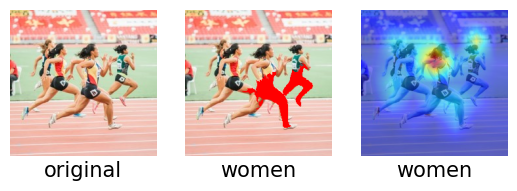

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a track
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0034147999999731837 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  1%|▋                                                                                 | 1/126 [00:00<01:37,  1.28it/s]

0.23372136 / 1



  2%|█▎                                                                                | 2/126 [00:01<01:28,  1.41it/s]

0.23690085 / 1



  2%|█▉                                                                                | 3/126 [00:02<01:20,  1.52it/s]

0.22987165 / 1



  3%|██▌                                                                               | 4/126 [00:02<01:24,  1.45it/s]

0.22674288 / 1



  4%|███▎                                                                              | 5/126 [00:03<01:17,  1.56it/s]

0.23198229 / 1



  5%|███▉                                                                              | 6/126 [00:03<01:14,  1.61it/s]

0.22863567 / 1



  6%|████▌                                                                             | 7/126 [00:04<01:14,  1.60it/s]

0.2652703 / 1



  6%|█████▏                                                                            | 8/126 [00:05<01:18,  1.50it/s]

0.24435928 / 1



  7%|█████▊                                                                            | 9/126 [00:05<01:17,  1.51it/s]

0.23635651 / 1



  8%|██████▍                                                                          | 10/126 [00:06<01:21,  1.43it/s]

0.2267581 / 1



  9%|███████                                                                          | 11/126 [00:07<01:21,  1.42it/s]

0.22635153 / 1



 10%|███████▋                                                                         | 12/126 [00:08<01:24,  1.34it/s]

0.2351367 / 1



 10%|████████▎                                                                        | 13/126 [00:08<01:22,  1.37it/s]

0.25376102 / 1



 11%|█████████                                                                        | 14/126 [00:09<01:16,  1.47it/s]

0.23523122 / 1



 12%|█████████▋                                                                       | 15/126 [00:10<01:11,  1.56it/s]

0.23035684 / 1



 13%|██████████▎                                                                      | 16/126 [00:10<01:06,  1.66it/s]

0.23843728 / 1



 13%|██████████▉                                                                      | 17/126 [00:11<01:07,  1.62it/s]

0.2373756 / 1



 14%|███████████▌                                                                     | 18/126 [00:11<01:05,  1.65it/s]

0.24947782 / 1



 15%|████████████▏                                                                    | 19/126 [00:12<01:08,  1.56it/s]

0.22662732 / 1



 16%|████████████▊                                                                    | 20/126 [00:13<01:07,  1.58it/s]

0.23419167 / 1



 17%|█████████████▌                                                                   | 21/126 [00:13<01:04,  1.64it/s]

0.22755906 / 1



 17%|██████████████▏                                                                  | 22/126 [00:14<01:01,  1.69it/s]

0.26454273 / 1



 18%|██████████████▊                                                                  | 23/126 [00:14<01:03,  1.62it/s]

0.22407475 / 1



 19%|███████████████▍                                                                 | 24/126 [00:15<01:02,  1.63it/s]

0.22929232 / 1



 20%|████████████████                                                                 | 25/126 [00:16<01:06,  1.51it/s]

0.257589 / 1



 21%|████████████████▋                                                                | 26/126 [00:17<01:08,  1.46it/s]

0.2359374 / 1



 21%|█████████████████▎                                                               | 27/126 [00:17<01:04,  1.54it/s]

0.23609233 / 1



 22%|██████████████████                                                               | 28/126 [00:18<01:01,  1.60it/s]

0.2686854 / 1



 23%|██████████████████▋                                                              | 29/126 [00:18<01:01,  1.58it/s]

0.24280688 / 1



 24%|███████████████████▎                                                             | 30/126 [00:19<01:00,  1.58it/s]

0.24140479 / 1



 25%|███████████████████▉                                                             | 31/126 [00:20<00:57,  1.64it/s]

0.24450743 / 1



 25%|████████████████████▌                                                            | 32/126 [00:20<01:01,  1.54it/s]

0.24365617 / 1



 26%|█████████████████████▏                                                           | 33/126 [00:21<01:01,  1.50it/s]

0.2478622 / 1



 27%|█████████████████████▊                                                           | 34/126 [00:22<00:57,  1.60it/s]

0.22871336 / 1



 28%|██████████████████████▌                                                          | 35/126 [00:22<01:00,  1.51it/s]

0.23339394 / 1



 29%|███████████████████████▏                                                         | 36/126 [00:23<00:56,  1.60it/s]

0.23758261 / 1



 29%|███████████████████████▊                                                         | 37/126 [00:23<00:53,  1.65it/s]

0.25153744 / 1



 30%|████████████████████████▍                                                        | 38/126 [00:24<00:51,  1.71it/s]

0.22188464 / 1



 31%|█████████████████████████                                                        | 39/126 [00:25<00:51,  1.69it/s]

0.23485413 / 1



 32%|█████████████████████████▋                                                       | 40/126 [00:25<00:51,  1.66it/s]

0.2508932 / 1



 33%|██████████████████████████▎                                                      | 41/126 [00:26<00:48,  1.74it/s]

0.23691732 / 1



 33%|███████████████████████████                                                      | 42/126 [00:26<00:48,  1.72it/s]

0.24196634 / 1



 34%|███████████████████████████▋                                                     | 43/126 [00:27<00:50,  1.65it/s]

0.25617173 / 1



 35%|████████████████████████████▎                                                    | 44/126 [00:28<00:53,  1.53it/s]

0.23588687 / 1



 36%|████████████████████████████▉                                                    | 45/126 [00:28<00:53,  1.51it/s]

0.24037911 / 1



 37%|█████████████████████████████▌                                                   | 46/126 [00:30<01:11,  1.12it/s]

0.234658 / 1



 37%|██████████████████████████████▏                                                  | 47/126 [00:31<01:10,  1.12it/s]

0.24397242 / 1



 38%|██████████████████████████████▊                                                  | 48/126 [00:32<01:11,  1.09it/s]

0.23417105 / 1



 39%|███████████████████████████████▌                                                 | 49/126 [00:33<01:15,  1.02it/s]

0.2307042 / 1



 40%|████████████████████████████████▏                                                | 50/126 [00:34<01:12,  1.05it/s]

0.24305731 / 1



 40%|████████████████████████████████▊                                                | 51/126 [00:34<01:07,  1.11it/s]

0.23746385 / 1



 41%|█████████████████████████████████▍                                               | 52/126 [00:35<01:05,  1.12it/s]

0.24059962 / 1



 42%|██████████████████████████████████                                               | 53/126 [00:36<01:04,  1.13it/s]

0.24993733 / 1



 43%|██████████████████████████████████▋                                              | 54/126 [00:37<01:02,  1.14it/s]

0.22475937 / 1



 44%|███████████████████████████████████▎                                             | 55/126 [00:38<01:01,  1.16it/s]

0.23191808 / 1



 44%|████████████████████████████████████                                             | 56/126 [00:39<01:03,  1.10it/s]

0.26478213 / 1



 45%|████████████████████████████████████▋                                            | 57/126 [00:40<01:04,  1.07it/s]

0.23610553 / 1



 46%|█████████████████████████████████████▎                                           | 58/126 [00:41<01:03,  1.07it/s]

0.23689424 / 1



 47%|█████████████████████████████████████▉                                           | 59/126 [00:42<01:02,  1.07it/s]

0.26595497 / 1



 48%|██████████████████████████████████████▌                                          | 60/126 [00:43<01:01,  1.08it/s]

0.22713138 / 1



 48%|███████████████████████████████████████▏                                         | 61/126 [00:44<01:00,  1.08it/s]

0.23730442 / 1



 49%|███████████████████████████████████████▊                                         | 62/126 [00:44<00:57,  1.11it/s]

0.2605229 / 1



 50%|████████████████████████████████████████▌                                        | 63/126 [00:45<00:58,  1.08it/s]

0.23853149 / 1



 51%|█████████████████████████████████████████▏                                       | 64/126 [00:46<00:54,  1.14it/s]

0.2451933 / 1



 52%|█████████████████████████████████████████▊                                       | 65/126 [00:47<01:00,  1.01it/s]

0.24381836 / 1



 52%|██████████████████████████████████████████▍                                      | 66/126 [00:49<01:04,  1.07s/it]

0.24186607 / 1



 53%|███████████████████████████████████████████                                      | 67/126 [00:50<01:04,  1.10s/it]

0.24385725 / 1



 54%|███████████████████████████████████████████▋                                     | 68/126 [00:51<01:02,  1.08s/it]

0.23667017 / 1



 55%|████████████████████████████████████████████▎                                    | 69/126 [00:52<00:58,  1.03s/it]

0.24083859 / 1



 56%|█████████████████████████████████████████████                                    | 70/126 [00:53<00:57,  1.02s/it]

0.2443885 / 1



 56%|█████████████████████████████████████████████▋                                   | 71/126 [00:54<00:56,  1.03s/it]

0.24240191 / 1



 57%|██████████████████████████████████████████████▎                                  | 72/126 [00:55<00:56,  1.04s/it]

0.24828686 / 1



 58%|██████████████████████████████████████████████▉                                  | 73/126 [00:56<00:52,  1.00it/s]

0.24639557 / 1



 59%|███████████████████████████████████████████████▌                                 | 74/126 [00:57<00:51,  1.01it/s]

0.22302127 / 1



 60%|████████████████████████████████████████████████▏                                | 75/126 [00:58<00:49,  1.02it/s]

0.23196118 / 1



 60%|████████████████████████████████████████████████▊                                | 76/126 [00:59<00:47,  1.05it/s]

0.25475165 / 1



 61%|█████████████████████████████████████████████████▌                               | 77/126 [00:59<00:44,  1.09it/s]

0.23643745 / 1



 62%|██████████████████████████████████████████████████▏                              | 78/126 [01:00<00:42,  1.13it/s]

0.24270777 / 1



 63%|██████████████████████████████████████████████████▊                              | 79/126 [01:01<00:40,  1.15it/s]

0.2525464 / 1



 63%|███████████████████████████████████████████████████▍                             | 80/126 [01:02<00:39,  1.15it/s]

0.2290322 / 1



 64%|████████████████████████████████████████████████████                             | 81/126 [01:03<00:40,  1.11it/s]

0.24331006 / 1



 65%|████████████████████████████████████████████████████▋                            | 82/126 [01:04<00:38,  1.14it/s]

0.2524386 / 1



 66%|█████████████████████████████████████████████████████▎                           | 83/126 [01:05<00:36,  1.17it/s]

0.24468578 / 1



 67%|██████████████████████████████████████████████████████                           | 84/126 [01:05<00:33,  1.27it/s]

0.23841476 / 1



 67%|██████████████████████████████████████████████████████▋                          | 85/126 [01:06<00:30,  1.33it/s]

0.23473427 / 1



 68%|███████████████████████████████████████████████████████▎                         | 86/126 [01:06<00:27,  1.45it/s]

0.24791709 / 1



 69%|███████████████████████████████████████████████████████▉                         | 87/126 [01:07<00:24,  1.57it/s]

0.23733509 / 1



 70%|████████████████████████████████████████████████████████▌                        | 88/126 [01:08<00:24,  1.57it/s]

0.23922694 / 1



 71%|█████████████████████████████████████████████████████████▏                       | 89/126 [01:08<00:24,  1.49it/s]

0.24326026 / 1



 71%|█████████████████████████████████████████████████████████▊                       | 90/126 [01:09<00:23,  1.55it/s]

0.23361011 / 1



 72%|██████████████████████████████████████████████████████████▌                      | 91/126 [01:09<00:21,  1.65it/s]

0.24193038 / 1



 73%|███████████████████████████████████████████████████████████▏                     | 92/126 [01:10<00:20,  1.68it/s]

0.24249335 / 1



 74%|███████████████████████████████████████████████████████████▊                     | 93/126 [01:11<00:20,  1.64it/s]

0.24067034 / 1



 75%|████████████████████████████████████████████████████████████▍                    | 94/126 [01:11<00:18,  1.72it/s]

0.22688742 / 1



 75%|█████████████████████████████████████████████████████████████                    | 95/126 [01:12<00:17,  1.76it/s]

0.24131772 / 1



 76%|█████████████████████████████████████████████████████████████▋                   | 96/126 [01:12<00:17,  1.75it/s]

0.26617697 / 1



 77%|██████████████████████████████████████████████████████████████▎                  | 97/126 [01:13<00:17,  1.70it/s]

0.23856942 / 1



 78%|███████████████████████████████████████████████████████████████                  | 98/126 [01:13<00:16,  1.71it/s]

0.23905416 / 1



 79%|███████████████████████████████████████████████████████████████▋                 | 99/126 [01:14<00:15,  1.73it/s]

0.23994061 / 1



 79%|███████████████████████████████████████████████████████████████▍                | 100/126 [01:15<00:14,  1.78it/s]

0.24274836 / 1



 80%|████████████████████████████████████████████████████████████████▏               | 101/126 [01:15<00:14,  1.76it/s]

0.2491205 / 1



 81%|████████████████████████████████████████████████████████████████▊               | 102/126 [01:16<00:14,  1.68it/s]

0.23974025 / 1



 82%|█████████████████████████████████████████████████████████████████▍              | 103/126 [01:16<00:13,  1.69it/s]

0.24546964 / 1



 83%|██████████████████████████████████████████████████████████████████              | 104/126 [01:17<00:12,  1.76it/s]

0.24047203 / 1



 83%|██████████████████████████████████████████████████████████████████▋             | 105/126 [01:17<00:11,  1.78it/s]

0.2351602 / 1



 84%|███████████████████████████████████████████████████████████████████▎            | 106/126 [01:18<00:11,  1.81it/s]

0.24940726 / 1



 85%|███████████████████████████████████████████████████████████████████▉            | 107/126 [01:19<00:10,  1.78it/s]

0.24216788 / 1



 86%|████████████████████████████████████████████████████████████████████▌           | 108/126 [01:19<00:10,  1.77it/s]

0.24854314 / 1



 87%|█████████████████████████████████████████████████████████████████████▏          | 109/126 [01:20<00:09,  1.78it/s]

0.22811916 / 1



 87%|█████████████████████████████████████████████████████████████████████▊          | 110/126 [01:20<00:08,  1.78it/s]

0.24883857 / 1



 88%|██████████████████████████████████████████████████████████████████████▍         | 111/126 [01:21<00:08,  1.81it/s]

0.25632766 / 1



 89%|███████████████████████████████████████████████████████████████████████         | 112/126 [01:21<00:07,  1.88it/s]

0.24386367 / 1



 90%|███████████████████████████████████████████████████████████████████████▋        | 113/126 [01:22<00:06,  1.86it/s]

0.24480158 / 1



 90%|████████████████████████████████████████████████████████████████████████▍       | 114/126 [01:22<00:06,  1.80it/s]

0.23679492 / 1



 91%|█████████████████████████████████████████████████████████████████████████       | 115/126 [01:23<00:06,  1.74it/s]

0.24514496 / 1



 92%|█████████████████████████████████████████████████████████████████████████▋      | 116/126 [01:24<00:05,  1.76it/s]

0.2467679 / 1



 93%|██████████████████████████████████████████████████████████████████████████▎     | 117/126 [01:24<00:04,  1.84it/s]

0.23901175 / 1



 94%|██████████████████████████████████████████████████████████████████████████▉     | 118/126 [01:25<00:04,  1.84it/s]

0.24054025 / 1



 94%|███████████████████████████████████████████████████████████████████████████▌    | 119/126 [01:25<00:04,  1.70it/s]

0.24129659 / 1



 95%|████████████████████████████████████████████████████████████████████████████▏   | 120/126 [01:26<00:03,  1.63it/s]

0.23752306 / 1



 96%|████████████████████████████████████████████████████████████████████████████▊   | 121/126 [01:27<00:03,  1.62it/s]

0.25232843 / 1



 97%|█████████████████████████████████████████████████████████████████████████████▍  | 122/126 [01:27<00:02,  1.65it/s]

0.24652271 / 1



 98%|██████████████████████████████████████████████████████████████████████████████  | 123/126 [01:28<00:01,  1.66it/s]

0.24468611 / 1



 98%|██████████████████████████████████████████████████████████████████████████████▋ | 124/126 [01:28<00:01,  1.68it/s]

0.2472475 / 1



 99%|███████████████████████████████████████████████████████████████████████████████▎| 125/126 [01:29<00:00,  1.68it/s]

0.2502868 / 1



100%|████████████████████████████████████████████████████████████████████████████████| 126/126 [01:30<00:00,  1.39it/s]


0.24360636 / 1

measuring similarity score for 126 segments is done in 90.42820960000017 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.26868540048599243
Stage 1 is done in less than 2 min (90.46062759999995 sec)!



4it [00:00, 319.51it/s]


stage 2 calculate_similarity_scores starts



 25%|█████████████████████                                                               | 1/4 [00:13<00:41, 13.98s/it]

0.66278315 / 1



 50%|██████████████████████████████████████████                                          | 2/4 [00:23<00:23, 11.55s/it]

0.38633257 / 1



 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:32<00:10, 10.44s/it]

0.40771678 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:42<00:00, 10.51s/it]

0.5589331 / 1

measuring similarity score for 4 segments is done in 42.04995360000021 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.662783145904541
Stage 2 is done in less than 1 min (42.141931099999965 sec)!
Caption: a group of women running on a track
Query: a track
Answer similarity score: 0.662783145904541


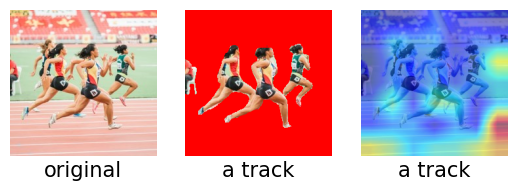

 41%|████████████████████████████████▏                                              | 11/27 [35:16<1:10:21, 263.85s/it]

Testing image 12
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a white car driving down a winding road



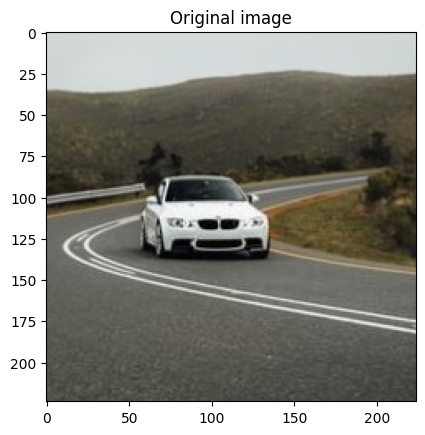

Queries: ['a winding road', 'a white car']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a winding road
Query dependency is: det compound pobj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (4.40377669999998 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 17%|██████████████                                                                      | 1/6 [00:00<00:01,  4.37it/s]

0.21532142 / 1



 33%|████████████████████████████                                                        | 2/6 [00:00<00:01,  3.48it/s]

0.23432693 / 1



 50%|██████████████████████████████████████████                                          | 3/6 [00:01<00:01,  2.70it/s]

0.2662429 / 1



 67%|████████████████████████████████████████████████████████                            | 4/6 [00:01<00:00,  2.18it/s]

0.22285245 / 1



 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:02<00:00,  1.92it/s]

0.26933122 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.10it/s]


0.27156997 / 1

measuring similarity score for 6 segments is done in 2.888790799999697 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.27156996726989746
Stage 1 is done in less than 1 min (2.9113013999999566 sec)!



4it [00:00, 255.94it/s]


stage 2 calculate_similarity_scores starts



 25%|█████████████████████                                                               | 1/4 [00:10<00:30, 10.24s/it]

0.5893654 / 1



 50%|██████████████████████████████████████████                                          | 2/4 [00:18<00:17,  8.97s/it]

0.21642405 / 1



 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:25<00:08,  8.04s/it]

0.55231565 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:34<00:00,  8.59s/it]

0.76888794 / 1

measuring similarity score for 4 segments is done in 34.381101599999965 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.7688879370689392
Stage 2 is done in less than 1 min (34.45012160000033 sec)!
Caption: a white car driving down a winding road
Query: a winding road
Answer similarity score: 0.7688879370689392


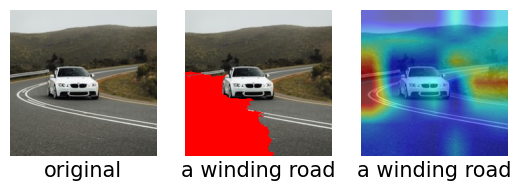

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a white car
Query dependency is: det amod ROOT
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0032870999998522166 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 17%|██████████████                                                                      | 1/6 [00:00<00:02,  1.82it/s]

0.3020134 / 0.06580835459183673



 33%|████████████████████████████                                                        | 2/6 [00:01<00:02,  1.88it/s]

0.25280544 / 0.006277901785714286



 50%|██████████████████████████████████████████                                          | 3/6 [00:01<00:01,  1.86it/s]

0.24331287 / 0.9279137436224489



 67%|████████████████████████████████████████████████████████                            | 4/6 [00:02<00:01,  1.87it/s]

0.30125642 / 0.07208625637755102



 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:02<00:00,  1.85it/s]

0.2593285 / 0.9937220982142857



100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:03<00:00,  1.85it/s]


0.24965575 / 0.9341916454081632

measuring similarity score for 6 segments is done in 3.27167210000016 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (3.2839270999998007 sec)!



4it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 25%|█████████████████████                                                               | 1/4 [00:10<00:30, 10.08s/it]

0.36850154 / 1



 50%|██████████████████████████████████████████                                          | 2/4 [00:17<00:17,  8.56s/it]

0.49406633 / 1



 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:25<00:08,  8.48s/it]

0.61947465 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:34<00:00,  8.54s/it]

0.76673555 / 1

measuring similarity score for 4 segments is done in 34.181572999999844 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.7667355537414551
Stage 2 is done in less than 1 min (34.239316099999996 sec)!
Caption: a white car driving down a winding road
Query: a white car
Answer similarity score: 1


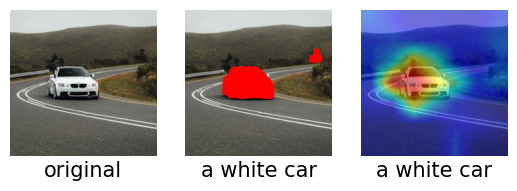

 44%|████████████████████████████████████                                             | 12/27 [37:35<56:30, 226.02s/it]

Testing image 13
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:two horses standing in the snow



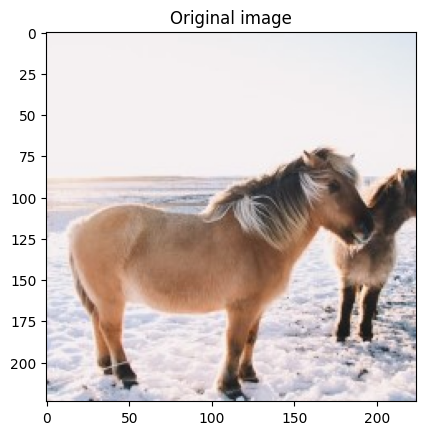

Queries: ['the snow', 'two horses']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is the snow
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (4.947622499999852 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  7%|█████▉                                                                             | 1/14 [00:00<00:03,  4.00it/s]

0.20004848 / 1



 14%|███████████▊                                                                       | 2/14 [00:00<00:03,  3.49it/s]

0.22746968 / 1



 21%|█████████████████▊                                                                 | 3/14 [00:01<00:04,  2.70it/s]

0.22847989 / 1



 29%|███████████████████████▋                                                           | 4/14 [00:01<00:04,  2.31it/s]

0.22903234 / 1



 36%|█████████████████████████████▋                                                     | 5/14 [00:02<00:04,  2.03it/s]

0.19984004 / 1



 43%|███████████████████████████████████▌                                               | 6/14 [00:02<00:04,  1.94it/s]

0.19976723 / 1



 50%|█████████████████████████████████████████▌                                         | 7/14 [00:03<00:03,  1.83it/s]

0.20593491 / 1



 57%|███████████████████████████████████████████████▍                                   | 8/14 [00:03<00:03,  1.75it/s]

0.22935796 / 1



 64%|█████████████████████████████████████████████████████▎                             | 9/14 [00:04<00:02,  1.80it/s]

0.22713797 / 1



 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [00:05<00:02,  1.76it/s]

0.22630307 / 1



 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [00:05<00:01,  1.72it/s]

0.19982111 / 1



 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [00:06<00:01,  1.68it/s]

0.20512143 / 1



 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [00:06<00:00,  1.71it/s]

0.20244393 / 1



100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:07<00:00,  1.90it/s]


0.22645381 / 1

measuring similarity score for 14 segments is done in 7.389645900000232 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.22935795783996582
Stage 1 is done in less than 1 min (7.400313599999663 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:09<00:09,  9.81s/it]

0.34179038 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:20<00:00, 10.45s/it]


0.34179038 / 1

measuring similarity score for 2 segments is done in 20.920912600000065 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.3417903780937195
Stage 2 is done in less than 1 min (20.967983900000036 sec)!
Caption: two horses standing in the snow
Query: the snow
Answer similarity score: 0.3417903780937195


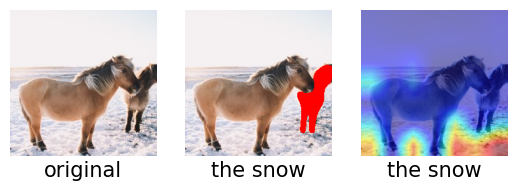

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is two horses
Query dependency is: nummod ROOT
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.003116899999895395 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  7%|█████▉                                                                             | 1/14 [00:00<00:07,  1.68it/s]

0.24597698 / 0.2508171237244898



 14%|███████████▊                                                                       | 2/14 [00:01<00:07,  1.63it/s]

0.273362 / 0.05000398596938776



 21%|█████████████████▊                                                                 | 3/14 [00:01<00:06,  1.60it/s]

0.28171036 / 0.05181760204081633



 29%|███████████████████████▋                                                           | 4/14 [00:02<00:06,  1.65it/s]

0.27241033 / 0.696906887755102



 36%|█████████████████████████████▋                                                     | 5/14 [00:02<00:05,  1.72it/s]

0.3034826 / 0.30082110969387754



 43%|███████████████████████████████████▌                                               | 6/14 [00:03<00:04,  1.77it/s]

0.30602816 / 0.30263472576530615



 50%|█████████████████████████████████████████▌                                         | 7/14 [00:04<00:03,  1.81it/s]

0.2914099 / 0.9477240114795918



 57%|███████████████████████████████████████████████▍                                   | 8/14 [00:04<00:03,  1.81it/s]

0.28095368 / 0.05227598852040816



 64%|█████████████████████████████████████████████████████▎                             | 9/14 [00:05<00:02,  1.85it/s]

0.25729147 / 0.7469108737244898



 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [00:05<00:02,  1.81it/s]

0.2648358 / 0.7487244897959183



 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [00:06<00:01,  1.79it/s]

0.3053537 / 0.30309311224489793



 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [00:06<00:01,  1.81it/s]

0.30084288 / 0.9977279974489796



 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [00:07<00:00,  1.82it/s]

0.29831704 / 0.9995416135204082



100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:07<00:00,  1.79it/s]


0.2648098 / 0.7491828762755102

measuring similarity score for 14 segments is done in 7.841928300000291 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (7.858862999999928 sec)!



2it [00:00, 127.95it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:09<00:09,  9.27s/it]

0.68141615 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:18<00:00,  9.11s/it]

0.68141615 / 1

measuring similarity score for 2 segments is done in 18.22601940000004 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.6814161539077759
Stage 2 is done in less than 1 min (18.270479799999976 sec)!
Caption: two horses standing in the snow
Query: two horses
Answer similarity score: 1


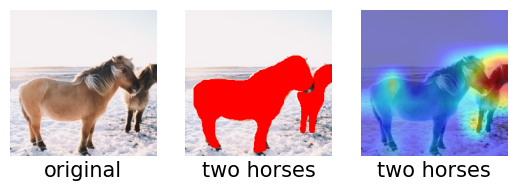

 48%|███████████████████████████████████████                                          | 13/27 [39:33<45:05, 193.23s/it]

Testing image 14
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a man sitting at a table with a laptop



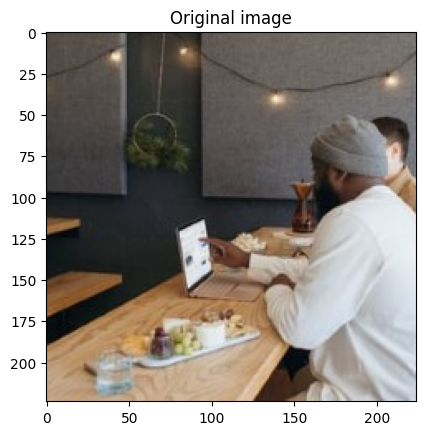

Queries: ['a laptop', 'a man', 'a table']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a laptop
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (4.588181099999929 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  3%|██▊                                                                                | 1/30 [00:00<00:08,  3.33it/s]

0.23152621 / 1



  7%|█████▌                                                                             | 2/30 [00:00<00:09,  2.99it/s]

0.26492158 / 1



 10%|████████▎                                                                          | 3/30 [00:01<00:10,  2.52it/s]

0.24314922 / 1



 13%|███████████                                                                        | 4/30 [00:01<00:11,  2.19it/s]

0.24224734 / 1



 17%|█████████████▊                                                                     | 5/30 [00:02<00:12,  2.00it/s]

0.23548229 / 1



 20%|████████████████▌                                                                  | 6/30 [00:02<00:13,  1.79it/s]

0.26634544 / 1



 23%|███████████████████▎                                                               | 7/30 [00:03<00:13,  1.72it/s]

0.23573858 / 1



 27%|██████████████████████▏                                                            | 8/30 [00:04<00:13,  1.66it/s]

0.25658086 / 1



 30%|████████████████████████▉                                                          | 9/30 [00:04<00:12,  1.70it/s]

0.23672235 / 1



 33%|███████████████████████████▎                                                      | 10/30 [00:05<00:11,  1.78it/s]

0.27231067 / 1



 37%|██████████████████████████████                                                    | 11/30 [00:05<00:10,  1.73it/s]

0.24381594 / 1



 40%|████████████████████████████████▊                                                 | 12/30 [00:06<00:10,  1.72it/s]

0.22568259 / 1



 43%|███████████████████████████████████▌                                              | 13/30 [00:07<00:09,  1.72it/s]

0.24623795 / 1



 47%|██████████████████████████████████████▎                                           | 14/30 [00:07<00:09,  1.71it/s]

0.22936353 / 1



 50%|█████████████████████████████████████████                                         | 15/30 [00:08<00:08,  1.76it/s]

0.2245513 / 1



 53%|███████████████████████████████████████████▋                                      | 16/30 [00:08<00:08,  1.75it/s]

0.27006483 / 1



 57%|██████████████████████████████████████████████▍                                   | 17/30 [00:09<00:07,  1.75it/s]

0.27453697 / 1



 60%|█████████████████████████████████████████████████▏                                | 18/30 [00:09<00:06,  1.73it/s]

0.23460627 / 1



 63%|███████████████████████████████████████████████████▉                              | 19/30 [00:10<00:06,  1.72it/s]

0.255149 / 1



 67%|██████████████████████████████████████████████████████▋                           | 20/30 [00:11<00:05,  1.76it/s]

0.23381835 / 1



 70%|█████████████████████████████████████████████████████████▍                        | 21/30 [00:11<00:04,  1.81it/s]

0.23104315 / 1



 73%|████████████████████████████████████████████████████████████▏                     | 22/30 [00:12<00:04,  1.81it/s]

0.2449435 / 1



 77%|██████████████████████████████████████████████████████████████▊                   | 23/30 [00:12<00:03,  1.76it/s]

0.22586462 / 1



 80%|█████████████████████████████████████████████████████████████████▌                | 24/30 [00:13<00:03,  1.78it/s]

0.21883367 / 1



 83%|████████████████████████████████████████████████████████████████████▎             | 25/30 [00:13<00:02,  1.75it/s]

0.22240794 / 1



 87%|███████████████████████████████████████████████████████████████████████           | 26/30 [00:14<00:02,  1.82it/s]

0.275106 / 1



 90%|█████████████████████████████████████████████████████████████████████████▊        | 27/30 [00:14<00:01,  1.82it/s]

0.2318308 / 1



 93%|████████████████████████████████████████████████████████████████████████████▌     | 28/30 [00:15<00:01,  1.76it/s]

0.22768684 / 1



 97%|███████████████████████████████████████████████████████████████████████████████▎  | 29/30 [00:16<00:00,  1.76it/s]

0.23353964 / 1



100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:16<00:00,  1.80it/s]


0.21823654 / 1

measuring similarity score for 30 segments is done in 16.6498217999997 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.2751060128211975
Stage 1 is done in less than 1 min (16.668144100000063 sec)!



2it [00:00, 128.00it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:12<00:12, 12.44s/it]

0.7145635 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:24<00:00, 12.24s/it]

0.7145635 / 1

measuring similarity score for 2 segments is done in 24.493361099999674 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.7145634889602661
Stage 2 is done in less than 1 min (24.540679400000045 sec)!
Caption: a man sitting at a table with a laptop
Query: a laptop
Answer similarity score: 0.7145634889602661


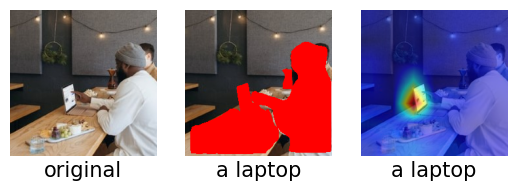

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a man
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0028848000001744367 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  3%|██▊                                                                                | 1/30 [00:00<00:15,  1.90it/s]

0.21999514 / 0.22953204719387754



  7%|█████▌                                                                             | 2/30 [00:01<00:14,  1.88it/s]

0.21496148 / 0.02491230867346939



 10%|████████▎                                                                          | 3/30 [00:01<00:14,  1.89it/s]

0.22078471 / 0.007932079081632654



 13%|███████████                                                                        | 4/30 [00:02<00:13,  1.88it/s]

0.21338947 / 0.14817841198979592



 17%|█████████████▊                                                                     | 5/30 [00:02<00:13,  1.83it/s]

0.23035908 / 0.593132174744898



 20%|████████████████▌                                                                  | 6/30 [00:03<00:13,  1.84it/s]

0.21405418 / 0.2542251275510204



 23%|███████████████████▎                                                               | 7/30 [00:04<00:14,  1.60it/s]

0.22859882 / 0.23744419642857142



 27%|██████████████████████▏                                                            | 8/30 [00:04<00:13,  1.62it/s]

0.22203434 / 0.37771045918367346



 30%|████████████████████████▉                                                          | 9/30 [00:05<00:12,  1.68it/s]

0.20602268 / 0.8226642219387755



 33%|███████████████████████████▎                                                      | 10/30 [00:05<00:11,  1.77it/s]

0.21676959 / 0.03284438775510204



 37%|██████████████████████████████                                                    | 11/30 [00:06<00:10,  1.81it/s]

0.21971413 / 0.16964285714285715



 40%|████████████████████████████████▊                                                 | 12/30 [00:06<00:10,  1.78it/s]

0.22400574 / 0.6180444834183674



 43%|███████████████████████████████████▌                                              | 13/30 [00:07<00:09,  1.71it/s]

0.21667142 / 0.15611049107142858



 47%|██████████████████████████████████████▎                                           | 14/30 [00:07<00:09,  1.72it/s]

0.22783263 / 0.6010642538265306



 50%|█████████████████████████████████████████                                         | 15/30 [00:08<00:08,  1.77it/s]

0.2228164 / 0.7413105867346939



 53%|███████████████████████████████████████████▋                                      | 16/30 [00:09<00:07,  1.85it/s]

0.2235411 / 0.2621372767857143



 57%|██████████████████████████████████████████████▍                                   | 17/30 [00:09<00:07,  1.85it/s]

0.21139657 / 0.39895567602040816



 60%|█████████████████████████████████████████████████▏                                | 18/30 [00:10<00:06,  1.80it/s]

0.20040463 / 0.8473573022959183



 63%|███████████████████████████████████████████████████▉                              | 19/30 [00:10<00:06,  1.82it/s]

0.2293085 / 0.3856226084183674



 67%|██████████████████████████████████████████████████████▋                           | 20/30 [00:11<00:05,  1.86it/s]

0.20933658 / 0.8305763711734694



 70%|█████████████████████████████████████████████████████████▍                        | 21/30 [00:11<00:04,  1.90it/s]

0.21604039 / 0.9708426339285714



 73%|████████████████████████████████████████████████████████████▏                     | 22/30 [00:12<00:04,  1.98it/s]

0.22132404 / 0.1775749362244898



 77%|██████████████████████████████████████████████████████████████▊                   | 23/30 [00:12<00:03,  1.94it/s]

0.22284615 / 0.6259765625



 80%|█████████████████████████████████████████████████████████████████▌                | 24/30 [00:13<00:03,  1.93it/s]

0.2203747 / 0.7627750318877551



 83%|████████████████████████████████████████████████████████████████████▎             | 25/30 [00:13<00:02,  1.91it/s]

0.22120662 / 0.7492426658163265



 87%|███████████████████████████████████████████████████████████████████████           | 26/30 [00:14<00:02,  1.93it/s]

0.221074 / 0.40686782525510207



 90%|█████████████████████████████████████████████████████████████████████████▊        | 27/30 [00:14<00:01,  1.89it/s]

0.20242953 / 0.8552694515306123



 93%|████████████████████████████████████████████████████████████████████████████▌     | 28/30 [00:15<00:01,  1.93it/s]

0.21109454 / 0.9920878507653061



 97%|███████████████████████████████████████████████████████████████████████████████▎  | 29/30 [00:15<00:00,  1.91it/s]

0.2176334 / 0.9787547831632653



100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:16<00:00,  1.83it/s]


0.2198253 / 0.7707071109693877

measuring similarity score for 30 segments is done in 16.392724100000123 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (16.40875330000017 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:10<00:10, 10.38s/it]

0.33649123 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:21<00:00, 10.99s/it]

0.33649123 / 1

measuring similarity score for 2 segments is done in 21.987667099999726 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.3364912271499634
Stage 2 is done in less than 1 min (22.036069899999802 sec)!
Caption: a man sitting at a table with a laptop
Query: a man
Answer similarity score: 1


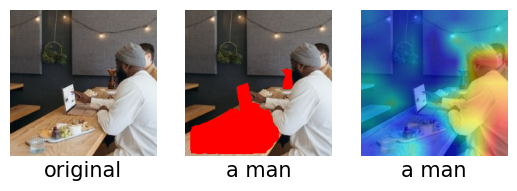

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a table
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.002442399999836198 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  3%|██▊                                                                                | 1/30 [00:00<00:13,  2.11it/s]

0.20540658 / 1



  7%|█████▌                                                                             | 2/30 [00:01<00:14,  1.95it/s]

0.23628104 / 1



 10%|████████▎                                                                          | 3/30 [00:01<00:13,  1.97it/s]

0.22322512 / 1



 13%|███████████                                                                        | 4/30 [00:02<00:13,  1.92it/s]

0.22064793 / 1



 17%|█████████████▊                                                                     | 5/30 [00:02<00:12,  1.94it/s]

0.24725604 / 1



 20%|████████████████▌                                                                  | 6/30 [00:03<00:12,  1.95it/s]

0.2157507 / 1



 23%|███████████████████▎                                                               | 7/30 [00:03<00:11,  1.96it/s]

0.21138535 / 1



 27%|██████████████████████▏                                                            | 8/30 [00:04<00:11,  1.94it/s]

0.22538078 / 1



 30%|████████████████████████▉                                                          | 9/30 [00:04<00:11,  1.90it/s]

0.23097141 / 1



 33%|███████████████████████████▎                                                      | 10/30 [00:05<00:10,  1.94it/s]

0.2500259 / 1



 37%|██████████████████████████████                                                    | 11/30 [00:05<00:10,  1.88it/s]

0.2333649 / 1



 40%|████████████████████████████████▊                                                 | 12/30 [00:06<00:09,  1.89it/s]

0.24263903 / 1



 43%|███████████████████████████████████▌                                              | 13/30 [00:06<00:09,  1.88it/s]

0.22474343 / 1



 47%|██████████████████████████████████████▎                                           | 14/30 [00:07<00:08,  1.91it/s]

0.24939112 / 1



 50%|█████████████████████████████████████████                                         | 15/30 [00:07<00:07,  1.91it/s]

0.2366699 / 1



 53%|███████████████████████████████████████████▋                                      | 16/30 [00:08<00:07,  1.91it/s]

0.2227723 / 1



 57%|██████████████████████████████████████████████▍                                   | 17/30 [00:08<00:06,  1.86it/s]

0.23318145 / 1



 60%|█████████████████████████████████████████████████▏                                | 18/30 [00:09<00:06,  1.83it/s]

0.22414681 / 1



 63%|███████████████████████████████████████████████████▉                              | 19/30 [00:09<00:05,  1.84it/s]

0.22774918 / 1



 67%|██████████████████████████████████████████████████████▋                           | 20/30 [00:10<00:05,  1.88it/s]

0.2373516 / 1



 70%|█████████████████████████████████████████████████████████▍                        | 21/30 [00:10<00:04,  1.92it/s]

0.2367815 / 1



 73%|████████████████████████████████████████████████████████████▏                     | 22/30 [00:11<00:04,  1.92it/s]

0.2402918 / 1



 77%|██████████████████████████████████████████████████████████████▊                   | 23/30 [00:12<00:03,  1.83it/s]

0.2485989 / 1



 80%|█████████████████████████████████████████████████████████████████▌                | 24/30 [00:12<00:03,  1.86it/s]

0.2324211 / 1



 83%|████████████████████████████████████████████████████████████████████▎             | 25/30 [00:13<00:02,  1.86it/s]

0.24155329 / 1



 87%|███████████████████████████████████████████████████████████████████████           | 26/30 [00:13<00:02,  1.91it/s]

0.23616913 / 1



 90%|█████████████████████████████████████████████████████████████████████████▊        | 27/30 [00:14<00:01,  1.89it/s]

0.2299912 / 1



 93%|████████████████████████████████████████████████████████████████████████████▌     | 28/30 [00:14<00:01,  1.80it/s]

0.22653209 / 1



 97%|███████████████████████████████████████████████████████████████████████████████▎  | 29/30 [00:15<00:00,  1.81it/s]

0.24036568 / 1



100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:15<00:00,  1.89it/s]


0.23815577 / 1

measuring similarity score for 30 segments is done in 15.919853600000351 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.2500258982181549
Stage 1 is done in less than 1 min (15.933797099999992 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:09<00:09,  9.03s/it]

0.34009185 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:17<00:00,  8.52s/it]

0.34009185 / 1

measuring similarity score for 2 segments is done in 17.05436819999977 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.34009185433387756
Stage 2 is done in less than 1 min (17.102684299999964 sec)!
Caption: a man sitting at a table with a laptop
Query: a table
Answer similarity score: 0.34009185433387756


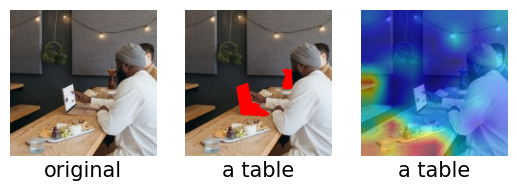

 52%|██████████████████████████████████████████                                       | 14/27 [42:37<41:17, 190.57s/it]

Testing image 15
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a man walking on the beach with a surfboard



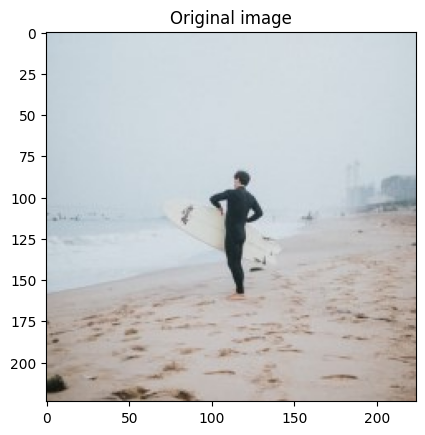

Queries: ['a man', 'the beach', 'a surfboard']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a man
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (4.416704900000241 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 17%|██████████████                                                                      | 1/6 [00:00<00:01,  3.98it/s]

0.23655435 / 0.018973214285714284



 33%|████████████████████████████                                                        | 2/6 [00:00<00:01,  2.98it/s]

0.21907462 / 0.015326052295918368



 50%|██████████████████████████████████████████                                          | 3/6 [00:01<00:01,  2.60it/s]

0.22721452 / 0.9653818558673469



 67%|████████████████████████████████████████████████████████                            | 4/6 [00:01<00:00,  2.22it/s]

0.23695068 / 0.034299266581632654



 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:02<00:00,  1.98it/s]

0.23783039 / 0.9843550701530612



100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.12it/s]


0.23781677 / 0.9807079081632653

measuring similarity score for 6 segments is done in 2.848994500000117 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (2.8622777999999016 sec)!



3it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:12<00:24, 12.26s/it]

0.46656626 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:26<00:13, 13.34s/it]

0.4385382 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:33<00:00, 11.29s/it]

0.32093626 / 1

measuring similarity score for 3 segments is done in 33.88556289999997 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.466566264629364
Stage 2 is done in less than 1 min (33.96032739999964 sec)!
Caption: a man walking on the beach with a surfboard
Query: a man
Answer similarity score: 1


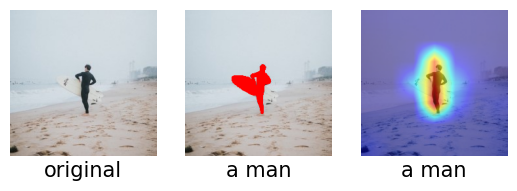

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is the beach
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.00253980000024967 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 17%|██████████████                                                                      | 1/6 [00:00<00:02,  1.88it/s]

0.20038044 / 1



 33%|████████████████████████████                                                        | 2/6 [00:01<00:02,  1.76it/s]

0.19973022 / 1



 50%|██████████████████████████████████████████                                          | 3/6 [00:01<00:01,  1.71it/s]

0.270158 / 1



 67%|████████████████████████████████████████████████████████                            | 4/6 [00:02<00:01,  1.77it/s]

0.21426485 / 1



 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:02<00:00,  1.72it/s]

0.26336795 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:03<00:00,  1.76it/s]


0.26850584 / 1

measuring similarity score for 6 segments is done in 3.430518199999824 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.27015799283981323
Stage 1 is done in less than 1 min (3.4557866000000104 sec)!



4it [00:00, 571.74it/s]


stage 2 calculate_similarity_scores starts



 25%|█████████████████████                                                               | 1/4 [00:10<00:31, 10.65s/it]

0.7574993 / 1



 50%|██████████████████████████████████████████                                          | 2/4 [00:23<00:23, 11.67s/it]

0.7763388 / 1



 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:35<00:12, 12.14s/it]

0.041744836 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:43<00:00, 10.88s/it]

0.64660084 / 1

measuring similarity score for 4 segments is done in 43.53151190000017 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.7763388156890869
Stage 2 is done in less than 1 min (43.589357199999995 sec)!
Caption: a man walking on the beach with a surfboard
Query: the beach
Answer similarity score: 0.7763388156890869


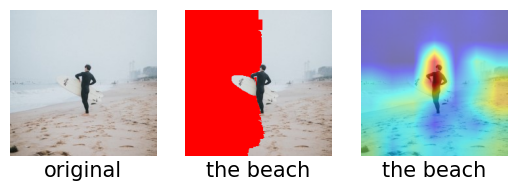

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a surfboard
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0023811999999452382 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 17%|██████████████                                                                      | 1/6 [00:00<00:02,  1.77it/s]

0.23844653 / 1



 33%|████████████████████████████                                                        | 2/6 [00:01<00:02,  1.81it/s]

0.23874567 / 1



 50%|██████████████████████████████████████████                                          | 3/6 [00:01<00:01,  1.86it/s]

0.24793756 / 1



 67%|████████████████████████████████████████████████████████                            | 4/6 [00:02<00:01,  1.90it/s]

0.2604608 / 1



 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:02<00:00,  1.81it/s]

0.2803186 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:03<00:00,  1.81it/s]


0.2553937 / 1

measuring similarity score for 6 segments is done in 3.3399930000000495 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.28031858801841736
Stage 1 is done in less than 1 min (3.3650958999996874 sec)!



4it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 25%|█████████████████████                                                               | 1/4 [00:11<00:33, 11.12s/it]

0.60555124 / 1



 50%|██████████████████████████████████████████                                          | 2/4 [00:23<00:23, 11.99s/it]

0.69981754 / 1



 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:31<00:10, 10.17s/it]

0.3751135 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:39<00:00,  9.82s/it]

0.60129714 / 1

measuring similarity score for 4 segments is done in 39.281522700000096 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.6998175382614136
Stage 2 is done in less than 1 min (39.34444880000001 sec)!
Caption: a man walking on the beach with a surfboard
Query: a surfboard
Answer similarity score: 0.6998175382614136


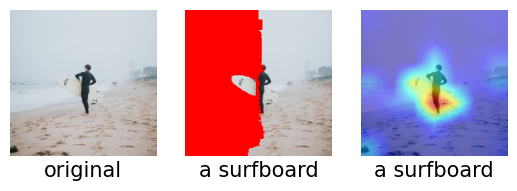

 56%|█████████████████████████████████████████████                                    | 15/27 [46:05<39:09, 195.76s/it]

Testing image 16
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a bird sitting on a branch in the snow



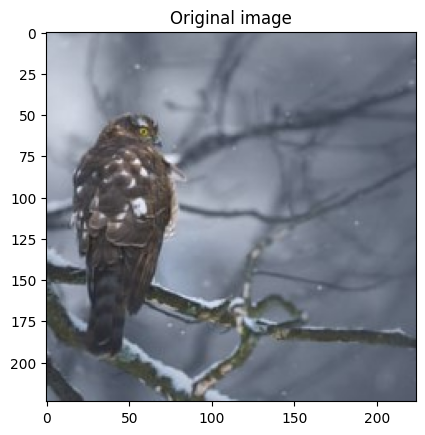

Queries: ['the snow', 'a bird', 'a branch']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is the snow
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (4.585202400000071 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  4.24it/s]

0.23260312 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  3.64it/s]


0.2268493 / 1

measuring similarity score for 2 segments is done in 0.5601884000002428 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.23260311782360077
Stage 1 is done in less than 1 min (0.5703158000001167 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:09<00:09,  9.61s/it]

0.18979983 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:17<00:00,  8.84s/it]

0.18979983 / 1

measuring similarity score for 2 segments is done in 17.68994630000043 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.18979983031749725
Stage 2 is done in less than 1 min (17.722316200000023 sec)!
Caption: a bird sitting on a branch in the snow
Query: the snow
Answer similarity score: 0.23260311782360077


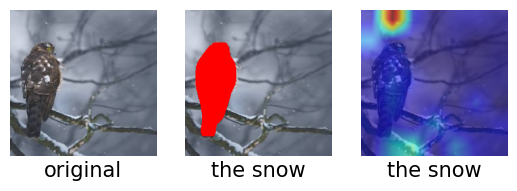

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a bird
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0030371000002560322 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  1.88it/s]

0.28508943 / 0.12396364795918367



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.85it/s]


0.2522815 / 0.8760363520408163

measuring similarity score for 2 segments is done in 1.0946711000001415 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (1.1089987999998812 sec)!



2it [00:00, 500.90it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:09<00:09,  9.20s/it]

0.5053376 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:19<00:00,  9.96s/it]

0.5053376 / 1

measuring similarity score for 2 segments is done in 19.955265800000234 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.5053375959396362
Stage 2 is done in less than 1 min (20.00778470000023 sec)!
Caption: a bird sitting on a branch in the snow
Query: a bird
Answer similarity score: 1


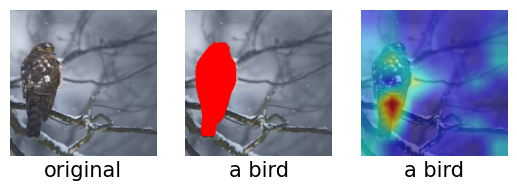

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a branch
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.00358139999980267 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  1.61it/s]

0.2333428 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.59it/s]


0.25029156 / 1

measuring similarity score for 2 segments is done in 1.2773381999995763 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.2502915561199188
Stage 1 is done in less than 1 min (1.301282099999753 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:10<00:10, 10.10s/it]

0.44920546 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:18<00:00,  9.49s/it]

0.44920546 / 1

measuring similarity score for 2 segments is done in 18.988931500000035 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.4492054581642151
Stage 2 is done in less than 1 min (19.044154100000014 sec)!
Caption: a bird sitting on a branch in the snow
Query: a branch
Answer similarity score: 0.4492054581642151


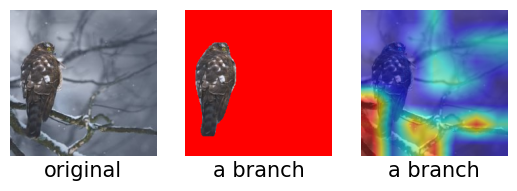

 59%|████████████████████████████████████████████████                                 | 16/27 [48:23<32:41, 178.33s/it]

Testing image 17
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a woman holding a pink cup



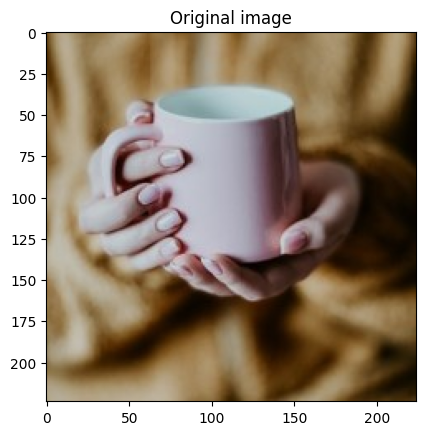

Queries: ['a pink cup', 'a woman']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a pink cup
Query dependency is: det amod dobj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (4.792634299999918 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 17%|██████████████                                                                      | 1/6 [00:00<00:01,  4.92it/s]

0.2894973 / 0.15718670280612246



 33%|████████████████████████████                                                        | 2/6 [00:00<00:00,  4.15it/s]

0.20639294 / 0.5918566645408163



 50%|██████████████████████████████████████████                                          | 3/6 [00:00<00:00,  3.30it/s]

0.18766323 / 0.2664421237244898



 67%|████████████████████████████████████████████████████████                            | 4/6 [00:01<00:00,  2.76it/s]

0.28170416 / 0.7335578762755102



 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:01<00:00,  2.27it/s]

0.28839388 / 0.42362882653061223



100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:02<00:00,  2.44it/s]


0.26192755 / 0.8582987882653061

measuring similarity score for 6 segments is done in 2.4761751999999433 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (2.4874181000000135 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:10<00:10, 10.05s/it]

0.6217774 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:19<00:00,  9.94s/it]

0.6217774 / 1

measuring similarity score for 2 segments is done in 19.913099899999906 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.6217774152755737
Stage 2 is done in less than 1 min (19.97169840000015 sec)!
Caption: a woman holding a pink cup
Query: a pink cup
Answer similarity score: 1


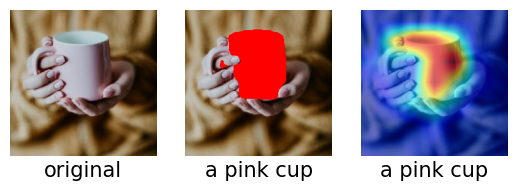

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a woman
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.003214000000298256 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 17%|██████████████                                                                      | 1/6 [00:00<00:02,  1.81it/s]

0.20549451 / 0.15718670280612246



 33%|████████████████████████████                                                        | 2/6 [00:01<00:02,  1.89it/s]

0.20799457 / 0.5918566645408163



 50%|██████████████████████████████████████████                                          | 3/6 [00:01<00:01,  1.88it/s]

0.19631243 / 0.2664421237244898



 67%|████████████████████████████████████████████████████████                            | 4/6 [00:02<00:01,  1.86it/s]

0.21013027 / 0.7335578762755102



 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:02<00:00,  1.86it/s]

0.21446599 / 0.42362882653061223



100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:03<00:00,  1.88it/s]


0.20220627 / 0.8582987882653061

measuring similarity score for 6 segments is done in 3.2257606999996824 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (3.2374555999999757 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:09<00:09,  9.59s/it]

0.29286027 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:17<00:00,  8.77s/it]

0.29286027 / 1

measuring similarity score for 2 segments is done in 17.542987000000267 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.2928602695465088
Stage 2 is done in less than 1 min (17.586791500000345 sec)!
Caption: a woman holding a pink cup
Query: a woman
Answer similarity score: 1


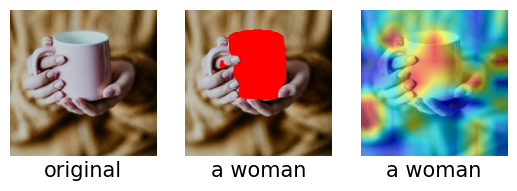

 63%|███████████████████████████████████████████████████                              | 17/27 [50:16<26:26, 158.64s/it]

Testing image 18
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a squirrel sitting on the ground



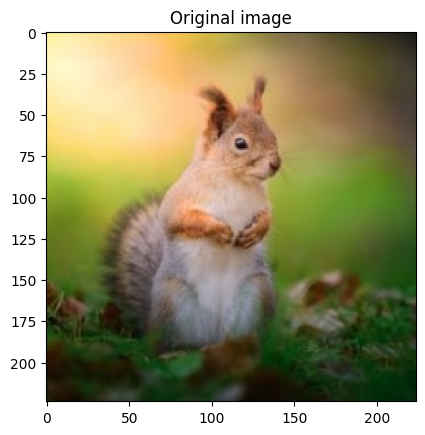

Queries: ['a squirrel', 'the ground']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a squirrel
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (4.5568404000000555 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  3.76it/s]

0.2625893 / 0.23929767219387754



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  2.93it/s]


0.27315032 / 0.7607023278061225

measuring similarity score for 2 segments is done in 0.6975561999997808 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (0.7089479999999639 sec)!



4it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 25%|█████████████████████                                                               | 1/4 [00:10<00:30, 10.00s/it]

0.72898865 / 1



 50%|██████████████████████████████████████████                                          | 2/4 [00:19<00:18,  9.44s/it]

0.21612269 / 1



 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:26<00:08,  8.70s/it]

0.743644 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:35<00:00,  8.95s/it]

0.30723476 / 1

measuring similarity score for 4 segments is done in 35.8305905000002 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.7436439990997314
Stage 2 is done in less than 1 min (35.88413660000015 sec)!
Caption: a squirrel sitting on the ground
Query: a squirrel
Answer similarity score: 1


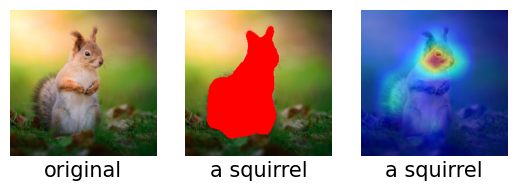

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is the ground
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.002892599999995582 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  1.88it/s]

0.20655376 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.82it/s]


0.2451029 / 1

measuring similarity score for 2 segments is done in 1.1093172000000777 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.2451028972864151
Stage 1 is done in less than 1 min (1.1273502000003646 sec)!



4it [00:00, 4999.17it/s]


stage 2 calculate_similarity_scores starts



 25%|█████████████████████                                                               | 1/4 [00:08<00:26,  8.86s/it]

0.31712008 / 1



 50%|██████████████████████████████████████████                                          | 2/4 [00:17<00:17,  8.93s/it]

0.3721257 / 1



 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:27<00:09,  9.40s/it]

0.5938147 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:36<00:00,  9.04s/it]

0.40784588 / 1

measuring similarity score for 4 segments is done in 36.179424200000085 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.5938146710395813
Stage 2 is done in less than 1 min (36.23375950000036 sec)!
Caption: a squirrel sitting on the ground
Query: the ground
Answer similarity score: 0.5938146710395813


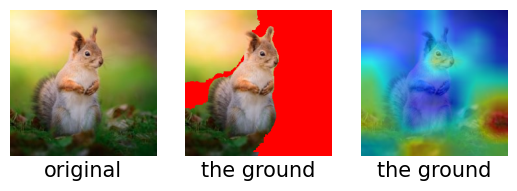

 67%|██████████████████████████████████████████████████████                           | 18/27 [52:34<22:51, 152.35s/it]

Testing image 19
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a man walking on the side of a road



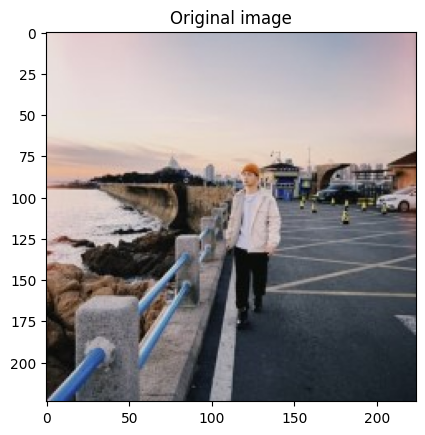

Queries: ['a road', 'the side', 'a man']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a road
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (5.094700799999828 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  7%|█████▉                                                                             | 1/14 [00:00<00:03,  3.36it/s]

0.23640938 / 1



 14%|███████████▊                                                                       | 2/14 [00:00<00:05,  2.40it/s]

0.23141475 / 1



 21%|█████████████████▊                                                                 | 3/14 [00:01<00:05,  2.13it/s]

0.22809915 / 1



 29%|███████████████████████▋                                                           | 4/14 [00:01<00:05,  1.88it/s]

0.23512772 / 1



 36%|█████████████████████████████▋                                                     | 5/14 [00:02<00:05,  1.68it/s]

0.23577799 / 1



 43%|███████████████████████████████████▌                                               | 6/14 [00:03<00:04,  1.65it/s]

0.22996645 / 1



 50%|█████████████████████████████████████████▌                                         | 7/14 [00:03<00:04,  1.67it/s]

0.23330498 / 1



 57%|███████████████████████████████████████████████▍                                   | 8/14 [00:04<00:03,  1.70it/s]

0.22763786 / 1



 64%|█████████████████████████████████████████████████████▎                             | 9/14 [00:05<00:03,  1.66it/s]

0.24127157 / 1



 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [00:05<00:02,  1.66it/s]

0.24161477 / 1



 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [00:06<00:01,  1.69it/s]

0.22978075 / 1



 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [00:06<00:01,  1.71it/s]

0.23394617 / 1



 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [00:07<00:00,  1.77it/s]

0.23454149 / 1



100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:07<00:00,  1.77it/s]


0.24134058 / 1

measuring similarity score for 14 segments is done in 7.934853600000224 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.24161477386951447
Stage 1 is done in less than 1 min (7.956538799999635 sec)!



3it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:12<00:25, 12.88s/it]

0.48857594 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:23<00:11, 11.55s/it]

0.22224367 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:32<00:00, 10.88s/it]

0.48857594 / 1

measuring similarity score for 3 segments is done in 32.654493099999854 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.48857593536376953
Stage 2 is done in less than 1 min (32.71273530000008 sec)!
Caption: a man walking on the side of a road
Query: a road
Answer similarity score: 0.48857593536376953


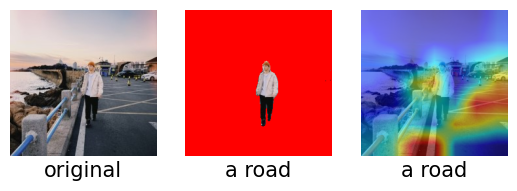

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is the side
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0026137999998354644 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  7%|█████▉                                                                             | 1/14 [00:00<00:06,  2.05it/s]

0.20853834 / 1



 14%|███████████▊                                                                       | 2/14 [00:01<00:06,  1.98it/s]

0.2199275 / 1



 21%|█████████████████▊                                                                 | 3/14 [00:01<00:05,  1.96it/s]

0.22052464 / 1



 29%|███████████████████████▋                                                           | 4/14 [00:02<00:05,  1.90it/s]

0.2190887 / 1



 36%|█████████████████████████████▋                                                     | 5/14 [00:02<00:04,  1.85it/s]

0.20311402 / 1



 43%|███████████████████████████████████▌                                               | 6/14 [00:03<00:04,  1.86it/s]

0.20220616 / 1



 50%|█████████████████████████████████████████▌                                         | 7/14 [00:03<00:03,  1.78it/s]

0.21155629 / 1



 57%|███████████████████████████████████████████████▍                                   | 8/14 [00:04<00:03,  1.86it/s]

0.22044554 / 1



 64%|█████████████████████████████████████████████████████▎                             | 9/14 [00:04<00:02,  1.88it/s]

0.22131146 / 1



 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [00:05<00:02,  1.87it/s]

0.22131248 / 1



 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [00:05<00:01,  1.85it/s]

0.20193417 / 1



 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [00:06<00:01,  1.81it/s]

0.21245572 / 1



 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [00:06<00:00,  1.85it/s]

0.21240526 / 1



100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:07<00:00,  1.88it/s]


0.22113246 / 1

measuring similarity score for 14 segments is done in 7.47627889999967 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.2213124781847
Stage 1 is done in less than 1 min (7.500583099999858 sec)!



3it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:10<00:21, 10.87s/it]

0.301148 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:21<00:10, 10.81s/it]

0.13562015 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:32<00:00, 10.71s/it]

0.301148 / 1

measuring similarity score for 3 segments is done in 32.15617939999993 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.301147997379303
Stage 2 is done in less than 1 min (32.20397260000027 sec)!
Caption: a man walking on the side of a road
Query: the side
Answer similarity score: 0.301147997379303


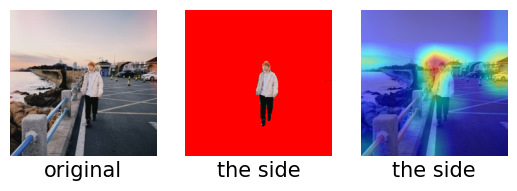

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a man
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.003003800000442425 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  7%|█████▉                                                                             | 1/14 [00:00<00:07,  1.77it/s]

0.2338082 / 0.039720184948979595



 14%|███████████▊                                                                       | 2/14 [00:01<00:06,  1.77it/s]

0.21854296 / 0.005341198979591837



 21%|█████████████████▊                                                                 | 3/14 [00:01<00:06,  1.82it/s]

0.2187789 / 0.005560427295918368



 29%|███████████████████████▋                                                           | 4/14 [00:02<00:05,  1.82it/s]

0.17867687 / 0.9546595982142857



 36%|█████████████████████████████▋                                                     | 5/14 [00:02<00:04,  1.80it/s]

0.22893316 / 0.04506138392857143



 43%|███████████████████████████████████▌                                               | 6/14 [00:03<00:04,  1.79it/s]

0.22820981 / 0.04528061224489796



 50%|█████████████████████████████████████████▌                                         | 7/14 [00:03<00:03,  1.80it/s]

0.20738496 / 0.9943797831632653



 57%|███████████████████████████████████████████████▍                                   | 8/14 [00:04<00:03,  1.88it/s]

0.22089566 / 0.005620216836734694



 64%|█████████████████████████████████████████████████████▎                             | 9/14 [00:04<00:02,  1.79it/s]

0.18230666 / 0.9600007971938775



 71%|██████████████████████████████████████████████████████████▌                       | 10/14 [00:05<00:02,  1.73it/s]

0.18254432 / 0.9602200255102041



 79%|████████████████████████████████████████████████████████████████▍                 | 11/14 [00:06<00:01,  1.76it/s]

0.22774702 / 0.04534040178571429



 86%|██████████████████████████████████████████████████████████████████████▎           | 12/14 [00:06<00:01,  1.84it/s]

0.20910041 / 0.9997209821428571



 93%|████████████████████████████████████████████████████████████████████████████▏     | 13/14 [00:07<00:00,  1.83it/s]

0.20939413 / 0.9999402104591837



100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:07<00:00,  1.81it/s]


0.18225667 / 0.9602798150510204

measuring similarity score for 14 segments is done in 7.7547803000002204 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (7.768987200000083 sec)!



3it [00:00, 3258.13it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:09<00:18,  9.22s/it]

0.64927137 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:18<00:09,  9.41s/it]

0.2837484 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:31<00:00, 10.50s/it]

0.36796668 / 1

measuring similarity score for 3 segments is done in 31.51288939999995 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.6492713689804077
Stage 2 is done in less than 1 min (31.56566980000025 sec)!
Caption: a man walking on the side of a road
Query: a man
Answer similarity score: 1


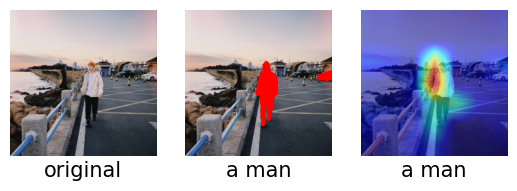

 70%|█████████████████████████████████████████████████████████                        | 19/27 [55:59<22:25, 168.19s/it]

Testing image 20
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a butterfly on a flower



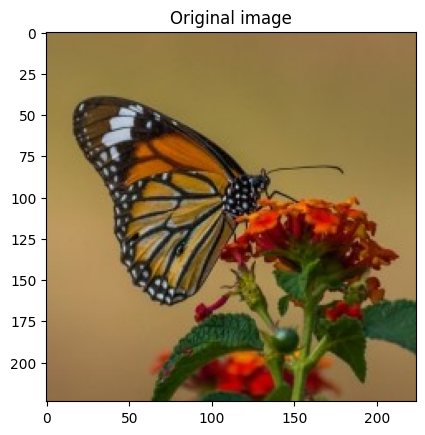

Queries: ['a butterfly', 'a flower']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a butterfly
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (4.062201800000366 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  0%|                                                                                            | 0/2 [00:00<?, ?it/s]

0.28830826 / 0.16978236607142858



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  4.40it/s]


0.28332874 / 0.8262914540816326

measuring similarity score for 2 segments is done in 0.4590978000001087 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (0.4666072999998505 sec)!



3it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:07<00:14,  7.32s/it]

0.71635914 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:15<00:07,  7.70s/it]

0.81177604 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:22<00:00,  7.61s/it]

0.72625303 / 1

measuring similarity score for 3 segments is done in 22.845401499999753 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.8117760419845581
Stage 2 is done in less than 1 min (22.874713599999723 sec)!
Caption: a butterfly on a flower
Query: a butterfly
Answer similarity score: 1


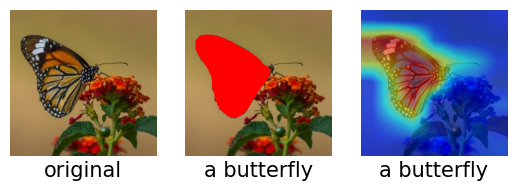

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a flower
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.001143099999808328 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  3.46it/s]

0.24840873 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  3.35it/s]


0.23041345 / 1

measuring similarity score for 2 segments is done in 0.6011008999998921 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.2484087347984314
Stage 1 is done in less than 1 min (0.607943499999692 sec)!



3it [00:00, 1485.94it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:06<00:12,  6.26s/it]

0.29839623 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:14<00:07,  7.20s/it]

0.44616967 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:19<00:00,  6.34s/it]

0.31097347 / 1

measuring similarity score for 3 segments is done in 19.02712870000005 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.4461696743965149
Stage 2 is done in less than 1 min (19.056893100000252 sec)!
Caption: a butterfly on a flower
Query: a flower
Answer similarity score: 0.4461696743965149


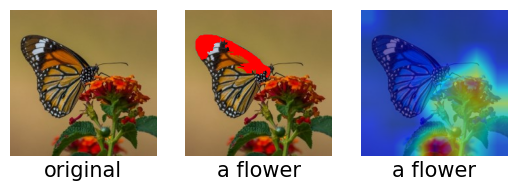

 74%|██████████████████████████████████████████████████████████▌                    | 20/27 [1:05:45<34:15, 293.66s/it]

Testing image 21
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a bird sitting on a branch



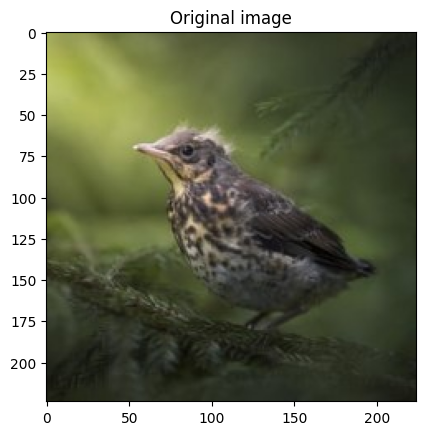

Queries: ['a bird', 'a branch']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a bird
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (2.33881029999975 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  6.73it/s]

0.2984748 / 0.16972257653061223



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  6.58it/s]


0.2616465 / 0.8302774234693877

measuring similarity score for 2 segments is done in 0.31998969999995097 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (0.3228733999999349 sec)!



3it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:05<00:11,  5.84s/it]

0.6274198 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:10<00:05,  5.40s/it]

0.73087347 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:16<00:00,  5.46s/it]

0.6274198 / 1

measuring similarity score for 3 segments is done in 16.39099249999981 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.7308734655380249
Stage 2 is done in less than 1 min (16.411009999999806 sec)!
Caption: a bird sitting on a branch
Query: a bird
Answer similarity score: 1


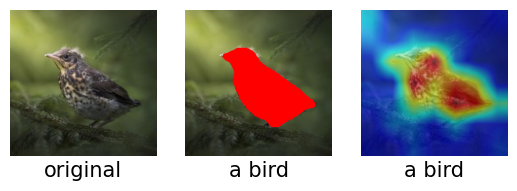

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a branch
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0021452999999382882 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  3.61it/s]

0.22875291 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  3.14it/s]


0.23355499 / 1

measuring similarity score for 2 segments is done in 0.6502790999998069 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.23355498909950256
Stage 1 is done in less than 1 min (0.6654493000000912 sec)!



3it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:06<00:12,  6.33s/it]

0.5656214 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:12<00:06,  6.32s/it]

0.39598134 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:18<00:00,  6.11s/it]

0.68658894 / 1

measuring similarity score for 3 segments is done in 18.32627289999982 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.6865889430046082
Stage 2 is done in less than 1 min (18.358540400000038 sec)!
Caption: a bird sitting on a branch
Query: a branch
Answer similarity score: 0.6865889430046082


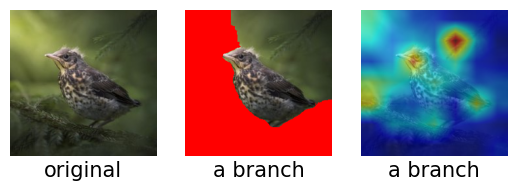

 78%|█████████████████████████████████████████████████████████████▍                 | 21/27 [1:06:57<22:43, 227.30s/it]

Testing image 22
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a man sitting at a desk with a laptop



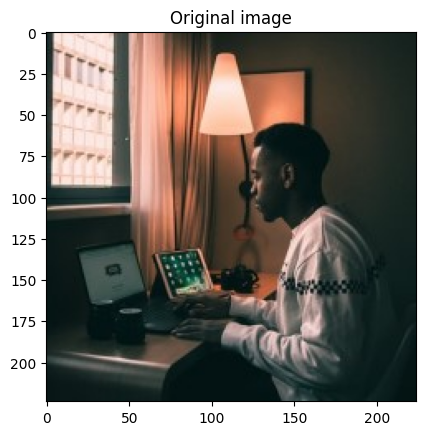

Queries: ['a desk', 'a man', 'a laptop']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a desk
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (3.6443441000001258 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  3%|██▊                                                                                | 1/30 [00:00<00:13,  2.11it/s]

0.23687233 / 1



  7%|█████▌                                                                             | 2/30 [00:01<00:16,  1.68it/s]

0.2577464 / 1



 10%|████████▎                                                                          | 3/30 [00:01<00:17,  1.58it/s]

0.24025685 / 1



 13%|███████████                                                                        | 4/30 [00:02<00:16,  1.55it/s]

0.2305244 / 1



 17%|█████████████▊                                                                     | 5/30 [00:03<00:15,  1.57it/s]

0.24094225 / 1



 20%|████████████████▌                                                                  | 6/30 [00:03<00:15,  1.51it/s]

0.25836253 / 1



 23%|███████████████████▎                                                               | 7/30 [00:04<00:15,  1.52it/s]

0.23921669 / 1



 27%|██████████████████████▏                                                            | 8/30 [00:05<00:15,  1.46it/s]

0.2379706 / 1



 30%|████████████████████████▉                                                          | 9/30 [00:05<00:14,  1.47it/s]

0.2532651 / 1



 33%|███████████████████████████▎                                                      | 10/30 [00:06<00:13,  1.49it/s]

0.2618129 / 1



 37%|██████████████████████████████                                                    | 11/30 [00:07<00:12,  1.56it/s]

0.25421065 / 1



 40%|████████████████████████████████▊                                                 | 12/30 [00:07<00:11,  1.58it/s]

0.244928 / 1



 43%|███████████████████████████████████▌                                              | 13/30 [00:08<00:11,  1.52it/s]

0.22830327 / 1



 47%|██████████████████████████████████████▎                                           | 14/30 [00:09<00:10,  1.49it/s]

0.23815933 / 1



 50%|█████████████████████████████████████████                                         | 15/30 [00:09<00:09,  1.61it/s]

0.24255818 / 1



 53%|███████████████████████████████████████████▋                                      | 16/30 [00:10<00:07,  1.84it/s]

0.26224068 / 1



 57%|██████████████████████████████████████████████▍                                   | 17/30 [00:10<00:06,  1.97it/s]

0.25953832 / 1



 60%|█████████████████████████████████████████████████▏                                | 18/30 [00:10<00:05,  2.01it/s]

0.25558317 / 1



 63%|███████████████████████████████████████████████████▉                              | 19/30 [00:11<00:05,  2.09it/s]

0.23898342 / 1



 67%|██████████████████████████████████████████████████████▋                           | 20/30 [00:11<00:04,  2.16it/s]

0.24914396 / 1



 70%|█████████████████████████████████████████████████████████▍                        | 21/30 [00:12<00:04,  2.07it/s]

0.25281098 / 1



 73%|████████████████████████████████████████████████████████████▏                     | 22/30 [00:12<00:03,  2.13it/s]

0.2606795 / 1



 77%|██████████████████████████████████████████████████████████████▊                   | 23/30 [00:13<00:03,  2.23it/s]

0.24950849 / 1



 80%|█████████████████████████████████████████████████████████████████▌                | 24/30 [00:13<00:02,  2.17it/s]

0.24553466 / 1



 83%|████████████████████████████████████████████████████████████████████▎             | 25/30 [00:14<00:02,  2.22it/s]

0.23966137 / 1



 87%|███████████████████████████████████████████████████████████████████████           | 26/30 [00:14<00:01,  2.26it/s]

0.26089317 / 1



 90%|█████████████████████████████████████████████████████████████████████████▊        | 27/30 [00:14<00:01,  2.15it/s]

0.25531077 / 1



 93%|████████████████████████████████████████████████████████████████████████████▌     | 28/30 [00:15<00:00,  2.21it/s]

0.25819895 / 1



 97%|███████████████████████████████████████████████████████████████████████████████▎  | 29/30 [00:15<00:00,  2.25it/s]

0.24904197 / 1



100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:16<00:00,  1.84it/s]


0.2487986 / 1

measuring similarity score for 30 segments is done in 16.280083900000136 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.2622406780719757
Stage 1 is done in less than 1 min (16.293858799999725 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:07<00:07,  7.49s/it]

0.6498782 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:14<00:00,  7.19s/it]

0.6498782 / 1

measuring similarity score for 2 segments is done in 14.390461799999684 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.649878203868866
Stage 2 is done in less than 1 min (14.42689369999971 sec)!
Caption: a man sitting at a desk with a laptop
Query: a desk
Answer similarity score: 0.649878203868866


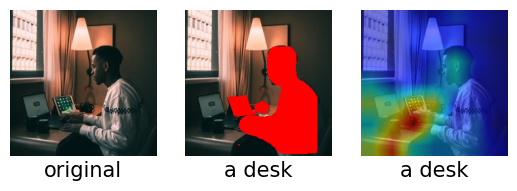

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a man
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.002492099999471975 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  3%|██▊                                                                                | 1/30 [00:00<00:15,  1.88it/s]

0.2417923 / 0.2139269770408163



  7%|█████▌                                                                             | 2/30 [00:01<00:15,  1.76it/s]

0.21551202 / 0.0185546875



 10%|████████▎                                                                          | 3/30 [00:01<00:17,  1.52it/s]

0.21343648 / 0.0064572704081632655



 13%|███████████                                                                        | 4/30 [00:02<00:17,  1.48it/s]

0.21144333 / 0.007393973214285714



 17%|█████████████▊                                                                     | 5/30 [00:03<00:16,  1.52it/s]

0.22249144 / 0.7536670918367347



 20%|████████████████▌                                                                  | 6/30 [00:03<00:16,  1.44it/s]

0.24027205 / 0.2324816645408163



 23%|███████████████████▎                                                               | 7/30 [00:04<00:14,  1.60it/s]

0.24166082 / 0.22038424744897958



 27%|██████████████████████▏                                                            | 8/30 [00:04<00:12,  1.70it/s]

0.23917376 / 0.22132095025510204



 30%|████████████████████████▉                                                          | 9/30 [00:05<00:11,  1.79it/s]

0.23716505 / 0.9675940688775511



 33%|███████████████████████████▎                                                      | 10/30 [00:06<00:11,  1.80it/s]

0.21100006 / 0.025011957908163265



 37%|██████████████████████████████                                                    | 11/30 [00:06<00:11,  1.65it/s]

0.21235617 / 0.025948660714285716



 40%|████████████████████████████████▊                                                 | 12/30 [00:07<00:12,  1.46it/s]

0.21347705 / 0.7722217793367347



 43%|███████████████████████████████████▌                                              | 13/30 [00:08<00:11,  1.46it/s]

0.205831 / 0.01385124362244898



 47%|██████████████████████████████████████▎                                           | 14/30 [00:08<00:10,  1.51it/s]

0.22104402 / 0.760124362244898



 50%|█████████████████████████████████████████                                         | 15/30 [00:09<00:10,  1.42it/s]

0.22295722 / 0.7610610650510204



 53%|███████████████████████████████████████████▋                                      | 16/30 [00:10<00:09,  1.49it/s]

0.24405059 / 0.23893893494897958



 57%|██████████████████████████████████████████████▍                                   | 17/30 [00:10<00:08,  1.53it/s]

0.23850779 / 0.23987563775510204



 60%|█████████████████████████████████████████████████▏                                | 18/30 [00:11<00:08,  1.48it/s]

0.23382802 / 0.9861487563775511



 63%|███████████████████████████████████████████████████▉                              | 19/30 [00:12<00:07,  1.48it/s]

0.23905131 / 0.2277782206632653



 67%|██████████████████████████████████████████████████████▋                           | 20/30 [00:13<00:07,  1.35it/s]

0.23105094 / 0.9740513392857143



 70%|█████████████████████████████████████████████████████████▍                        | 21/30 [00:14<00:07,  1.24it/s]

0.23622648 / 0.9749880420918368



 73%|████████████████████████████████████████████████████████████▏                     | 22/30 [00:15<00:07,  1.13it/s]

0.21069318 / 0.03240593112244898



 77%|██████████████████████████████████████████████████████████████▊                   | 23/30 [00:16<00:06,  1.16it/s]

0.21880119 / 0.778679049744898



 80%|█████████████████████████████████████████████████████████████████▌                | 24/30 [00:16<00:04,  1.31it/s]

0.21277796 / 0.7796157525510204



 83%|████████████████████████████████████████████████████████████████████▎             | 25/30 [00:17<00:04,  1.22it/s]

0.22093403 / 0.7675183354591837



 87%|███████████████████████████████████████████████████████████████████████           | 26/30 [00:18<00:03,  1.19it/s]

0.24155235 / 0.2463329081632653



 90%|█████████████████████████████████████████████████████████████████████████▊        | 27/30 [00:19<00:02,  1.22it/s]

0.23371619 / 0.9926060267857143



 93%|████████████████████████████████████████████████████████████████████████████▌     | 28/30 [00:19<00:01,  1.22it/s]

0.23482025 / 0.9935427295918368



 97%|███████████████████████████████████████████████████████████████████████████████▎  | 29/30 [00:20<00:00,  1.23it/s]

0.230728 / 0.9814453125



100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:21<00:00,  1.40it/s]


0.21685453 / 0.7860730229591837

measuring similarity score for 30 segments is done in 21.505541800000174 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (21.528896599999825 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:17<00:17, 17.67s/it]

0.400159 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:29<00:00, 14.51s/it]


0.400159 / 1

measuring similarity score for 2 segments is done in 29.04932380000082 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.40015900135040283
Stage 2 is done in less than 1 min (29.108185500000218 sec)!
Caption: a man sitting at a desk with a laptop
Query: a man
Answer similarity score: 1


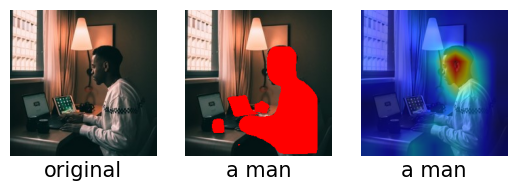

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a laptop
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.00468899999941641 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  3%|██▊                                                                                | 1/30 [00:00<00:19,  1.46it/s]

0.24716973 / 1



  7%|█████▌                                                                             | 2/30 [00:01<00:18,  1.49it/s]

0.26893353 / 1



 10%|████████▎                                                                          | 3/30 [00:01<00:17,  1.53it/s]

0.23918274 / 1



 13%|███████████                                                                        | 4/30 [00:02<00:17,  1.53it/s]

0.2274878 / 1



 17%|█████████████▊                                                                     | 5/30 [00:03<00:15,  1.58it/s]

0.26154867 / 1



 20%|████████████████▌                                                                  | 6/30 [00:03<00:14,  1.67it/s]

0.2843172 / 1



 23%|███████████████████▎                                                               | 7/30 [00:04<00:16,  1.36it/s]

0.24922182 / 1



 27%|██████████████████████▏                                                            | 8/30 [00:05<00:15,  1.41it/s]

0.245799 / 1



 30%|████████████████████████▉                                                          | 9/30 [00:06<00:15,  1.36it/s]

0.27070704 / 1



 33%|███████████████████████████▎                                                      | 10/30 [00:06<00:14,  1.40it/s]

0.253202 / 1



 37%|██████████████████████████████                                                    | 11/30 [00:07<00:13,  1.39it/s]

0.2550003 / 1



 40%|████████████████████████████████▊                                                 | 12/30 [00:08<00:12,  1.45it/s]

0.2627502 / 1



 43%|███████████████████████████████████▌                                              | 13/30 [00:08<00:10,  1.55it/s]

0.22066022 / 1



 47%|██████████████████████████████████████▎                                           | 14/30 [00:09<00:10,  1.59it/s]

0.2565853 / 1



 50%|█████████████████████████████████████████                                         | 15/30 [00:10<00:09,  1.59it/s]

0.26370874 / 1



 53%|███████████████████████████████████████████▋                                      | 16/30 [00:10<00:09,  1.45it/s]

0.28179193 / 1



 57%|██████████████████████████████████████████████▍                                   | 17/30 [00:13<00:16,  1.25s/it]

0.28044212 / 1



 60%|█████████████████████████████████████████████████▏                                | 18/30 [00:14<00:14,  1.18s/it]

0.2736897 / 1



 63%|███████████████████████████████████████████████████▉                              | 19/30 [00:15<00:12,  1.11s/it]

0.24700192 / 1



 67%|██████████████████████████████████████████████████████▋                           | 20/30 [00:16<00:10,  1.05s/it]

0.27193737 / 1



 70%|█████████████████████████████████████████████████████████▍                        | 21/30 [00:17<00:08,  1.01it/s]

0.27262425 / 1



 73%|████████████████████████████████████████████████████████████▏                     | 22/30 [00:17<00:07,  1.05it/s]

0.25077507 / 1



 77%|██████████████████████████████████████████████████████████████▊                   | 23/30 [00:18<00:06,  1.05it/s]

0.26536626 / 1



 80%|█████████████████████████████████████████████████████████████████▌                | 24/30 [00:20<00:06,  1.11s/it]

0.26400435 / 1



 83%|████████████████████████████████████████████████████████████████████▎             | 25/30 [00:23<00:07,  1.56s/it]

0.258056 / 1



 87%|███████████████████████████████████████████████████████████████████████           | 26/30 [00:24<00:06,  1.63s/it]

0.27670887 / 1



 90%|█████████████████████████████████████████████████████████████████████████▊        | 27/30 [00:25<00:04,  1.48s/it]

0.27525002 / 1



 93%|████████████████████████████████████████████████████████████████████████████▌     | 28/30 [00:27<00:02,  1.40s/it]

0.27674457 / 1



 97%|███████████████████████████████████████████████████████████████████████████████▎  | 29/30 [00:28<00:01,  1.34s/it]

0.27307817 / 1



100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:29<00:00,  1.02it/s]


0.26476645 / 1

measuring similarity score for 30 segments is done in 29.31481789999998 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.2843171954154968
Stage 1 is done in less than 1 min (29.337278400000287 sec)!



2it [00:00, 241.57it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:16<00:16, 16.19s/it]

0.754773 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:25<00:00, 12.51s/it]

0.754773 / 1

measuring similarity score for 2 segments is done in 25.04392700000062 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.7547730207443237
Stage 2 is done in less than 1 min (25.120853000000352 sec)!
Caption: a man sitting at a desk with a laptop
Query: a laptop
Answer similarity score: 0.7547730207443237


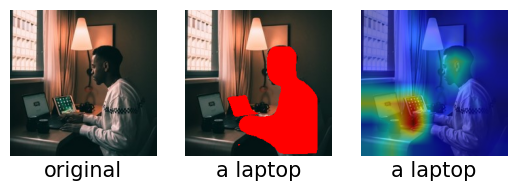

 81%|████████████████████████████████████████████████████████████████▎              | 22/27 [1:10:25<18:27, 221.52s/it]

Testing image 23
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a butterfly is flying over some purple flowers



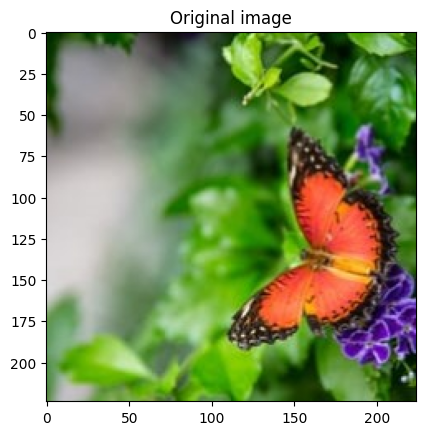

Queries: ['some purple flowers', 'a butterfly']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is some purple flowers
Query dependency is: det amod pobj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (6.966506300000219 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  1.38it/s]

0.22090025 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.22it/s]


0.23390028 / 1

measuring similarity score for 2 segments is done in 1.657180399999561 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.2339002788066864
Stage 1 is done in less than 1 min (1.6897199000004548 sec)!



2it [00:00, 419.62it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:13<00:13, 13.99s/it]

0.6763163 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:26<00:00, 13.18s/it]

0.6763163 / 1

measuring similarity score for 2 segments is done in 26.41626390000056 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.6763163208961487
Stage 2 is done in less than 1 min (26.514012199999343 sec)!
Caption: a butterfly is flying over some purple flowers
Query: some purple flowers
Answer similarity score: 0.6763163208961487


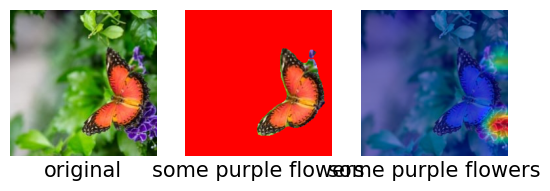

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a butterfly
Query dependency is: det nsubj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0029881999998906394 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  1.43it/s]

0.30980706 / 0.14622528698979592



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.38it/s]


0.21029079 / 0.8537747130102041

measuring similarity score for 2 segments is done in 1.4812746999996307 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (1.4981002000004082 sec)!



2it [00:00, 128.02it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:11<00:11, 11.38s/it]

0.7858696 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:22<00:00, 11.05s/it]

0.7858696 / 1

measuring similarity score for 2 segments is done in 22.13063449999936 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.7858695983886719
Stage 2 is done in less than 1 min (22.177124900000308 sec)!
Caption: a butterfly is flying over some purple flowers
Query: a butterfly
Answer similarity score: 1


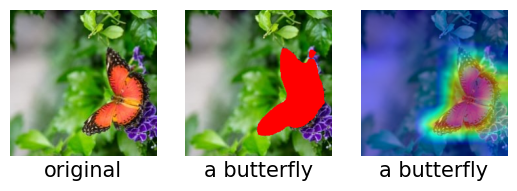

 85%|███████████████████████████████████████████████████████████████████▎           | 23/27 [1:12:37<12:57, 194.48s/it]

Testing image 24
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:the sun is shining over the cracked land



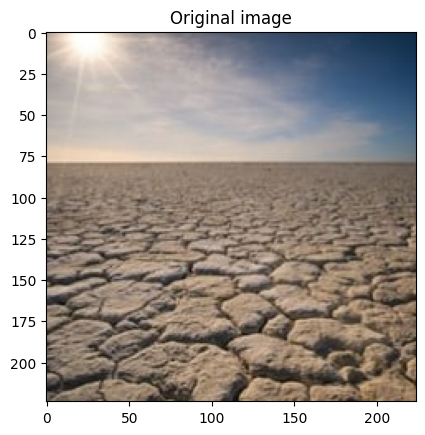

Queries: ['the sun', 'the cracked land']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is the sun
Query dependency is: det nsubj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (4.135406800000055 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.73it/s]


0.22271018 / 1.0

measuring similarity score for 1 segments is done in 0.284617100000105 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.22271017730236053
Stage 1 is done in less than 1 min (0.2993002000002889 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:10<00:10, 10.69s/it]

0.7631494 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:21<00:00, 10.92s/it]

0.7631494 / 1

measuring similarity score for 2 segments is done in 21.83263110000007 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.7631493806838989
Stage 2 is done in less than 1 min (21.876218899999913 sec)!
Caption: the sun is shining over the cracked land
Query: the sun
Answer similarity score: 0.7631493806838989


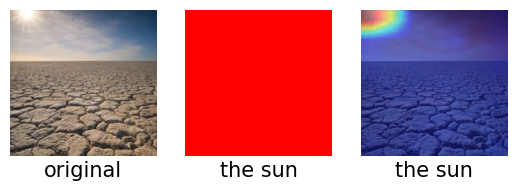

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is the cracked land
Query dependency is: det amod pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0027638999999908265 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.73it/s]


0.25883466 / 1

measuring similarity score for 1 segments is done in 0.5911781000004339 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.2588346600532532
Stage 1 is done in less than 1 min (0.6140365999999631 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:09<00:09,  9.77s/it]

0.44705707 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:17<00:00,  8.96s/it]

0.44705707 / 1

measuring similarity score for 2 segments is done in 17.929541499999686 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.4470570683479309
Stage 2 is done in less than 1 min (17.98015789999954 sec)!
Caption: the sun is shining over the cracked land
Query: the cracked land
Answer similarity score: 0.4470570683479309


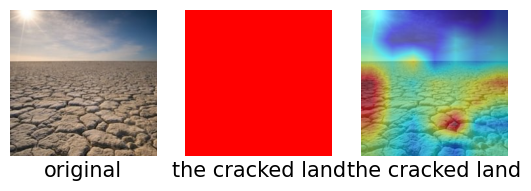

 89%|██████████████████████████████████████████████████████████████████████▏        | 24/27 [1:14:29<08:29, 169.90s/it]

Testing image 25
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a cat is sitting in a wooden box



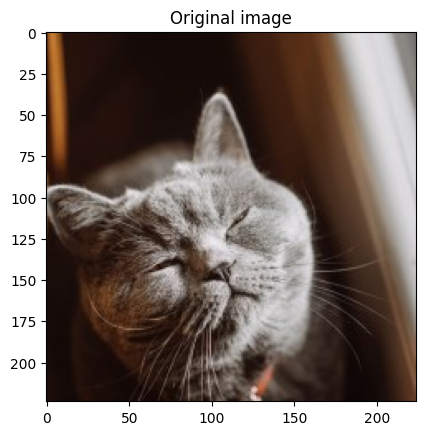

Queries: ['a cat', 'a wooden box']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a cat
Query dependency is: det nsubj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (5.280115700000351 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  1.88it/s]

0.27726528 / 0.4122688137755102



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.36it/s]


0.27610305 / 0.5877311862244898

measuring similarity score for 2 segments is done in 1.4897782999996707 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.6725351790400776
Stage 1 is done in less than 1 min (1.512973900000361 sec)!



2it [00:00, 252.02it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:14<00:14, 14.12s/it]

0.92527044 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:25<00:00, 12.80s/it]

0.92527044 / 1

measuring similarity score for 2 segments is done in 25.635574599999927 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.9252704381942749
Stage 2 is done in less than 1 min (25.719686000000365 sec)!
Caption: a cat is sitting in a wooden box
Query: a cat
Answer similarity score: 0.9252704381942749


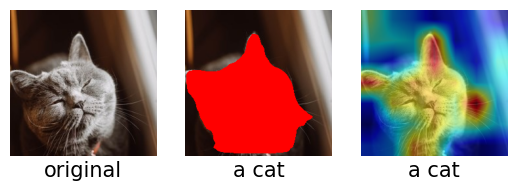

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a wooden box
Query dependency is: det amod pobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0024346000000150525 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:00<00:00,  2.00it/s]

0.18903096 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.93it/s]


0.1931243 / 1

measuring similarity score for 2 segments is done in 1.0488385999997263 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.19312429428100586
Stage 1 is done in less than 1 min (1.068824200000563 sec)!



2it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:09<00:09,  9.79s/it]

0.27102187 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:17<00:00,  8.97s/it]

0.27102187 / 1

measuring similarity score for 2 segments is done in 17.953920700000708 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.27102187275886536
Stage 2 is done in less than 1 min (18.006911200000104 sec)!
Caption: a cat is sitting in a wooden box
Query: a wooden box
Answer similarity score: 0.27102187275886536


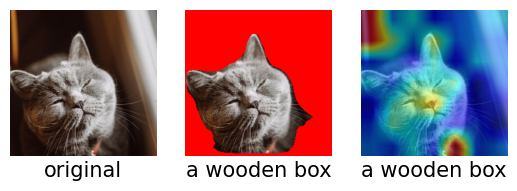

 93%|█████████████████████████████████████████████████████████████████████████▏     | 25/27 [1:16:18<05:03, 151.62s/it]

Testing image 26
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a man walking down a street next to a train



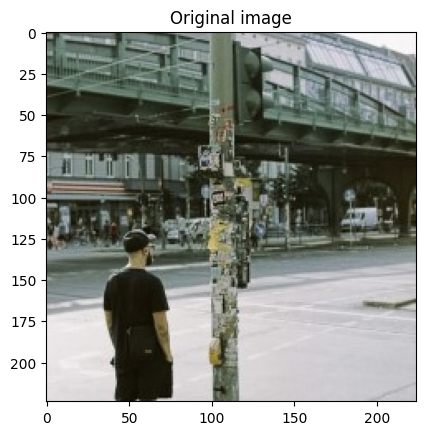

Queries: ['a train', 'a man', 'a street next']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a train
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (7.916336399999636 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  3%|██▊                                                                                | 1/30 [00:00<00:16,  1.71it/s]

0.23716265 / 1



  7%|█████▌                                                                             | 2/30 [00:01<00:17,  1.60it/s]

0.23738669 / 1



 10%|████████▎                                                                          | 3/30 [00:02<00:19,  1.41it/s]

0.2465713 / 1



 13%|███████████                                                                        | 4/30 [00:02<00:18,  1.40it/s]

0.24359404 / 1



 17%|█████████████▊                                                                     | 5/30 [00:03<00:16,  1.48it/s]

0.24150486 / 1



 20%|████████████████▌                                                                  | 6/30 [00:04<00:17,  1.38it/s]

0.22804758 / 1



 23%|███████████████████▎                                                               | 7/30 [00:04<00:15,  1.45it/s]

0.23474936 / 1



 27%|██████████████████████▏                                                            | 8/30 [00:05<00:15,  1.41it/s]

0.23229732 / 1



 30%|████████████████████████▉                                                          | 9/30 [00:06<00:16,  1.27it/s]

0.23050381 / 1



 33%|███████████████████████████▎                                                      | 10/30 [00:07<00:16,  1.24it/s]

0.23628598 / 1



 37%|██████████████████████████████                                                    | 11/30 [00:08<00:15,  1.20it/s]

0.23538075 / 1



 40%|████████████████████████████████▊                                                 | 12/30 [00:09<00:15,  1.18it/s]

0.23999305 / 1



 43%|███████████████████████████████████▌                                              | 13/30 [00:09<00:14,  1.18it/s]

0.2399409 / 1



 47%|██████████████████████████████████████▎                                           | 14/30 [00:10<00:13,  1.18it/s]

0.24340892 / 1



 50%|█████████████████████████████████████████                                         | 15/30 [00:11<00:12,  1.18it/s]

0.23755051 / 1



 53%|███████████████████████████████████████████▋                                      | 16/30 [00:12<00:11,  1.19it/s]

0.22920911 / 1



 57%|██████████████████████████████████████████████▍                                   | 17/30 [00:13<00:11,  1.17it/s]

0.22553647 / 1



 60%|█████████████████████████████████████████████████▏                                | 18/30 [00:14<00:10,  1.20it/s]

0.2327528 / 1



 63%|███████████████████████████████████████████████████▉                              | 19/30 [00:15<00:09,  1.20it/s]

0.22921151 / 1



 67%|██████████████████████████████████████████████████████▋                           | 20/30 [00:15<00:08,  1.19it/s]

0.23198882 / 1



 70%|█████████████████████████████████████████████████████████▍                        | 21/30 [00:16<00:07,  1.20it/s]

0.2220091 / 1



 73%|████████████████████████████████████████████████████████████▏                     | 22/30 [00:17<00:07,  1.12it/s]

0.23346306 / 1



 77%|██████████████████████████████████████████████████████████████▊                   | 23/30 [00:18<00:06,  1.09it/s]

0.24261689 / 1



 80%|█████████████████████████████████████████████████████████████████▌                | 24/30 [00:19<00:05,  1.08it/s]

0.23522729 / 1



 83%|████████████████████████████████████████████████████████████████████▎             | 25/30 [00:20<00:04,  1.00it/s]

0.2391083 / 1



 87%|███████████████████████████████████████████████████████████████████████           | 26/30 [00:21<00:04,  1.05s/it]

0.22568716 / 1



 90%|█████████████████████████████████████████████████████████████████████████▊        | 27/30 [00:23<00:03,  1.11s/it]

0.23411186 / 1



 93%|████████████████████████████████████████████████████████████████████████████▌     | 28/30 [00:24<00:02,  1.14s/it]

0.22326401 / 1



 97%|███████████████████████████████████████████████████████████████████████████████▎  | 29/30 [00:25<00:01,  1.08s/it]

0.22304659 / 1



100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:26<00:00,  1.14it/s]


0.23759902 / 1

measuring similarity score for 30 segments is done in 26.297726199999488 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.24657130241394043
Stage 1 is done in less than 1 min (26.31796579999991 sec)!



2it [00:00, 199.06it/s]


stage 2 calculate_similarity_scores starts



 50%|██████████████████████████████████████████                                          | 1/2 [00:11<00:11, 11.67s/it]

0.38105655 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:20<00:00, 10.19s/it]

0.38105655 / 1

measuring similarity score for 2 segments is done in 20.414423700000043 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.381056547164917
Stage 2 is done in less than 1 min (20.48600439999973 sec)!
Caption: a man walking down a street next to a train
Query: a train
Answer similarity score: 0.381056547164917


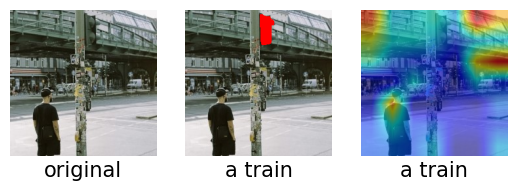

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a man
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.003766899999391171 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  3%|██▊                                                                                | 1/30 [00:00<00:26,  1.09it/s]

0.22874817 / 0.06002869897959184



  7%|█████▌                                                                             | 2/30 [00:01<00:25,  1.11it/s]

0.2212031 / 0.006198182397959184



 10%|████████▎                                                                          | 3/30 [00:02<00:22,  1.21it/s]

0.21962538 / 0.015784438775510203



 13%|███████████                                                                        | 4/30 [00:03<00:22,  1.18it/s]

0.2165058 / 0.005699936224489796



 17%|█████████████▊                                                                     | 5/30 [00:04<00:21,  1.18it/s]

0.22222255 / 0.9113321109693877



 20%|████████████████▌                                                                  | 6/30 [00:05<00:19,  1.24it/s]

0.2193054 / 0.06622688137755102



 23%|███████████████████▎                                                               | 7/30 [00:05<00:19,  1.21it/s]

0.22878347 / 0.07581313775510204



 27%|██████████████████████▏                                                            | 8/30 [00:06<00:18,  1.19it/s]

0.21809785 / 0.06572863520408163



 30%|████████████████████████▉                                                          | 9/30 [00:07<00:17,  1.18it/s]

0.20284042 / 0.9713608099489796



 33%|███████████████████████████▎                                                      | 10/30 [00:08<00:16,  1.18it/s]

0.22024539 / 0.02198262117346939



 37%|██████████████████████████████                                                    | 11/30 [00:09<00:15,  1.20it/s]

0.21335077 / 0.01189811862244898



 40%|████████████████████████████████▊                                                 | 12/30 [00:10<00:15,  1.20it/s]

0.21708106 / 0.9175302933673469



 43%|███████████████████████████████████▌                                              | 13/30 [00:10<00:14,  1.21it/s]

0.21130164 / 0.021484375



 47%|██████████████████████████████████████▎                                           | 14/30 [00:11<00:13,  1.17it/s]

0.22396187 / 0.927116549744898



 50%|█████████████████████████████████████████                                         | 15/30 [00:12<00:12,  1.19it/s]

0.22214158 / 0.9170320471938775



 53%|███████████████████████████████████████████▋                                      | 16/30 [00:13<00:11,  1.22it/s]

0.22020832 / 0.08201132015306123



 57%|██████████████████████████████████████████████▍                                   | 17/30 [00:14<00:10,  1.19it/s]

0.21501018 / 0.07192681760204081



 60%|█████████████████████████████████████████████████▏                                | 18/30 [00:14<00:09,  1.30it/s]

0.20109102 / 0.9775589923469388



 63%|███████████████████████████████████████████████████▉                              | 19/30 [00:15<00:07,  1.44it/s]

0.2217718 / 0.08151307397959184



 67%|██████████████████████████████████████████████████████▋                           | 20/30 [00:15<00:06,  1.56it/s]

0.20488839 / 0.9871452487244898



 70%|█████████████████████████████████████████████████████████▍                        | 21/30 [00:16<00:05,  1.66it/s]

0.20222954 / 0.9770607461734694



 73%|████████████████████████████████████████████████████████████▏                     | 22/30 [00:17<00:04,  1.67it/s]

0.215767 / 0.027682557397959183



 77%|██████████████████████████████████████████████████████████████▊                   | 23/30 [00:17<00:04,  1.67it/s]

0.21868402 / 0.9333147321428571



 80%|█████████████████████████████████████████████████████████████████▌                | 24/30 [00:18<00:03,  1.73it/s]

0.21647266 / 0.9232302295918368



 83%|████████████████████████████████████████████████████████████████████▎             | 25/30 [00:18<00:03,  1.62it/s]

0.22365634 / 0.9328164859693877



 87%|███████████████████████████████████████████████████████████████████████           | 26/30 [00:19<00:02,  1.64it/s]

0.219929 / 0.08771125637755102



 90%|█████████████████████████████████████████████████████████████████████████▊        | 27/30 [00:19<00:01,  1.70it/s]

0.2024979 / 0.9933434311224489



 93%|████████████████████████████████████████████████████████████████████████████▌     | 28/30 [00:20<00:01,  1.72it/s]

0.2003106 / 0.9832589285714286



 97%|███████████████████████████████████████████████████████████████████████████████▎  | 29/30 [00:21<00:00,  1.74it/s]

0.20407107 / 0.9928451849489796



100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:21<00:00,  1.38it/s]


0.21789142 / 0.9390146683673469

measuring similarity score for 30 segments is done in 21.766440899999907 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (21.78289120000045 sec)!



3it [00:00, 500.79it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:10<00:20, 10.29s/it]

0.5859366 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:20<00:09,  9.97s/it]

0.22636108 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:27<00:00,  9.28s/it]

0.26594293 / 1

measuring similarity score for 3 segments is done in 27.854123699999946 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.5859366059303284
Stage 2 is done in less than 1 min (27.91814239999985 sec)!
Caption: a man walking down a street next to a train
Query: a man
Answer similarity score: 1


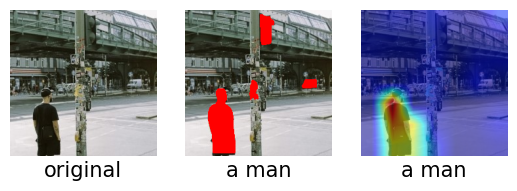

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a street next
Query dependency is: det pobj advmod
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.003847200000564044 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



  3%|██▊                                                                                | 1/30 [00:00<00:23,  1.23it/s]

0.23374547 / 1



  7%|█████▌                                                                             | 2/30 [00:01<00:18,  1.50it/s]

0.21409577 / 1



 10%|████████▎                                                                          | 3/30 [00:01<00:16,  1.61it/s]

0.22019593 / 1



 13%|███████████                                                                        | 4/30 [00:02<00:15,  1.66it/s]

0.20832331 / 1



 17%|█████████████▊                                                                     | 5/30 [00:03<00:14,  1.71it/s]

0.24916579 / 1



 20%|████████████████▌                                                                  | 6/30 [00:03<00:13,  1.75it/s]

0.22627556 / 1



 23%|███████████████████▎                                                               | 7/30 [00:04<00:13,  1.73it/s]

0.23441103 / 1



 27%|██████████████████████▏                                                            | 8/30 [00:04<00:13,  1.66it/s]

0.22677572 / 1



 30%|████████████████████████▉                                                          | 9/30 [00:05<00:13,  1.61it/s]

0.23779534 / 1



 33%|███████████████████████████▎                                                      | 10/30 [00:06<00:12,  1.56it/s]

0.21727268 / 1



 37%|██████████████████████████████                                                    | 11/30 [00:06<00:11,  1.62it/s]

0.21255411 / 1



 40%|████████████████████████████████▊                                                 | 12/30 [00:07<00:11,  1.60it/s]

0.2456719 / 1



 43%|███████████████████████████████████▌                                              | 13/30 [00:08<00:11,  1.50it/s]

0.21852382 / 1



 47%|██████████████████████████████████████▎                                           | 14/30 [00:08<00:10,  1.52it/s]

0.24545689 / 1



 50%|█████████████████████████████████████████                                         | 15/30 [00:09<00:10,  1.42it/s]

0.2503295 / 1



 53%|███████████████████████████████████████████▋                                      | 16/30 [00:10<00:09,  1.49it/s]

0.2298599 / 1



 57%|██████████████████████████████████████████████▍                                   | 17/30 [00:10<00:08,  1.59it/s]

0.22188099 / 1



 60%|█████████████████████████████████████████████████▏                                | 18/30 [00:11<00:07,  1.66it/s]

0.23556946 / 1



 63%|███████████████████████████████████████████████████▉                              | 19/30 [00:11<00:06,  1.72it/s]

0.22819132 / 1



 67%|██████████████████████████████████████████████████████▋                           | 20/30 [00:12<00:05,  1.75it/s]

0.23534566 / 1



 70%|█████████████████████████████████████████████████████████▍                        | 21/30 [00:12<00:05,  1.76it/s]

0.23660275 / 1



 73%|████████████████████████████████████████████████████████████▏                     | 22/30 [00:13<00:04,  1.69it/s]

0.21548042 / 1



 77%|██████████████████████████████████████████████████████████████▊                   | 23/30 [00:14<00:03,  1.76it/s]

0.2426803 / 1



 80%|█████████████████████████████████████████████████████████████████▌                | 24/30 [00:14<00:03,  1.76it/s]

0.245994 / 1



 83%|████████████████████████████████████████████████████████████████████▎             | 25/30 [00:15<00:02,  1.84it/s]

0.24597616 / 1



 87%|███████████████████████████████████████████████████████████████████████           | 26/30 [00:15<00:02,  1.79it/s]

0.22486779 / 1



 90%|█████████████████████████████████████████████████████████████████████████▊        | 27/30 [00:16<00:01,  1.82it/s]

0.2323885 / 1



 93%|████████████████████████████████████████████████████████████████████████████▌     | 28/30 [00:16<00:01,  1.83it/s]

0.23380269 / 1



 97%|███████████████████████████████████████████████████████████████████████████████▎  | 29/30 [00:17<00:00,  1.83it/s]

0.23354547 / 1



100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:17<00:00,  1.68it/s]


0.24234578 / 1

measuring similarity score for 30 segments is done in 17.881310300000223 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.25032949447631836
Stage 1 is done in less than 1 min (17.901481099999728 sec)!



4it [00:00, ?it/s]


stage 2 calculate_similarity_scores starts



 25%|█████████████████████                                                               | 1/4 [00:10<00:32, 10.78s/it]

0.63315237 / 1



 50%|██████████████████████████████████████████                                          | 2/4 [00:20<00:20, 10.37s/it]

0.27127802 / 1



 75%|███████████████████████████████████████████████████████████████                     | 3/4 [00:31<00:10, 10.47s/it]

0.24379529 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:43<00:00, 10.78s/it]

0.28761432 / 1

measuring similarity score for 4 segments is done in 43.13110619999952 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.6331523656845093
Stage 2 is done in less than 1 min (43.18440760000067 sec)!
Caption: a man walking down a street next to a train
Query: a street next
Answer similarity score: 0.6331523656845093


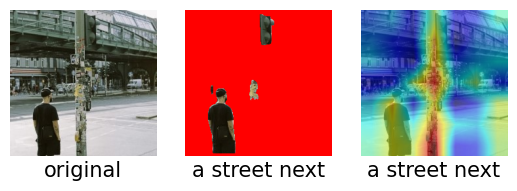

 96%|████████████████████████████████████████████████████████████████████████████   | 26/27 [1:20:56<03:09, 189.41s/it]

Testing image 27
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120

Original caption:a man carrying a child through a forest



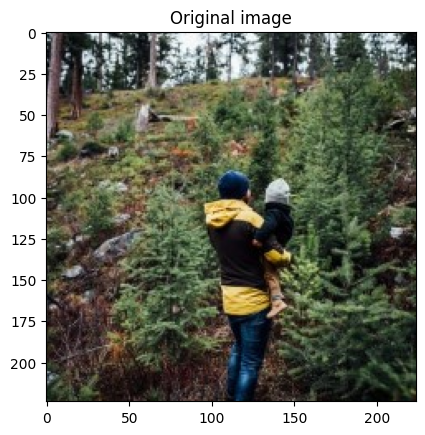

Queries: ['a forest', 'a child', 'a man']
Low-level segmentation segments are NOT available!
Low-level segmentation segments are READY!
Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a forest
Query dependency is: det pobj
Query accepted!
Generating segments!
Instance segmentation segments are NOT available!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (10.052425899999434 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 17%|██████████████                                                                      | 1/6 [00:00<00:01,  2.52it/s]

0.2147963 / 1



 33%|████████████████████████████                                                        | 2/6 [00:00<00:01,  2.19it/s]

0.2231004 / 1



 50%|██████████████████████████████████████████                                          | 3/6 [00:01<00:01,  2.02it/s]

0.23884563 / 1



 67%|████████████████████████████████████████████████████████                            | 4/6 [00:02<00:01,  1.87it/s]

0.20904343 / 1



 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:02<00:00,  1.85it/s]

0.23328482 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:03<00:00,  1.87it/s]


0.23773724 / 1

measuring similarity score for 6 segments is done in 3.2289066000003004 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 0.23884563148021698
Stage 1 is done in less than 1 min (3.260867199999666 sec)!



3it [00:00, 180.16it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:12<00:24, 12.49s/it]

0.6546519 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:22<00:10, 10.95s/it]

0.6553945 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:32<00:00, 10.88s/it]

0.40668434 / 1

measuring similarity score for 3 segments is done in 32.64394100000027 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.6553944945335388
Stage 2 is done in less than 1 min (32.70791980000013 sec)!
Caption: a man carrying a child through a forest
Query: a forest
Answer similarity score: 0.6553944945335388


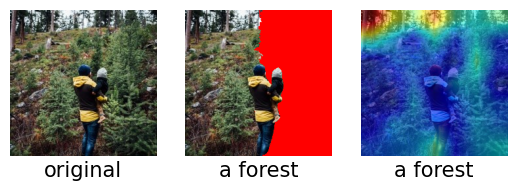

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a child
Query dependency is: det dobj
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0038610999999946216 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 17%|██████████████                                                                      | 1/6 [00:00<00:04,  1.25it/s]

0.23363164 / 0.0712093431122449



 33%|████████████████████████████                                                        | 2/6 [00:01<00:03,  1.18it/s]

0.25191927 / 0.02166374362244898



 50%|██████████████████████████████████████████                                          | 3/6 [00:02<00:02,  1.14it/s]

0.19297367 / 0.9109335140306123



 67%|████████████████████████████████████████████████████████                            | 4/6 [00:03<00:01,  1.16it/s]

0.2264696 / 0.08906648596938775



 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:04<00:00,  1.21it/s]

0.21584776 / 0.9821428571428571



100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:04<00:00,  1.21it/s]


0.19133674 / 0.9325972576530612

measuring similarity score for 6 segments is done in 4.982091299999411 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (5.002080499999465 sec)!



3it [00:00, 192.07it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:10<00:20, 10.18s/it]

0.60604304 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:22<00:11, 11.32s/it]

0.5940954 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:31<00:00, 10.65s/it]

0.46294904 / 1

measuring similarity score for 3 segments is done in 31.962510199999997 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.6060430407524109
Stage 2 is done in less than 1 min (32.04050610000013 sec)!
Caption: a man carrying a child through a forest
Query: a child
Answer similarity score: 1


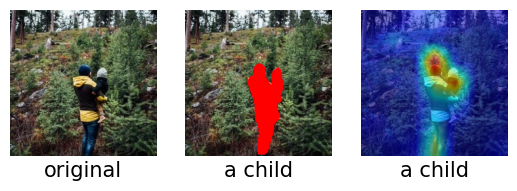

Setting blurring kernel size!
Manual setting!
Blurring kernel size is: 120
Query is a man
Query dependency is: det ROOT
Query accepted!
Generating segments!
Instance segmentation segments are READY!
Low-level segmentation segments are READY!
Segments generation is done in less than 1 min (0.0031641000005038222 sec)!
Stage 1 ...
stage 1 calculate_similarity_scores starts



 17%|██████████████                                                                      | 1/6 [00:00<00:02,  1.71it/s]

0.2218145 / 0.0712093431122449



 33%|████████████████████████████                                                        | 2/6 [00:01<00:02,  1.35it/s]

0.22203852 / 0.02166374362244898



 50%|██████████████████████████████████████████                                          | 3/6 [00:02<00:02,  1.21it/s]

0.18238363 / 0.9109335140306123



 67%|████████████████████████████████████████████████████████                            | 4/6 [00:03<00:01,  1.22it/s]

0.22082427 / 0.08906648596938775



 83%|██████████████████████████████████████████████████████████████████████              | 5/6 [00:03<00:00,  1.22it/s]

0.2051022 / 0.9821428571428571



100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:04<00:00,  1.24it/s]


0.1827883 / 0.9325972576530612

measuring similarity score for 6 segments is done in 4.8704237999991165 seconds...

stage 1 calculate_similarity_scores is done
stage 1 score: 1
Stage 1 is done in less than 1 min (4.8907460999998875 sec)!



3it [00:00, 174.38it/s]


stage 2 calculate_similarity_scores starts



 33%|████████████████████████████                                                        | 1/3 [00:13<00:26, 13.12s/it]

0.5500208 / 1



 67%|████████████████████████████████████████████████████████                            | 2/3 [00:22<00:10, 10.83s/it]

0.5335531 / 1



100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:30<00:00, 10.30s/it]

0.318433 / 1

measuring similarity score for 3 segments is done in 30.90503279999939 seconds...

stage 2 calculate_similarity_scores is done
stage 2 score: 0.5500208139419556
Stage 2 is done in less than 1 min (30.973177800000485 sec)!
Caption: a man carrying a child through a forest
Query: a man
Answer similarity score: 1


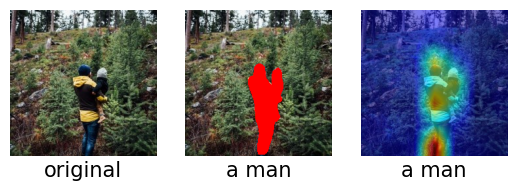

100%|███████████████████████████████████████████████████████████████████████████████| 27/27 [1:24:08<00:00, 187.00s/it]


In [3]:
if exp_mode:
    log_print('Experiments mode :::')
    proceed = input('48 experiment will be executed!! Do you want to proceed? (y/n)')
    if proceed.lower()=='y':

        seg_datasets = ['coco', 'lvis']
        clip_modes = ['0', '1', 'both']
        pobj_modes = ['True', 'Flase']
        stage_hi_sims = ['True', 'Flase']
        blur_ksizes = ['auto', '120']

        for seg_dataset in seg_datasets:
            for clip_mode in clip_modes:
                for pobj_mode in pobj_modes:
                    for stage_hi_sim in stage_hi_sims:
                        for blur_ksize in blur_ksizes:
                            log_print(f'Running: seg_dataset={seg_dataset}, clip_mode={clip_mode}, pobj_mode={str(pobj_mode)}, blur_ksize={blur_ksize}, stage_hi_sim={stage_hi_sim}')

                            CaptioningModel = IC()

                            InstanceSegModel = InstanceSegmenter(dataset=seg_dataset, backbone=seg_backbone)

                            RandomSegModel = RandomSegmenter(algo_type=algorithm, kernel_size=seg_ksize, \
                                                                max_dist=max_dist, ratio=ratio, random_seed=42)

                            ExplainerModel = Explainer(captioner=CaptioningModel, instance_seg=InstanceSegModel, random_seg=RandomSegModel, \
                                                        text_encoder=text_encoder, blur_ksize=blur_ksize, clip_mode=clip_mode, stage_hi_sim=stage_hi_sim, \
                                                        pobj_mode=pobj_mode, improved_XIC=improved_XIC)


                            images_dir = f'{test_dir}/{seg_dataset}/images_dir/'

                            exp_details = f'{blur_ksize}_{clip_mode}_{str(pobj_mode)}_{str(improved_XIC)}_{str(stage_hi_sim)}'
                            save_dir = f'{test_dir}/{seg_dataset}/save_dir/{exp_details}/'
                                
                            run_test = False

                            if not os.path.isdir(save_dir):
                                log_print(f"creating new directory: {save_dir}")
                                os.makedirs(save_dir)
                                run_test = True
                            else:
                                user_input = input(f"Directory: {save_dir} is already available, do you want to overwrite the content? (Y/N)\n")
                                if (user_input.lower() == 'y') or (user_input.lower() == 'yes'):
                                    log_print(f"overwriting available directory: {save_dir}")
                                    run_test = True
                                    
                            if run_test: ExplainerModel.test_images(images_dir=images_dir, save_dir=save_dir)

                            log_print(f'Finished: dataset={dataset}, seg_dataset={seg_dataset}, clip_mode={clip_mode}, pobj_mode={str(pobj_mode)}, blur_ksize={blur_ksize}, stage_hi_sim={stage_hi_sim}')
elif test_mode:
    pass

else:
    CaptioningModel = IC()

    InstanceSegModel = InstanceSegmenter(dataset=seg_dataset, backbone=seg_backbone)

    RandomSegModel = RandomSegmenter(algo_type=algorithm, kernel_size=seg_ksize, \
                                        max_dist=max_dist, ratio=ratio, random_seed=42)

    ExplainerModel = Explainer(captioner=CaptioningModel, instance_seg=InstanceSegModel, random_seg=RandomSegModel, \
                                text_encoder=text_encoder, blur_ksize=blur_ksize, clip_mode=clip_mode, stage_hi_sim=stage_hi_sim, \
                                pobj_mode=pobj_mode, improved_XIC=improved_XIC)

    if False:
        ExplainerModel.explain(args.image_path)
    else:
        images_dir = f'{test_dir}/images_dir/'
        exp_details = f'{blur_ksize}_{clip_mode}_{str(pobj_mode)}_{str(improved_XIC)}'
        save_dir = f'{test_dir}/save_dir/{exp_details}/'

        run_test = False

        if not os.path.isdir(save_dir):
            print(f"creating new directory: {save_dir}")
            os.makedirs(save_dir)
            run_test = True
        else:
            user_input = input(f"Directory: {save_dir} is already available, do you want to overwrite the content? (Y/N)\n")
            if (user_input.lower() == 'y') or (user_input.lower() == 'yes'):
                run_test = True
        
        if run_test: 
            ExplainerModel.test_images(images_dir=images_dir, save_dir=save_dir)